**Bernardo José Llamas Verna (47286447B)**

# Análisis de la Demanda Eléctrica en España (2014-2021)

## Abstract

Debido a las convulsiones del mercado eléctrico español que han provocado una alta variabilidad de los precios, con crecimientos históricos de los mismos y el debate en torno a una transición ecológica, la motivación del presente trabajo es la de analizar la demanda de energía en el Estado español como una serie temportal para el período 2014-2021, así como la elaboración de modelos predictivos.

Se comenzará realizando un análisis global del consumo para entender sus patrones, identificando posibles tendencias y estacionalidades para luego ir pasando a un enfoque más granular en el que poder identificar los meses en los que se concentran los picos y valles de consumo, si afectan o no los días de la semana, festivos y variables exógenas como la temperatura. 

Por último, se estudiarán las métricas de los diferentes modelos de predicción para ver cómo ayuda (o penaliza) la adición de variables exógenas a la predicción de la demanda eléctrica.

## 0. Importación de librerías

In [2]:
#TODO: limpiar librerías y paquetes no empleados

In [1]:
# import datetime
import itertools
import string

import chart_studio
import chart_studio.plotly as py
import matplotlib.pyplot as plt
import matplotlib as mpl
import numpy as np
import pandas as pd
import plotly.express as px
import plotly.figure_factory as ff
import plotly.graph_objs as go
import requests
import seaborn as sns
import statsmodels.graphics.tsaplots as sgt

from datetime import datetime
from statsmodels.tsa.stattools import kpss
from prophet import Prophet
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score, mean_absolute_percentage_error
from sklearn.model_selection import train_test_split, cross_val_score, KFold
from sklearn.metrics import mean_squared_error
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.statespace.sarimax import SARIMAX
from xgboost import XGBRegressor

**Funciones**

Se incluyen también las funciones que se van a emplear para calcular la estacionariedad y las métricas de los modelos.

In [2]:
def stationarity_test(data,
                      value,
                      start=None,
                      end=None,
                      fillna="interpolate",
                      autolag="AIC"):
    time_index = data.index
    
    # Subset
    if start < min(time_index):
        start = min(time_index)
    if end > max(time_index):
        end = max(time_index)
    subset = data[(time_index >= start) & (time_index <= end)][value]

    if fillna.lower() == "interpolate":
        subset = subset.interpolate()
    elif fillna.lower() == "ffill":
        subset = subset.ffill()
    elif fillna.lower() == "bfill":
        subset = subset.bfill()
    else:
        return f"Invalid fillna parameter. Expected one of interpolate, ffill, bfill, got {fillna}."

    # ADF and KPSS tests
    adf_output=adfuller(subset, autolag=autolag)
    kpss_output=kpss(subset)

    # Parsing results
    def print_results(output, test='adf'):
        '''
        Print results for either "ADF" or "KPSS" tests.
        '''
        pval = output[1]
        test_score = output[0]
        lags = output[2]
        decision = 'Non-Stationary'
        if test == 'adf':
            if pval < 0.05:
                decision = 'Stationary'
        elif test=='kpss':
            if pval >= 0.05:
                decision = 'Stationary'
        output_dict = {
        'Test Statistic': round(test_score, 4),
        'p-value': round(pval, 4),
        'Lags Used': lags,
        'Decision': decision
    }
        return pd.Series(output_dict, name=test)

    results_df=pd.concat([
        print_results(adf_output), print_results(kpss_output, test="kpss")
    ], axis=1)

    return results_df

In [3]:
def _error(actual: np.ndarray, predicted: np.ndarray):
    """ Simple error """
    return actual - predicted

In [4]:
def _naive_forecasting(actual: np.ndarray, seasonality: int = 1):
    """ Naive forecasting method which just repeats previous samples """
    return actual[:-seasonality]

In [5]:
def _relative_error(actual: np.ndarray, predicted: np.ndarray, benchmark: np.ndarray = None):
    """ Relative Error """
    if benchmark is None or isinstance(benchmark, int):
        # If no benchmark prediction provided - use naive forecasting
        if not isinstance(benchmark, int):
            seasonality = 1
        else:
            seasonality = benchmark
        return _error(actual[seasonality:], predicted[seasonality:]) /\
               (_error(actual[seasonality:], _naive_forecasting(actual, seasonality)) + EPSILON)

    return _error(actual, predicted) / (_error(actual, benchmark) + EPSILON)

In [6]:
def _geometric_mean(a, axis=0, dtype=None):
    """ Geometric mean """
    if not isinstance(a, np.ndarray):  # if not an ndarray object attempt to convert it
        log_a = np.log(np.array(a, dtype=dtype))
    elif dtype:  # Must change the default dtype allowing array type
        if isinstance(a, np.ma.MaskedArray):
            log_a = np.log(np.ma.asarray(a, dtype=dtype))
        else:
            log_a = np.log(np.asarray(a, dtype=dtype))
    else:
        log_a = np.log(a)
    return np.exp(log_a.mean(axis=axis))

In [7]:
def gmrae(actual: np.ndarray, predicted: np.ndarray, benchmark: np.ndarray = None):
    """ Geometric Mean Relative Absolute Error """
    return _geometric_mean(np.abs(_relative_error(actual, predicted, benchmark)))

In [8]:
def mdrae(actual: np.ndarray, predicted: np.ndarray, benchmark: np.ndarray = None):
    """ Median Relative Absolute Error """
    return np.median(np.abs(_relative_error(actual, predicted, benchmark)))

In [9]:
def mase(training_series, testing_series, prediction_series): 
    n = training_series.shape[0]
    d = np.abs(  np.diff( training_series) ).sum()/(n-1)
    
    errors = np.abs(testing_series - prediction_series )
    return errors.mean()/d

In [10]:
def smape(a, f):
    return 1/len(a) * np.sum(2 * np.abs(f-a) / (np.abs(a) + np.abs(f))*100)

**Datasets**

In [11]:
global_path = '/home/berni/Documentos/tfm_data_science/version_0/Electric_Demand_Refactor/'
energy_datasets = global_path + 'data/energy_demand_data/energy_demand_datasets/'
temperature_datasets = global_path + 'data/temperature_data/temperature_datasets/'

## 1. Análisis Exploratorio de Datos

Los datos de demanda energética que se van a emplear en el presente trabajo han sido extraídos de la API E-SIOS de Red Eléctrica, permitiendo obtener los datos de forma cómoda con diferentes intervalos de tiempo (horario, diario, mensual, anual, etc).

El proceso de extracción, limpieza y preparación están explicados en el notebook `energy_demand_data_extraction.ipynb`.

### 1.1. Demanda Eléctrica como serie temporal

En este apartado se va a realizar un análisis de la demanda energética distribuida con frecuencia mensual y diaria-horaria.

#### 1.1.1. Distribución mensual de la demanda eléctrica

In [12]:
energy_demand_monthly = pd.read_csv(energy_datasets + 'monthly/energy_demand_monthly.csv')
energy_demand_monthly['date'] = pd.to_datetime(energy_demand_monthly.date)
energy_demand_monthly.set_index("date", inplace=True)
energy_demand_monthly = energy_demand_monthly.resample('MS').first()
energy_demand_monthly.index.freq

<MonthBegin>

In [13]:
energy_demand_monthly.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 96 entries, 2014-01-01 to 2021-12-01
Freq: MS
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   value   96 non-null     float64
dtypes: float64(1)
memory usage: 1.5 KB


El dataset cuenta con 96 registros no nulos en 2 columnas: `date` y `value`.

Un ejemplo de los valores del dataset son los siguientes valores.

In [14]:
energy_demand_monthly.head()

,value
date,
2014-01-01,131911180.0
2014-02-01,121688438.0
2014-03-01,124724746.0
2014-04-01,112057243.0
2014-05-01,116035410.0


Las unidades de la columna `value` son los valores de la demanda de energía medidos en `Mwh`.

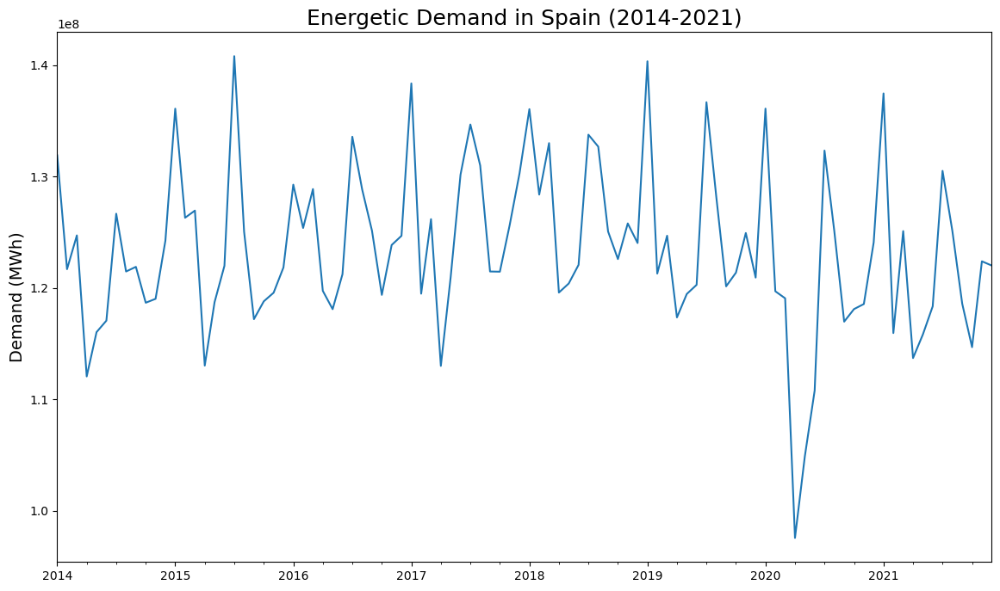

In [15]:
blue, organge = sns.color_palette()[:2]
energy_demand_monthly.plot(figsize=(14,8), legend=None, color=blue)
plt.title("Energetic Demand in Spain (2014-2021)", size = 18)
plt.xlabel("")
plt.ylabel("Demand (MWh)", size = 14)
plt.show()

Se puede apreciar cómo la demanda de energía oscila de forma periódica a lo largo del tiempo con unos máximos y mínimos dentro de un margen bien definido entre (1.1-1.4)*10^8 Mwh, excepto en 2020 donde se produce una caída abrupta que coincide con la irrupción del COVID-19 en España y el inicio del confinamiento estricto que duró casi 3 meses. Después se puede ver cómo remonta la demanda de energía coincidiendo con la vuelta a cierta normalidad.

En cada año, los picos máximos de demanda se producen a principios de año y en los meses de verano debido a la mayor necesidad de energía en los hogares ya sea para calefacción o aire acondicionado, respectivamente. Por otra parte, los meses de menor consumo son los correspondientes a los meses de primavera y otoño.

La distribución de la demanda de energía por año y mes sería la siguiente.

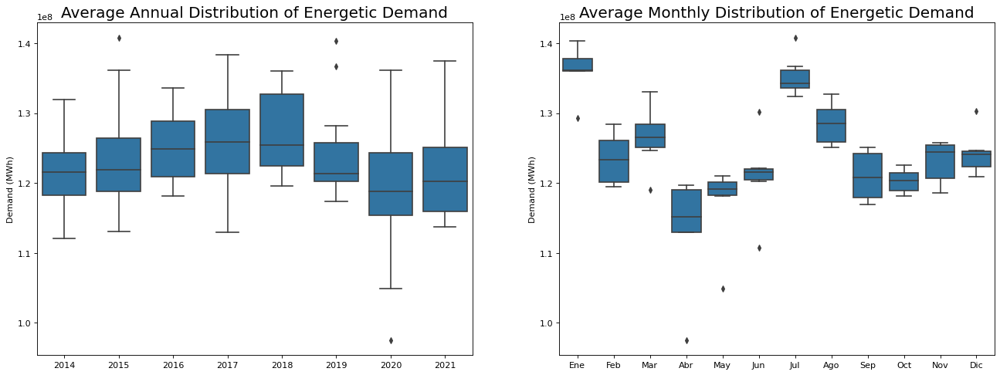

In [16]:
# Import Data
df = pd.read_csv(energy_datasets + 'monthly/energy_demand_monthly.csv', parse_dates=['date'], index_col='date')
df.reset_index(inplace=True)

# Prepare data
df['year'] = [d.year for d in df.date]
df['month'] = [d.strftime('%b') for d in df.date]
years = df['year'].unique()

month_map= {0:'Ene', 1:'Feb', 2:'Mar', 3:'Abr', 
            4:'May', 5:'Jun', 6:'Jul', 7:'Ago', 
            8:'Sep', 9:'Oct', 10:'Nov', 11:'Dic'}

md = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]

# Draw Plot
fig, axes = plt.subplots(1, 2, figsize=(20,7), dpi= 80)
sns.boxplot(x='year', y='value', data=df, ax=axes[0], color=blue)
sns.boxplot(x='month', y='value', data=df.loc[~df.year.isin([2014, 2021]), :], color=blue)

# Set Title
axes[0].set_title('Average Annual Distribution of Energetic Demand', fontsize=18); 
axes[0].set(xlabel=''); 
axes[0].set(ylabel='Demand (MWh)'); 

axes[1].set_title('Average Monthly Distribution of Energetic Demand', fontsize=18)
axes[1].set(xlabel=''); 
axes[1].set(ylabel='Demand (MWh)'); 
xlabels = [month_map[d] for d in md]
axes[1].set_xticklabels(xlabels)
plt.show()

La demanda anual permite ver una tendencia a lo largo del tiempo, mientras que la demanda mensual nos permite ver si hay estacionalidad.

Para la demanda anual, se puede apreciar cómo crece en promedio de 2014 a 2017-2018, para luego ir cayendo de forma sostenida. Esto puede deberse a un período de crisis económica o a un proceso descontinuado de desindustrialización.

En cuanto a la demanda mensual, se confirma lo previamente mencionado: los mayores consumos se producen en los meses de invierno (diciembre-marzo) y verano (julio-agosto), mientras que los de menor consumo se corresponden con los meses de primavera (abril-junio) y otoño (septiembre-noviembre).

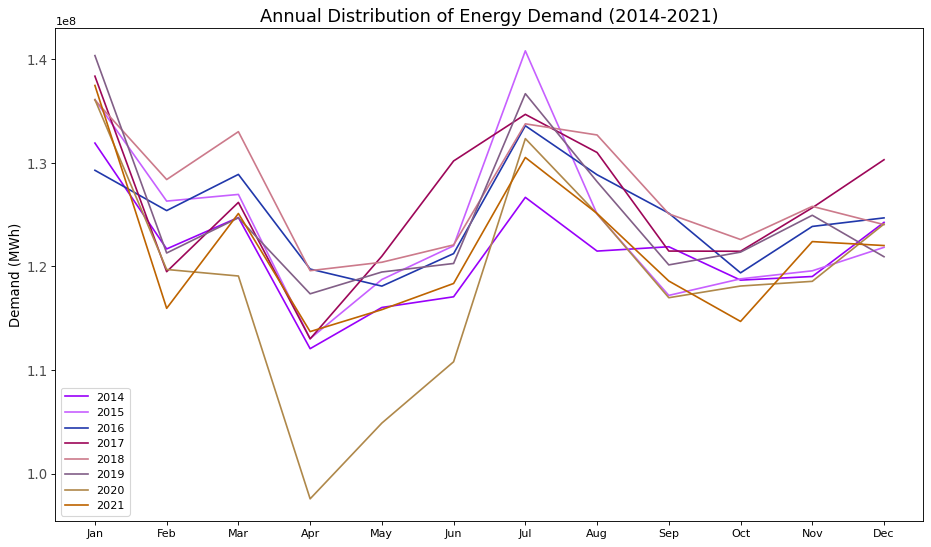

In [17]:
# Prep Colors
np.random.seed(100)
mycolors = np.random.choice(list(mpl.colors.XKCD_COLORS.keys()), len(years), replace=False)

# Draw Plot
plt.figure(figsize=(14, 8), dpi= 80)
for i, y in enumerate(years):
    if i >= 0:        
        plt.plot('month', 'value', data=df.loc[df.year==y, :], color=mycolors[i], label=y)

plt.yticks(fontsize=12, alpha=.7)
plt.title("Annual Distribution of Energy Demand (2014-2021)", fontsize=16)
plt.legend()
plt.ylabel("Demand (MWh)", fontsize=12)
plt.show()

Con la representación anual superpuesta, se puede apreciar cómo cada año se repiten los patrones de demanda de energía en los mismos meses.

Destaca 2015 con el máximo valor registrado en la serie en el mes de julio, mientras que el valor mínimo aparece en abril de 2020, durante el confinamiento por el COVID-19.

En 2017, una vez alcanzado el mínimo de demanda en abril, la demanda de energía crece de forma rápida manteniendo valores muy cercanos en los meses de junio, julio y agosto, dando a entender que fue un año bastante caluroso no solo en julio. En ese aspecto, también destaca 2018 por tener un consumo muy parecido entre julio y agosto.

De la tendencia y estacionalidad se pueden obtener conclusiones parecidas descomponiendo la señal en sus 3 componentes: tendencia, estacionalidad y ruido.

/tmp/ipykernel_5437/3059136880.py:4: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


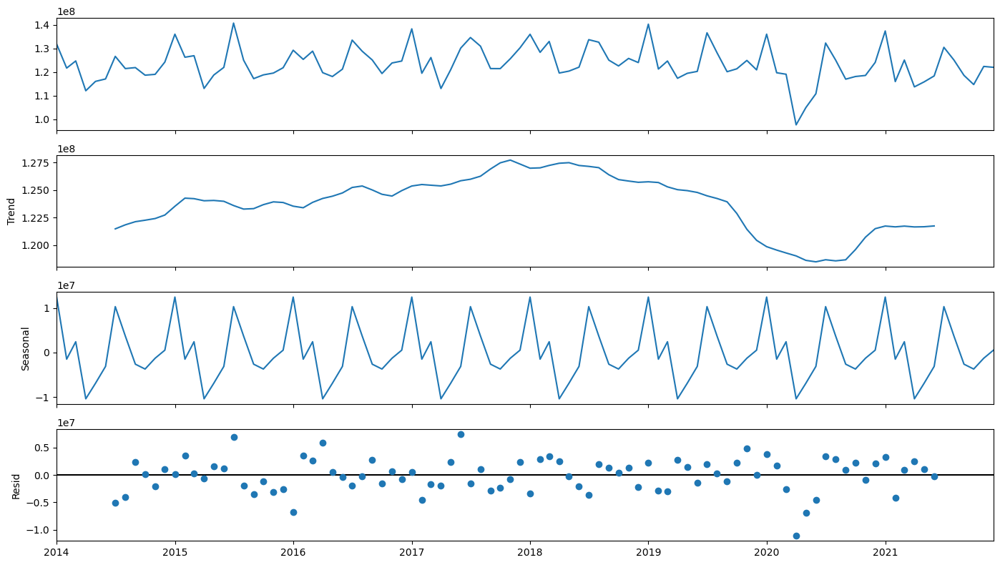

In [18]:
result = seasonal_decompose(energy_demand_monthly, model='additive', period=12)
fig = result.plot()
fig.set_size_inches((14, 8))
fig.tight_layout()
plt.show()

En cuanto a la tendencia, se puede apreciar mejor cómo la mayor demanda se alcanza a finales de 2017 para luego seguir un decaimiento progresivo.

**Estacionariedad**

Sobre la estacionariedad de la serie temporal, aplicamos la función `stationarity_test` el cual aplica los tests `Augmented Dickey-Fuller (ADF)` y `Kwiatkowski-Phillips-Schmidt-Shin (KPSS)`.

Las diferentes casuísticas que se pueden dar son las siguientes:
* **Caso 1:** Ambos tests concluyen que la serie es no-estacionaria. 
* **Caso 2:** Ambos tests concluyen que la serie es estacionaria.
* **Caso 3:** KPSS indica que es estacionaria, mientras que ADF indica que es no-estacionaria. La serie se convierte en estacionaria eliminando la tendencia.
* **Caso 4:** KPSS indica que es no-estacionaria, mientras que ADF indica que es estacionaria. La serie se convierte en estacionaria a través de la diferenciación.

In [19]:
stationarity_test(energy_demand_monthly,
                  value="value",
                  start=datetime(2014, 1, 1),
                  end=datetime(2021, 12, 1))

/tmp/ipykernel_5437/2138919861.py:27: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  kpss_output=kpss(subset)


,adf,kpss
Test Statistic,-1.3636,0.2437
p-value,0.5996,0.1
Lags Used,12,2
Decision,Non-Stationary,Stationary


Como se puede apreciar, se cumple el **Caso 3**. Por lo tanto, para hacerla estacionaria se requiere eliminar la tendencia.

Se elimina la tendencia usando la diferenciación.

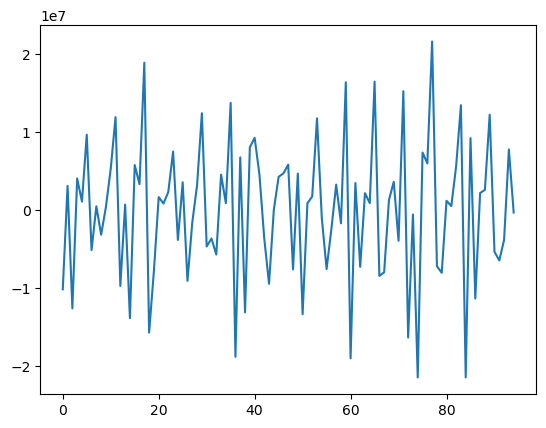

In [35]:
X = energy_demand_monthly.values
diff = list()
for i in range(1, len(X)):
    value = X[i] - X[i - 1]
    diff.append(value)
plt.plot(diff)
plt.show()

Se añade los nuevos valores al dataframe y se elimina el primer registro.

In [39]:
energy_demand_monthly_detrended = energy_demand_monthly
energy_demand_monthly_detrended = energy_demand_monthly_detrended.drop(energy_demand_monthly_detrended.index[0])
energy_demand_monthly_detrended['value_detrended'] = diff
energy_demand_monthly_detrended

,value,value_detrended
date,,
2014-02-01,121688438.0,[-10222742.0]
2014-03-01,124724746.0,[3036308.0]
2014-04-01,112057243.0,[-12667503.0]
2014-05-01,116035410.0,[3978167.0]
2014-06-01,117067589.0,[1032179.0]
...,...,...
2021-08-01,125111628.0,[-5407094.0]
2021-09-01,118590191.0,[-6521437.0]
2021-10-01,114687519.0,[-3902672.0]


In [40]:
stationarity_test(energy_demand_monthly_detrended,
                  value="value_detrended",
                  start=datetime(2014, 2, 1),
                  end=datetime(2021, 12, 1))

/tmp/ipykernel_5437/2138919861.py:27: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  kpss_output=kpss(subset)


,adf,kpss
Test Statistic,-4.3748,0.0144
p-value,0.0003,0.1
Lags Used,11,2
Decision,Stationary,Stationary


Se puede apreciar cómo eliminando la tendencia la serie temporal mensual se convierte en estacionaria para ambos tests. Esta serie estacionaria se empleará para el modelo SARIMAX.

**Autocorrelación (ACF, PACF)**

Antes de construir los modelos se precisa saber cómo se correlacionan los datos entre sí mediante las funciones de autocorrelación (ACF) y las funciones de autocorrelación parcial (PACF). Los análisis de autocorrelación ayudan a detectar patrones ocultos y estacionalidad, así como buscar aleatoriedad.

ACF mide y dibuja la correlación promedio entre los datos de una serie temporal y sus valores previos para diferentes valores de retrasos (lags). 

PACF es similar a ACF excepto en que cada correlación parcial controla para alguna correlación entre las observaciones para longitudes de retrasos más cortas.

Gracias a ACF se pueden responder las siguientes preguntas:
* ¿es la serie temporal ruido blanco o random?
* ¿una observación está relacionada con su adyacente?...¿y la siguiente? ¿y la siguiente?
* ¿la serie temporal se puede describir con un modelo MA? ¿de qué orden?

Mientras que PACF:
* ¿la serie temporal se puede modelar con un modelo AR? ¿de qué orden?

Por lo tanto, el valor de un ACF y PACF en el primer retraso es igual porque ambos miden la correlación entre datos en un tiempo t con puntos atrasados un tiempo t-1. Sin embargo, en el segundo retraso, la ACF mide la correlación entre los puntos en un instante t con los puntos en un instante t-2, mientras que PACF mide la misma correlación, pero después de controlar la correlación entre los puntos en un instante t con los que están en t-1.

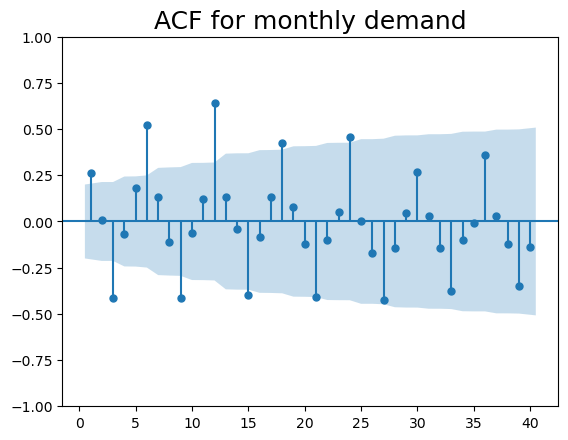

In [41]:
sgt.plot_acf(energy_demand_monthly, zero = False, lags = 40)
plt.title("ACF for monthly demand", size = 18)
plt.show()

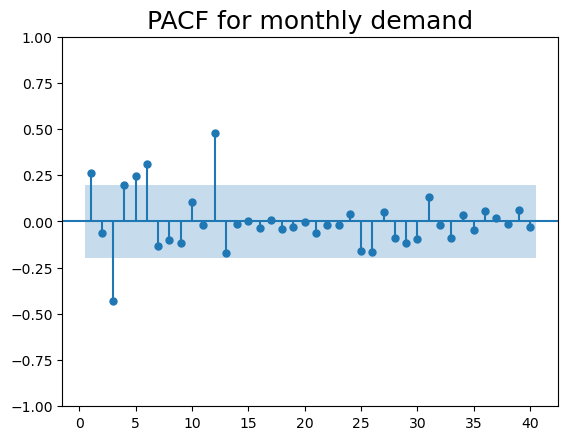

In [42]:
sgt.plot_pacf(energy_demand_monthly, zero = False, lags = 40)
plt.title("PACF for monthly demand", size = 18)
plt.show()

Los valores dentro del área azul en ambas gráficas indican que son es estadísticamente cercanos a cero, mientras que sí que es estadísticamente significativo todo lo que hay fuera.

En ACF se puede ver una fuerte correlación positiva con el primer y tercer valor. Más adelante aparecen fuertes correlaciones negativas y positivas cada 3 valores (3, 6, 9, etc) destacando 12 y 24.

En PACF, por otro lado, hay una fuerte correlación positiva con el valor 1, negativa en el valor 3, en los valores 4, 5 y 6 y de nuevo destaca el valor 12.

Podemos explicar la fuerte correlación con 12, sus múltiplos y divisores, por el marcado período de 12 meses que tiene la serie.

In [31]:
########################################################################################################

### 1.3) Distribución diaria-horaria

In [4]:
energy_demand_hourly = pd.read_csv('demanda_electrica_hora_weekday.csv')

# new column date as date+hour:
energy_demand_hourly['date'] = pd.to_datetime(energy_demand_hourly.date) + pd.to_timedelta(energy_demand_hourly.hour, unit='h')
del energy_demand_hourly['hour']

# convert date as index:
energy_demand_hourly.set_index("date", inplace=True)

# set freq as hourly:
energy_demand_hourly = energy_demand_hourly.resample('H').first()
energy_demand_hourly.index.freq

<Hour>

### 1.4) Distribución diaria

#### a) Distribución diaria con día de la semana y festivos

In [5]:
energy_demand_daily = pd.read_csv('demanda_electrica_diaria.csv')
energy_demand_daily.set_index("date", inplace=True)

energy_demand_daily.index.freq = 'D'

In [6]:
energy_demand_daily.head()

,value,weekday,working_day
date,,,
2014-01-01,3315035.0,2,0
2014-01-02,4059590.0,3,1
2014-01-03,4098986.0,4,1
2014-01-04,3867911.0,5,1
2014-01-05,3648038.0,6,1


#### b) Distribución diaria con día de la semana, festivos y temperatura

In [7]:
energy_demand_daily_temp = pd.read_csv('demanda_day_temp_resume_total.csv')
energy_demand_daily_temp.set_index("date", inplace=True)

energy_demand_daily_temp.index.freq = 'D'

energy_demand_daily_temp

,value,weekday,working_day,madrid_temp,barcelona_temp,bilbao_temp,sevilla_temp,valencia_temp
date,,,,,,,,
2014-01-01,3315035.0,2.0,0.0,6.785193,8.006851,11.418970,12.184413,13.189499
2014-01-02,4059590.0,3.0,1.0,9.109185,10.764683,12.935602,14.524325,15.136449
2014-01-03,4098986.0,4.0,1.0,9.776889,11.935958,13.029657,15.653018,16.565861
2014-01-04,3867911.0,5.0,1.0,6.703811,11.307489,9.814500,14.106683,14.699295
2014-01-05,3648038.0,6.0,1.0,5.285333,8.682916,9.971085,10.653680,10.970076
...,...,...,...,...,...,...,...,...
2021-12-27,3686647.0,0.0,1.0,11.606002,13.531011,14.285517,17.009720,17.443636
2021-12-28,3729169.0,1.0,1.0,9.792129,14.261092,14.133620,16.015375,16.007968
2021-12-29,3692921.0,2.0,1.0,8.401157,13.250848,12.936356,13.320164,15.173263


#### c) Distribución diaria con día de la semana, festivos, temperatura e indicativo estacional

In [8]:
energy_demand_daily_temp_seasonal = pd.read_csv('demanda_day_temp_seasonal_resume.csv')
energy_demand_daily_temp_seasonal.set_index("date", inplace=True)

energy_demand_daily_temp_seasonal.index.freq = 'D'

energy_demand_daily_temp_seasonal

,value,weekday,working_day,madrid_temp,barcelona_temp,bilbao_temp,sevilla_temp,valencia_temp,is_winter,is_summer
date,,,,,,,,,,
2014-01-01,3315035.0,2.0,0.0,6.785193,8.006851,11.418970,12.184413,13.189499,1,0
2014-01-02,4059590.0,3.0,1.0,9.109185,10.764683,12.935602,14.524325,15.136449,1,0
2014-01-03,4098986.0,4.0,1.0,9.776889,11.935958,13.029657,15.653018,16.565861,1,0
2014-01-04,3867911.0,5.0,1.0,6.703811,11.307489,9.814500,14.106683,14.699295,1,0
2014-01-05,3648038.0,6.0,1.0,5.285333,8.682916,9.971085,10.653680,10.970076,1,0
...,...,...,...,...,...,...,...,...,...,...
2021-12-27,3686647.0,0.0,1.0,11.606002,13.531011,14.285517,17.009720,17.443636,1,0
2021-12-28,3729169.0,1.0,1.0,9.792129,14.261092,14.133620,16.015375,16.007968,1,0
2021-12-29,3692921.0,2.0,1.0,8.401157,13.250848,12.936356,13.320164,15.173263,1,0


#### d) Distribución diaria 2014-2022 (hasta Febrero) con día de la semana, festivos, temperatura e indicativo estacional

In [9]:
energy_demand_daily_temp_seasonal_2014_2022 = pd.read_csv('demanda_diaria_resume_2014_2022.csv')
energy_demand_daily_temp_seasonal_2014_2022.set_index("date", inplace=True)

energy_demand_daily_temp_seasonal_2014_2022.index.freq = 'D'

energy_demand_daily_temp_seasonal_2014_2022

,value,weekday,working_day,madrid_temp,barcelona_temp,bilbao_temp,sevilla_temp,valencia_temp,is_winter,is_summer
date,,,,,,,,,,
2014-01-01,3315035.0,2,0,4.69985,4.82314,7.79263,9.41128,10.86538,1,0
2014-01-01,3315035.0,2,0,4.59854,4.57510,6.95278,9.13394,10.87760,1,0
2014-01-01,3315035.0,2,0,4.65054,4.45498,6.63174,9.30117,10.91030,1,0
2014-01-01,3315035.0,2,0,4.71353,4.49868,7.63442,9.53726,10.86562,1,0
2014-01-01,3315035.0,2,0,4.80654,4.52236,9.08853,9.85757,10.86440,1,0
...,...,...,...,...,...,...,...,...,...,...
2022-02-28,3860129.0,0,1,12.50210,10.57730,13.41200,17.05532,12.37148,1,0
2022-02-28,3860129.0,0,1,10.96010,10.00160,10.66055,15.38467,11.31730,1,0
2022-02-28,3860129.0,0,1,9.48380,9.52505,9.47500,13.25698,10.29922,1,0


#### e) Datos demanda marzo 2022

In [10]:
energy_demand_daily_march_2022 = pd.read_csv('demanda_dataframe_marzo_2022.csv')
energy_demand_daily_march_2022.set_index("date", inplace=True)

energy_demand_daily_march_2022.index.freq = 'D'

energy_demand_daily_march_2022

,value,weekday,working_day,is_winter,is_summer
date,,,,,
2022-03-01,4134510.0,1,1,1,0
2022-03-02,4181750.0,2,1,1,0
2022-03-03,4226210.0,3,1,1,0
2022-03-04,4204637.0,4,1,1,0
2022-03-05,3722126.0,5,1,1,0
2022-03-06,3497731.0,6,1,1,0
2022-03-07,4173965.0,0,1,1,0
2022-03-08,4181348.0,1,1,1,0
2022-03-09,4132968.0,2,1,1,0


## 2) Análisis Exploratorio de datos

### 2.1) Análisis Mensual

Vamos a comenzar realizando una primera aproximación de los datos a través del dataset de demanda mensual. Para ello cargamos los datos:

In [11]:
energy_demand_monthly.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 96 entries, 2014-01-01 to 2021-12-01
Freq: MS
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   value   96 non-null     float64
dtypes: float64(1)
memory usage: 1.5 KB


Tenemos 96 registros no nulos en 2 columnas: `date` y `value`. Los valores serían del estilo:

In [12]:
energy_demand_monthly.head()

,value
date,
2014-01-01,132056990.0
2014-02-01,121688438.0
2014-03-01,124724746.0
2014-04-01,112057243.0
2014-05-01,116035410.0


Las unidades de la columna `value` son los valores de la demanda de energía en `Mwh`.

Ahora vamos a pasar a representar nuestros datos, pero antes convertimos `date` en índice:

In [13]:
blue, organge = sns.color_palette()[:2]

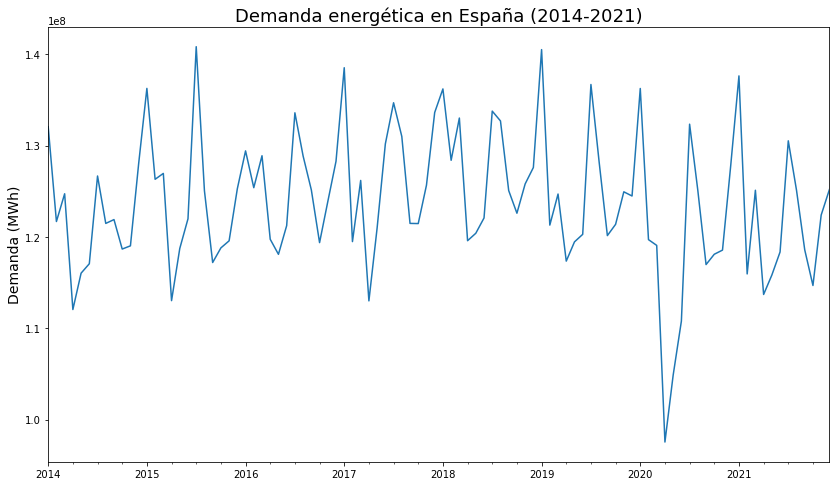

In [14]:
energy_demand_monthly.plot(figsize=(14,8), legend=None, color=blue)
plt.title("Demanda energética en España (2014-2021)", size = 18)
plt.xlabel("")
plt.ylabel("Demanda (MWh)", size = 14)
plt.show()

Podemos ver en esta representación cómo la demanda de energía oscila de forma periódica a lo largo del tiempo con unos máximos y mínimos dentro de un margen bien definido entre (1.1-1.4)*10^8 Mwh, excepto en 2020 donde vemos una caída abrupta que coincide con la irrupción del COVID-19 en España y el inicio del confinamiento estricto que duró casi 3 meses. Después podemos ver cómo remonta la demanda de energía coincidiendo con la vuelta a cierta normalidad. 

Podemos intuir que el pico máximo cada año se produce a principios de año y en los meses de verano debido a la mayor necesidad de energía en los hogares para calefacción o aire acondicionado. Por otra parte, los meses de menor consumo son los correspondientes a los meses de primavera y otoño.

Vamos a ver cómo se distribuye la demanda de energía por año y mes en el intervalo de tiempo que tratamos. La demanda anual nos permite ver una tendencia a lo largo del tiempo, mientras que la demanda mensual nos permite ver si hay estacionalidad.

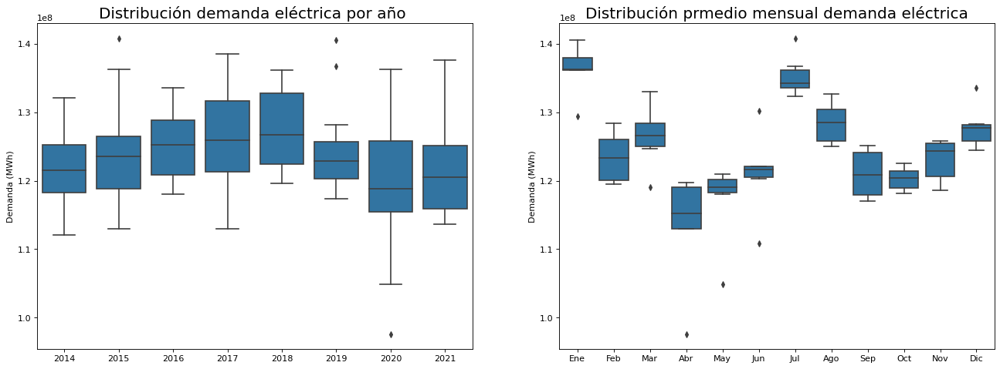

In [15]:
# Import Data
df = pd.read_csv('demanda_electrica_month.csv', parse_dates=['date'], index_col='date')
df.reset_index(inplace=True)

# Prepare data
df['year'] = [d.year for d in df.date]
df['month'] = [d.strftime('%b') for d in df.date]
years = df['year'].unique()

month_map= {0:'Ene', 1:'Feb', 2:'Mar', 3:'Abr', 
            4:'May', 5:'Jun', 6:'Jul', 7:'Ago', 
            8:'Sep', 9:'Oct', 10:'Nov', 11:'Dic'}

md = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]

# Draw Plot
fig, axes = plt.subplots(1, 2, figsize=(20,7), dpi= 80)
sns.boxplot(x='year', y='value', data=df, ax=axes[0], color=blue)
sns.boxplot(x='month', y='value', data=df.loc[~df.year.isin([2014, 2021]), :], color=blue)

# Set Title
axes[0].set_title('Distribución demanda eléctrica por año ', fontsize=18); 
axes[0].set(xlabel=''); 
axes[0].set(ylabel='Demanda (MWh)'); 

axes[1].set_title('Distribución prmedio mensual demanda eléctrica', fontsize=18)
axes[1].set(xlabel=''); 
axes[1].set(ylabel='Demanda (MWh)'); 
xlabels = [month_map[d] for d in md]
axes[1].set_xticklabels(xlabels)
plt.show()

En el primer gráfico, podemos ver cómo la media de la demanda de energía cada año sube hasta llegar al año 2018, a partir del cual se produce un descenso bastante notable en 2019 para caer aún más en 2020 y volver a remontar en 2021, aunque todavía bastante por debajo de 2018 y los años anteriores.

En el segundo gráfico confirmamos lo que habíamos dicho antes: los mayores consumos se producen en los meses de invierno (diciembre-marzo) y verano (julio-agosto), mientras que los de menor consumo se corresponden con los meses de primavera (abril-junio) y otoño (septiembre-noviembre).

Vamos a ver una comparativa de la demanda energética por año de forma superpuesta.

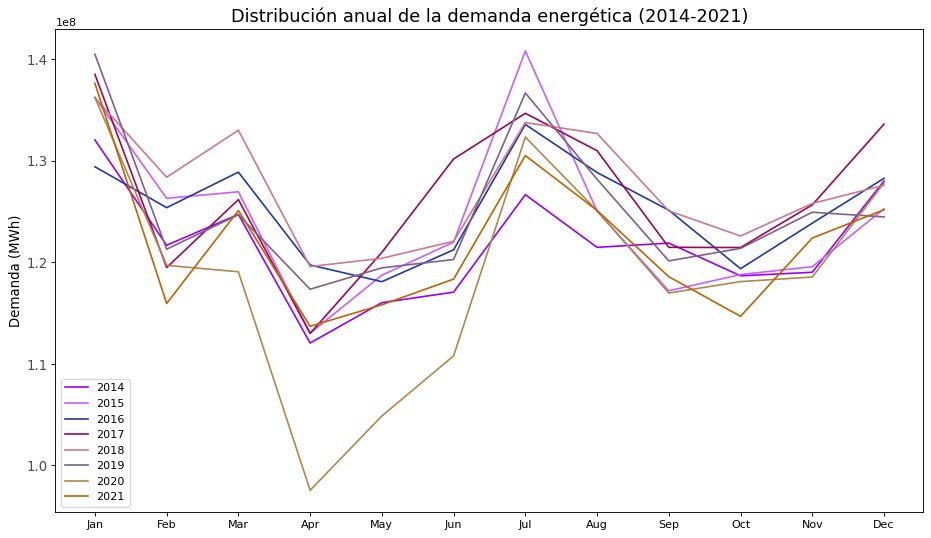

In [16]:
# Prep Colors
np.random.seed(100)
mycolors = np.random.choice(list(mpl.colors.XKCD_COLORS.keys()), len(years), replace=False)

# Draw Plot
plt.figure(figsize=(14, 8), dpi= 80)
for i, y in enumerate(years):
    if i >= 0:        
        plt.plot('month', 'value', data=df.loc[df.year==y, :], color=mycolors[i], label=y)
        # plt.text(df.loc[df.year==y, :].shape[0]-.9, df.loc[df.year==y, 'value'][-1:].values[0], y, fontsize=12, color=mycolors[i])

plt.yticks(fontsize=12, alpha=.7)
plt.title("Distribución anual de la demanda energética (2014-2021)", fontsize=16)
plt.legend()
plt.ylabel("Demanda (MWh)", fontsize=12)
plt.show()

/tmp/ipykernel_26783/2202138636.py:23: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(xlabels)


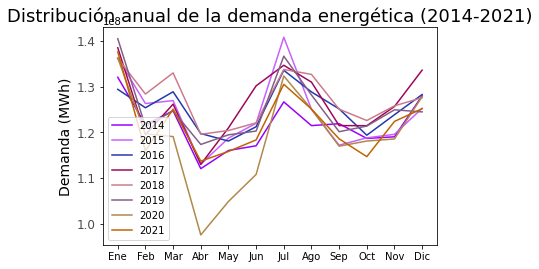

In [17]:
# Prep Colors
np.random.seed(100)
mycolors = np.random.choice(list(mpl.colors.XKCD_COLORS.keys()), len(years), replace=False)

# Draw Plot
fig, ax = plt.subplots()
month_map= {0:'Ene', 1:'Feb', 2:'Mar', 3:'Abr', 
            4:'May', 5:'Jun', 6:'Jul', 7:'Ago', 
            8:'Sep', 9:'Oct', 10:'Nov', 11:'Dic'}
md = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]

for i, y in enumerate(years):
    if i >= 0:        
        plt.plot('month', 'value', data=df.loc[df.year==y, :], color=mycolors[i], label=y)
        
        
plt.yticks(fontsize=12, alpha=.7)
plt.title("Distribución anual de la demanda energética (2014-2021)", fontsize=18)
plt.legend()
plt.ylabel("Demanda (MWh)", fontsize=14)

xlabels = [month_map[d] for d in md]
ax.set_xticklabels(xlabels)

plt.show()

Podemos ver a nivel general cómo cada año se repiten los patrones de demanda de energía en los mismos meses.

Destaca 2015 con el máximo valor registrado en la serie en el mes de julio, mientras que el valor mínimo aparece en abril de 2020.

En 2017 podemos ver cómo una vez alcanzado el mínimo en abril, la demanda de energía crece de forma rápida manteniendo valores muy cercanos en los meses de junio, julio y agosto, lo que nos puede indicar que fue un año bastante caluroso y no solo en julio, como viene siendo habitual en el resto de años. En ese aspecto, también destaca 2018 por tener un consumo muy parecido entre julio y agosto.

De la tendencia y estacionalidad que hemos analizado antes podemos obtener conclusiones parecidas descomponiendo la señal en sus 3 componentes: tendencia, estacionalidad y ruido.

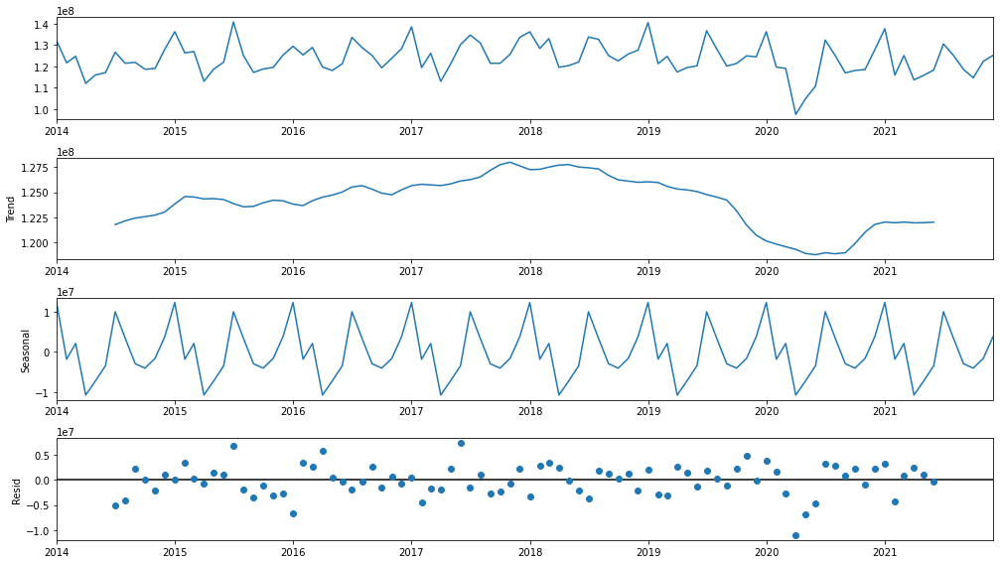

In [18]:
result = seasonal_decompose(energy_demand_monthly, model='additive', period=12)
fig = result.plot()
fig.set_size_inches((14, 8))
fig.tight_layout()
plt.show()

A continuación vamos a ver si nuestra serie es estacionaria o no, es decir, si su media y varianza no están en función del tiempo. La estacionariedad es importante porque la mayoría de métodos estadísticos para realizar análisis y predicciones se basan en la suposición de que las propiedades estadísticas de la serie (media, varianza, correlación, etc.) son constantes en el tiempo. Para comprobarlo vamos a usar el test de Dickey-Fuller que establece como hipótesis nula (H0) que la serie es estacionaria.

In [19]:
def adfuller_test(data):
    result = adfuller(data)
    labels =['ADF Tesr Statistic','p-value','Lags Used','Number of Observations Used']
    for value,label in zip(result,labels):
        print(label+": "+str(value))
    if result[1] <= 0.05:
        print("Conclusion: strong evidence against the null hypothesis(Ho), reject the null hypothesis. Data has no unit root and is stationary")
    else:
        print("Conclusion: weak evidence against null hypothesis, time series has a unit root, indicating it is non-stationary ")

In [20]:
adfuller_test(energy_demand_monthly)

ADF Tesr Statistic: -1.34347257117945
p-value: 0.6090564874005809
Lags Used: 12
Number of Observations Used: 83
Conclusion: weak evidence against null hypothesis, time series has a unit root, indicating it is non-stationary 


Por lo tanto, podemos ver cómo nuestra serie no es estacionaria.

Antes de construir los modelos necesitamos saber cómo se correlacionan los datos entre sí mediante las funciones de autocorrelación (ACF) y las funciones de autocorrelación parcial (PACF). Los análisis de autocorrelación ayudan a detectar patrones ocultos y estacionalidad, así como buscar aleatoriedad.

ACF mide y dibuja la correlación promedio entre los datos de una serie temporal y sus valores previos para diferentes valores de retrasos (lags). Una PACF es similar a una ACF excepto que cada correlación parcial controla para alguna correlación entre las observaciones para longitudes de retrasos más cortas.

Gracias a ACF podemos responder las siguientes preguntas:
* ¿es nuestra serie temporal ruido blanco o random?
* ¿una observación está relacionada con su adyacente?...¿y la siguiente? ¿y la siguiente?
* ¿la serie temporal se puede describir con un modelo MA? ¿de qué orden?

Mientras que PACF:
* ¿la serie temporal se puede modelar con un modelo AR? ¿de qué orden?

Por lo tanto, el valor de un ACF y PACF en el primer retraso es igual porque ambos miden la correlación entre datos en un tiempo t con puntos atrasados un tiempo t-1. Sin embargo, en el segundo retraso, la ACF mide la correlación entre los puntos en un instante t con los puntos en un instante t-2, mientras que PACF mide la misma correlación, pero después de controlar la correlación entre los puntos en un instante t con los que están en t-1.

Gracias a ACF y PACF podemos entender la dinámica temporal de una serie temporal individual.

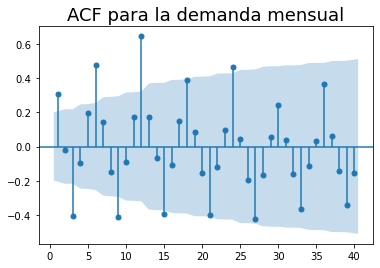

In [21]:
sgt.plot_acf(energy_demand_monthly, zero = False, lags = 40)
plt.title("ACF para la demanda mensual", size = 18)
plt.show()

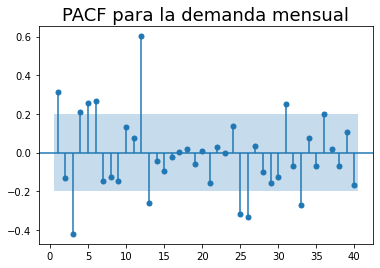

In [22]:
sgt.plot_pacf(energy_demand_monthly, zero = False, lags = 40)
plt.title("PACF para la demanda mensual", size = 18)
plt.show()

Los valores dentro del área azul en ambas gráficas indica que son es estadísticamente cercanos a cero, mientras que sí que es estadísticamente significativo todo lo que hay fuera.

En ACF podemos ver una fuerte correlación positiva con el primer y tercer valor. Más adelante podemos ver fuertes correlaciones negativas y positivas cada 3 valores (3, 6, 9, etc) destacando 12 y 24.

En PACF, por otro lado, vemos una fuerte correlación positiva con el valor 1, negativa en el valor 3, en los valores 4, 5 y 6 y de nuevo destaca el valor 12.

Podemos explicar la fuerte correlación con 12, sus múltiplos y divisores, por el marcado período de 12 meses que tiene la serie.

### 2.2) Análisis diario

Vamos a pasar a analizar el comportamiento que tiene la demanda por día. Para ello, vamos a usar el dataset que hemos preparado con la distribución de la demanda por hora y al que se le ha añadido qué día de la semana es y si es festivo o no:

In [23]:
energy_demand_hourly

,value,weekday,working_day
date,,,
2014-01-01 00:00:00,145810.0,2.0,0.0
2014-01-01 01:00:00,140192.0,2.0,0.0
2014-01-01 02:00:00,130035.0,2.0,0.0
2014-01-01 03:00:00,121152.0,2.0,0.0
2014-01-01 04:00:00,115324.0,2.0,0.0
...,...,...,...
2021-12-31 19:00:00,167097.0,4.0,1.0
2021-12-31 20:00:00,165919.0,4.0,1.0
2021-12-31 21:00:00,160479.0,4.0,1.0


Vamos a centrarnos en la distribución de la demanda energética a lo largo de 2 semanas para ver cómo se distribuye la energía. Seleccionamos dos semana aleatorias (14-01-2019 - 28-01-2019) para hacernos una idea de si hay diferencias en la demanda energética según sea el día laboral:

In [24]:
energy_demand_hourly_test_week = energy_demand_hourly.loc['2019-01-14' : '2019-01-28']

In [25]:
energy_demand_hourly_test_week.index

DatetimeIndex(['2019-01-14 00:00:00', '2019-01-14 01:00:00',
               '2019-01-14 02:00:00', '2019-01-14 03:00:00',
               '2019-01-14 04:00:00', '2019-01-14 05:00:00',
               '2019-01-14 06:00:00', '2019-01-14 07:00:00',
               '2019-01-14 08:00:00', '2019-01-14 09:00:00',
               ...
               '2019-01-28 14:00:00', '2019-01-28 15:00:00',
               '2019-01-28 16:00:00', '2019-01-28 17:00:00',
               '2019-01-28 18:00:00', '2019-01-28 19:00:00',
               '2019-01-28 20:00:00', '2019-01-28 21:00:00',
               '2019-01-28 22:00:00', '2019-01-28 23:00:00'],
              dtype='datetime64[ns]', name='date', length=360, freq='H')

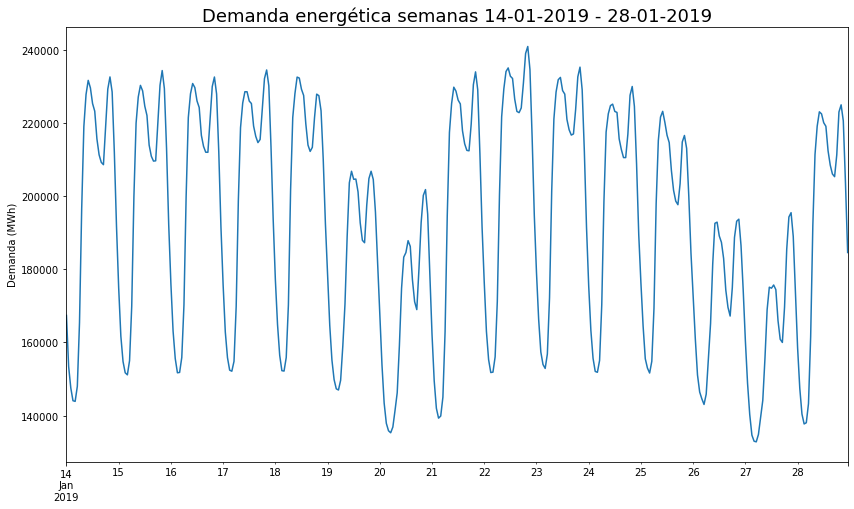

In [26]:
energy_demand_hourly_test_week['value'].plot(figsize=(14,8))
plt.title("Demanda energética semanas 14-01-2019 - 28-01-2019", size = 18)
plt.xlabel("")
plt.ylabel("Demanda (MWh)")
plt.show()

Podemos ver claramente un comportamiento biestacional en el que los patrones de demanda de energía se repiten día a día y a lo largo de la semana. Podemos ver cómo de lunes a viernes (días laborables) el patrón de demanda y sus valores son casi los mismos, para luego decaer en sábado y domingo (días no laborables), siendo el domingo el día de mayor demanda energética.

Vamos a ver si de verdad afectan los festivos a la demanda energética semanal. La Semana Santa es bastante ilustrativa, ya que siempre hay dos días laborables (jueves y viernes) festivos.

In [27]:
energy_demand_hourly_test_festive = energy_demand_hourly.loc['2019-04-15':'2019-04-29']
energy_demand_hourly_test_festive

,value,weekday,working_day
date,,,
2019-04-15 00:00:00,145400.0,0.0,1.0
2019-04-15 01:00:00,136503.0,0.0,1.0
2019-04-15 02:00:00,130049.0,0.0,1.0
2019-04-15 03:00:00,128216.0,0.0,1.0
2019-04-15 04:00:00,127619.0,0.0,1.0
...,...,...,...
2019-04-29 19:00:00,164601.0,0.0,1.0
2019-04-29 20:00:00,169618.0,0.0,1.0
2019-04-29 21:00:00,181597.0,0.0,1.0


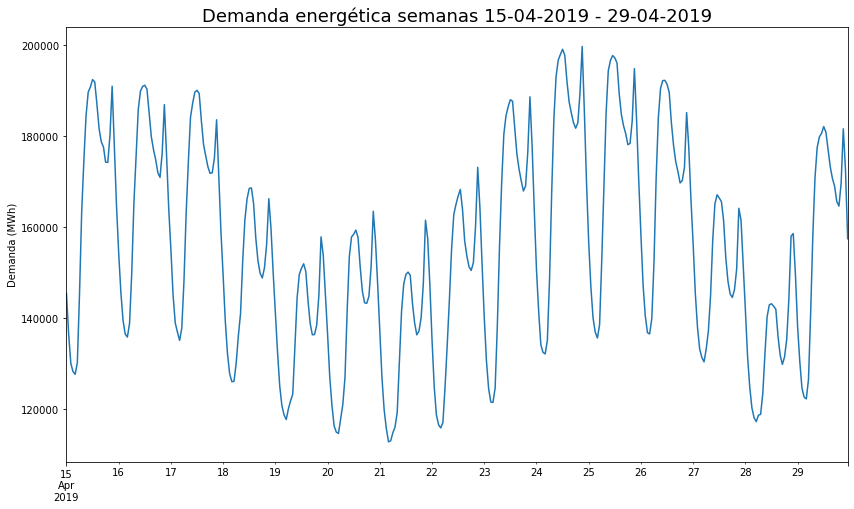

In [28]:
energy_demand_hourly_test_festive['value'].plot(figsize=(14,8))
plt.title("Demanda energética semanas 15-04-2019 - 29-04-2019", size = 18)
plt.xlabel("")
plt.ylabel("Demanda (MWh)")
plt.show()

Podemos ver cómo de lunes a miércoles el consumo es casi el mismo, para luego decaer durante 4 días (jueves, viernes, sábado y domingo) por ser festivos, para luego volver a aumentar durante la semana la siguiente semana a patrones habituales: 5 días de demanda elevada, 2 días de demanda reducida.

Para confirmar a nivel global que en los días festivos la demanda energética es menor, vamos a calcular la media de todos los valores de demanda energética según el tipo de día.

In [29]:
energy_demand_hourly.groupby('working_day', as_index=False)['value'].mean()

,working_day,value
0,0.0,145177.962165
1,1.0,170217.505600


In [30]:
no_working_day = energy_demand_hourly.groupby('working_day', as_index=False)['value'].mean()['value'][0]
working_day = energy_demand_hourly.groupby('working_day', as_index=False)['value'].mean()['value'][1]

100-no_working_day*100/working_day

14.710322153557513

Podemos ver cómo los días festivos la demanda energética es en promedio casi un 15% menor que la de un día laboral.

Vamos a ver a nivel global cómo es la distribución de la demanda energética según el día de la semana. Para ello vamos a usar una gráfica del tipo `violinplot`:

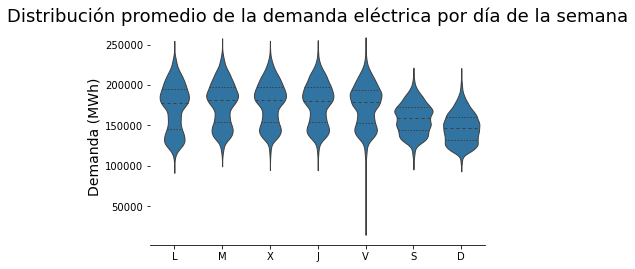

In [31]:
fig, ax = plt.subplots()

weekday_map= {0:'L', 1:'M', 2:'X', 3:'J', 4:'V', 5:'S', 6:'D'}
wd = [0, 1, 2, 3, 4, 5, 6]

sns.set_theme(style="whitegrid")
sns.set(rc = {'figure.figsize':(14,8)})
sns.violinplot(data=energy_demand_hourly, 
               x="weekday", 
               y="value", 
               split=True, 
               inner="quart", 
               color=blue, 
               linewidth=1
)

sns.set_theme(style="whitegrid")

plt.title('Distribución promedio de la demanda eléctrica por día de la semana', fontsize=18)
plt.xlabel('', fontsize=16);
plt.ylabel('Demanda (MWh)', fontsize=14)

xlabels = [weekday_map[d] for d in wd]
ax.set_xticklabels(xlabels)

sns.despine(left=True)

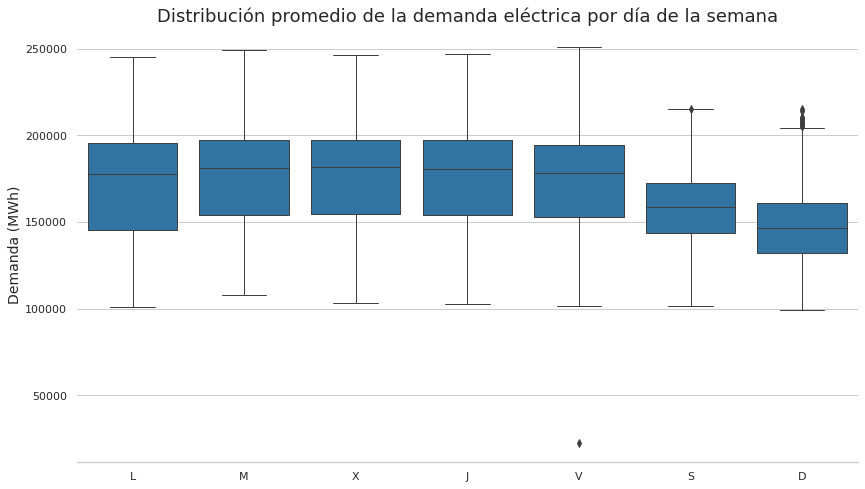

In [32]:
fig, ax = plt.subplots()

weekday_map= {0:'L', 1:'M', 2:'X', 3:'J', 4:'V', 5:'S', 6:'D'}
wd = [0, 1, 2, 3, 4, 5, 6]

sns.set(rc = {'figure.figsize':(14,8)})
sns.boxplot(data=energy_demand_hourly, 
            x="weekday", 
            y="value", 
            color = blue, 
            linewidth=1,
)

sns.set_theme(style="whitegrid")

plt.title('Distribución promedio de la demanda eléctrica por día de la semana', fontsize=18)
plt.xlabel('', fontsize=16);
plt.ylabel('Demanda (MWh)', fontsize=14)

xlabels = [weekday_map[d] for d in wd]
ax.set_xticklabels(xlabels)

sns.despine(left=True)

Podemos ver cómo los días usualmente laborables (de lunes a viernes) concentran la mayor demanda energética, mientras que esta decae los fines de semana (sábado y domingo), siendo el domingo el día de menor demanda. Martes, miércoles y jueves son los que tienen una mayor media y cabe destacar el viernes como el día de mayor variabilidad teniendo los picos más extremos de mayor y menor demanda.

Vamos a centrarnos ahora en la distribución por hora-día a lo largo de los meses. Para ello, creamos una función que dado un mes compila la información de la demanda energética por año y calcula el promedio durante el período 2014-2021.

In [33]:
def set_title(month):
    months = ['Enero', 'Febrero', 'Marzo', 'Abril', 
              'Mayo', 'Junio', 'Julio', 'Agosto', 
              'Septiembre', 'Octubre', 'Noviembre', 'Diciembre']
    
    month_number = int(month)-1
    month_name = months[month_number]
    
    return 'Demanda Horaria ' + month_name + ' 2014-2021'

In [34]:
def prepare_month_dataframe(month):
    years = ['2014-', '2015-', '2016-', '2017-', '2018-', '2019-', '2020-', '2021-']
    month_year = [s + month for s in years]
    # load data:
    energy_demand_hourly = pd.read_csv('demanda_electrica_hora_weekday.csv')
    # new column date as date+hour:
    energy_demand_hourly['date'] = pd.to_datetime(energy_demand_hourly.date) + pd.to_timedelta(energy_demand_hourly.hour, unit='h')
    del energy_demand_hourly['hour']
    # convert date as index:
    energy_demand_hourly.set_index("date", inplace=True)
    # set freq as hourly:
    energy_demand_hourly = energy_demand_hourly.resample('H').first()
    energy_demand_hourly.index.freq
    # create a dataframe resume:
    energy_demand_month_resume = pd.DataFrame()
    for month in month_year:
        energy_demand_hourly_month_year = energy_demand_hourly.loc[month]
        energy_demand_hourly_month_year.index = pd.to_datetime(
            energy_demand_hourly_month_year.index, 
            format = '%Y-%m-%d').strftime('%m-%d %H')
        
        energy_demand_month_resume[month] = energy_demand_hourly_month_year['value']
        
    energy_demand_month_resume['mean_value'] = energy_demand_month_resume.mean(numeric_only=True, axis=1)
    
    return energy_demand_month_resume

In [35]:
def prepare_month_data(month):
    month_string = month
    
    energy_demand_month_resume = prepare_month_dataframe(month)
    
    plt.title(set_title(month_string), size = 18)
    energy_demand_month_resume['2014-' + month_string].plot(color='grey', figsize=(12,6))
    energy_demand_month_resume['2015-' + month_string].plot(color='grey', figsize=(12,6))
    energy_demand_month_resume['2016-' + month_string].plot(color='grey', figsize=(12,6))
    energy_demand_month_resume['2017-' + month_string].plot(color='grey', figsize=(12,6))
    energy_demand_month_resume['2018-' + month_string].plot(color='grey', figsize=(12,6))
    energy_demand_month_resume['2019-' + month_string].plot(color='grey', figsize=(12,6))
    energy_demand_month_resume['2020-' + month_string].plot(color='grey', figsize=(12,6))
    energy_demand_month_resume['2021-' + month_string].plot(color='grey', figsize=(12,6))
    energy_demand_month_resume['mean_value'].plot(color='blue', figsize=(12,6))
    plt.xlabel("")
    plt.ylabel("Demanda (MWh)", size = 14)

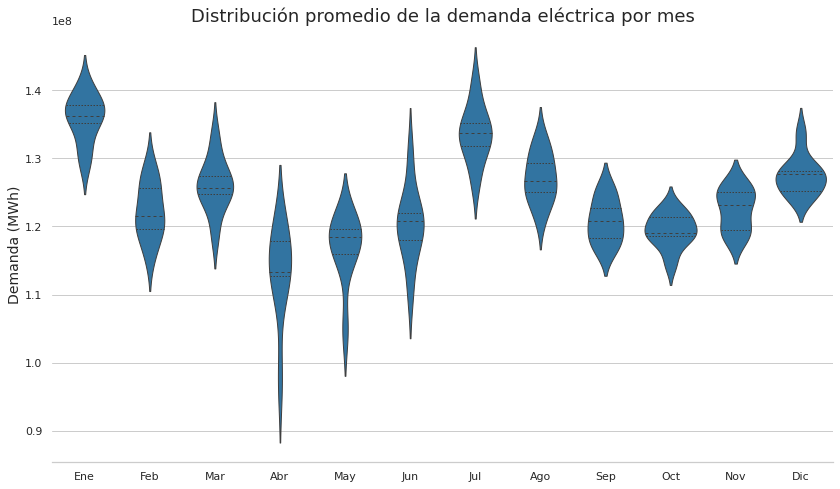

In [36]:
# Import Data
df = pd.read_csv('demanda_electrica_month.csv', parse_dates=['date'], index_col='date')
df.reset_index(inplace=True)

# Prepare data
df['year'] = [d.year for d in df.date]
df['month'] = [d.strftime('%b') for d in df.date]
years = df['year'].unique()

fig, ax = plt.subplots()

month_map= {0:'Ene', 1:'Feb', 2:'Mar', 3:'Abr', 
            4:'May', 5:'Jun', 6:'Jul', 7:'Ago', 
            8:'Sep', 9:'Oct', 10:'Nov', 11:'Dic'}
md = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]

sns.set_theme(style="whitegrid")
sns.set(rc = {'figure.figsize':(14,8)})
sns.violinplot(data=df, 
               x="month", 
               y="value", 
               split=True, 
               inner="quart", 
               color=blue, 
               linewidth=1
)

sns.set_theme(style="whitegrid")

plt.title('Distribución promedio de la demanda eléctrica por mes', fontsize=18)
plt.xlabel('', fontsize=16);
plt.ylabel('Demanda (MWh)', fontsize=14)

xlabels = [month_map[d] for d in md]
ax.set_xticklabels(xlabels)

sns.despine(left=True)

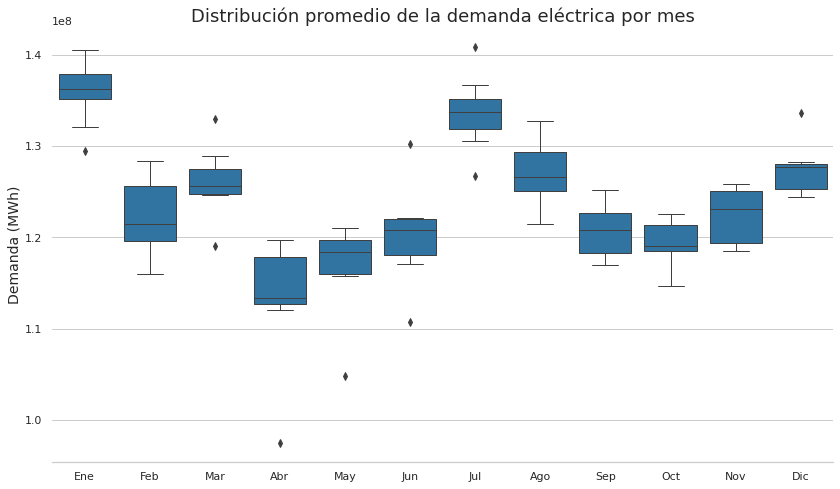

In [37]:
# Import Data
df = pd.read_csv('demanda_electrica_month.csv', parse_dates=['date'], index_col='date')
df.reset_index(inplace=True)

# Prepare data
df['year'] = [d.year for d in df.date]
df['month'] = [d.strftime('%b') for d in df.date]
years = df['year'].unique()

fig, ax = plt.subplots()

month_map= {0:'Ene', 1:'Feb', 2:'Mar', 3:'Abr', 
            4:'May', 5:'Jun', 6:'Jul', 7:'Ago', 
            8:'Sep', 9:'Oct', 10:'Nov', 11:'Dic'}

md = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]

sns.set(rc = {'figure.figsize':(14,8)})
sns.boxplot(data=df, 
            x="month", 
            y="value", 
            color = blue, 
            linewidth=1,
)

sns.set_theme(style="whitegrid")

plt.title('Distribución promedio de la demanda eléctrica por mes', fontsize=18)
plt.xlabel('', fontsize=16);
plt.ylabel('Demanda (MWh)', fontsize=14)

xlabels = [month_map[d] for d in md]
ax.set_xticklabels(xlabels)

sns.despine(left=True)

#### Enero

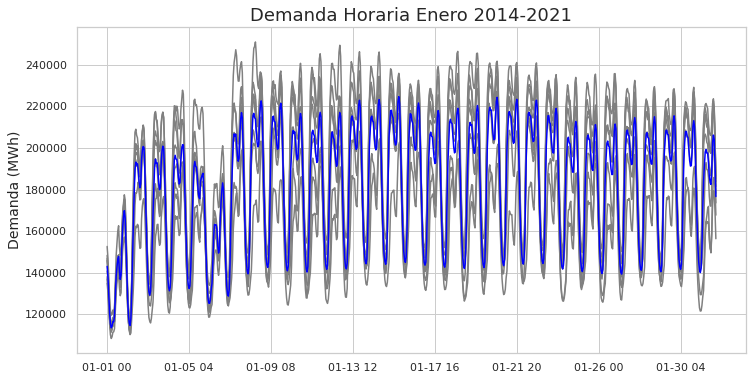

In [38]:
prepare_month_data('01')

#### Febrero

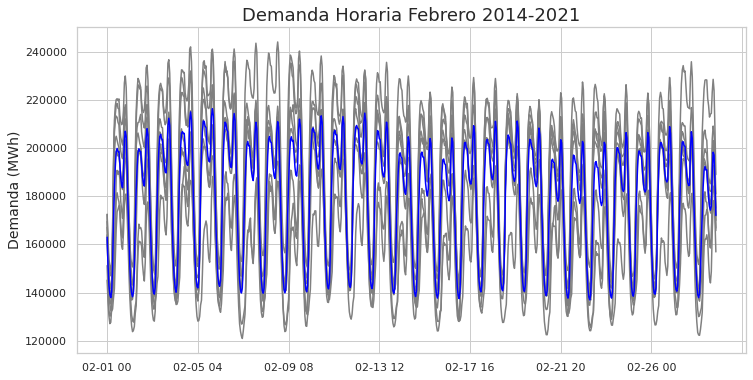

In [39]:
prepare_month_data('02')

#### Marzo

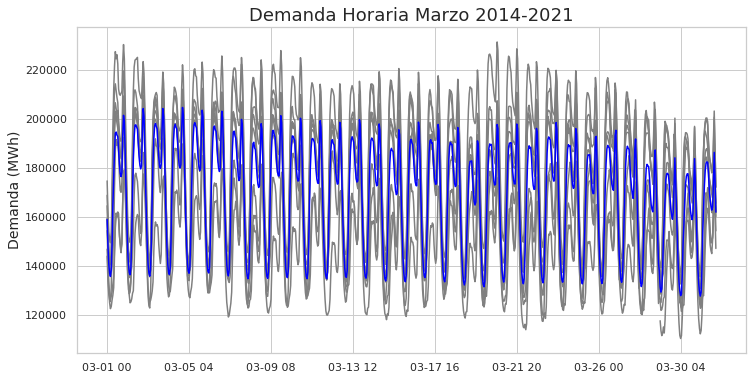

In [40]:
prepare_month_data('03')

#### Abril

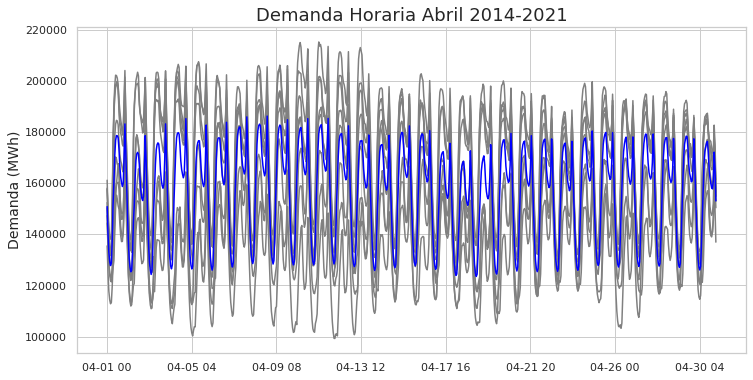

In [41]:
prepare_month_data('04')

#### Mayo

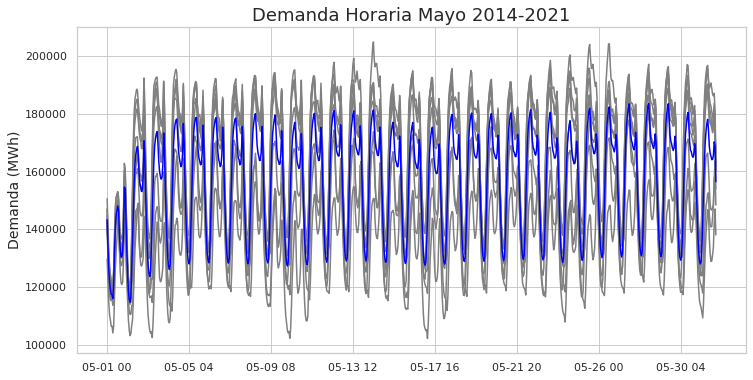

In [42]:
prepare_month_data('05')

#### Junio

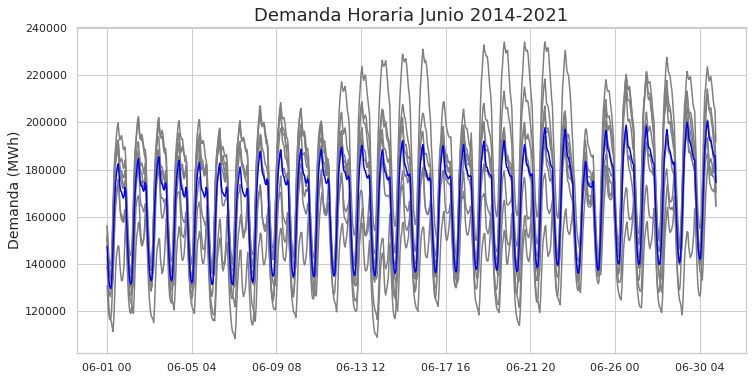

In [43]:
prepare_month_data('06')

#### Julio

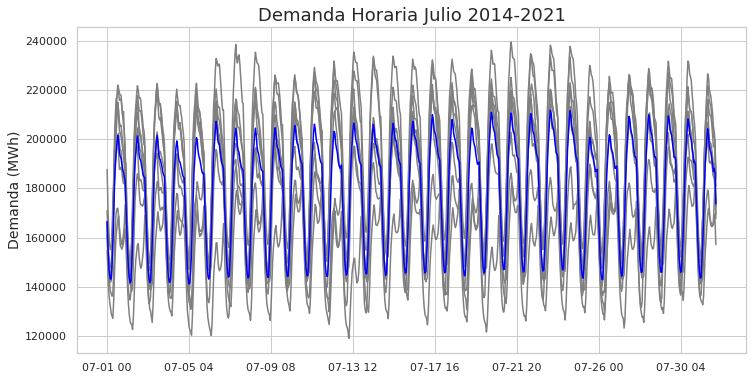

In [44]:
prepare_month_data('07')

#### Agosto

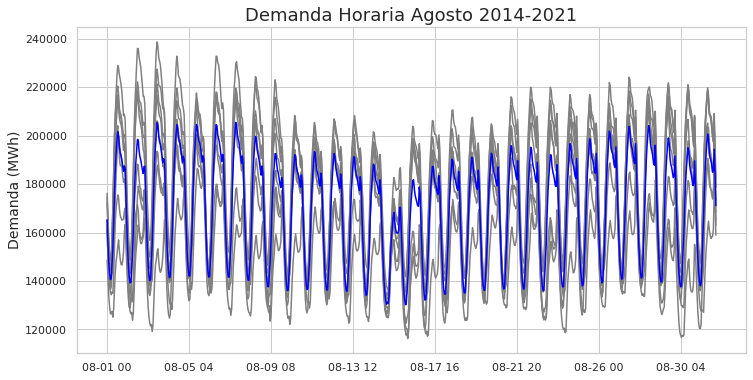

In [45]:
prepare_month_data('08')

#### Septiembre

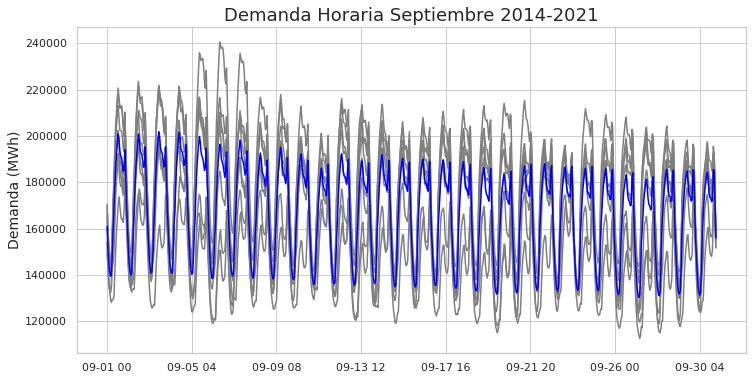

In [46]:
prepare_month_data('09')

#### Octubre

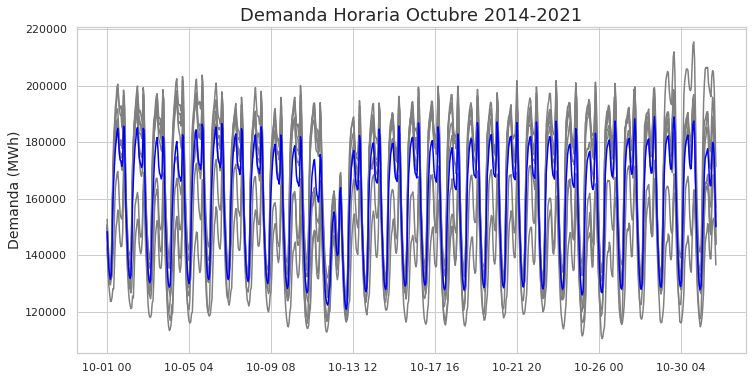

In [47]:
prepare_month_data('10')

#### Noviembre

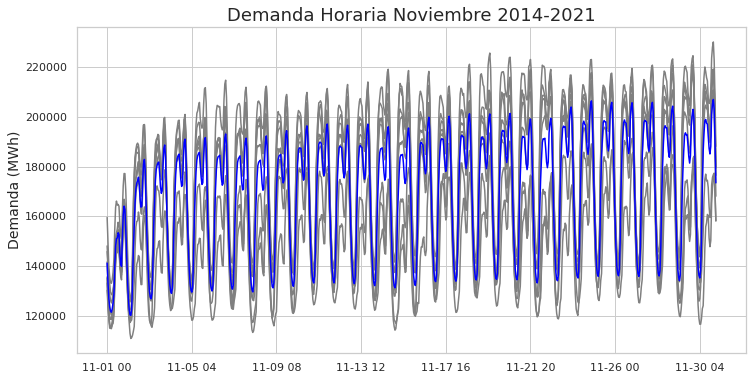

In [48]:
prepare_month_data('11')

#### Diciembre

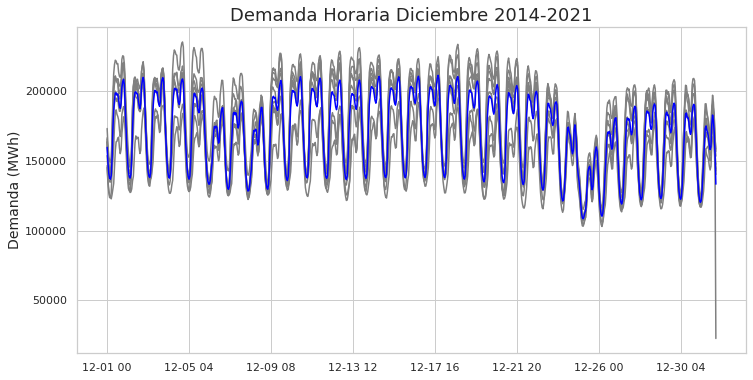

In [49]:
prepare_month_data('12')

#### Comentarios

Si atendemos a los festivos nacionales en el Estado español, sobre todo a los que se producen en días fijos, podemos ver y confirmar que los festivos producen una menor demanda energética. Los festivos de enero y diciembre, los dos primeros días de mayo, el 15 de agosto, 12 de octubre y los dos primeros días de noviembre son un claro ejemplo.

Por otro lado, a nivel de mes podemos ver cómo los valores se mueven siempre en unos márgenes bastante definidos, pero que varían de amplitud entre los diferentes meses. En los meses de transición de primavera a verano y otoño a invierno podemos ver tendencias de decrecimiento/crecimiento de la demanda debido principalmente al factor climático. 

Agosto es el mes donde se puede apreciar bien una tendencia de caída de la primera semana a la segunda-tercera, no solo por el festivo del 15 de agosto sino también por ser el mes en el que mayor cantidad de gente toma sus vacaciones, para luego retomar rápidamente a niveles previos. En noviembre también podemos observar una tendencia clara de aumento de la demanda a medida que avanza el mes hacia diciembre.

Vamos a ver si a nivel horario-diario a lo largo de un mes las series son o no estacionarias:

In [50]:
energy_demand_hourly_test_month = prepare_month_dataframe('09')['mean_value']

adfuller_test(energy_demand_hourly_test_month)

ADF Tesr Statistic: -2.4717952359371846
p-value: 0.12248851951568468
Lags Used: 20
Number of Observations Used: 699
Conclusion: weak evidence against null hypothesis, time series has a unit root, indicating it is non-stationary 


Podemos ver que la serie tampoco es estacionaria si se atiende a la distribución de la demanda por horas. Vamos a ver ahora cómo se correlacionan los valores entre sí.

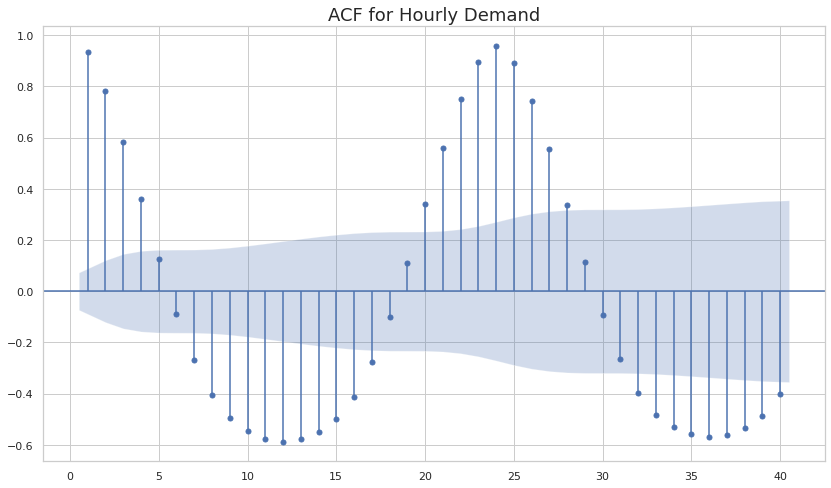

In [51]:
sgt.plot_acf(energy_demand_hourly_test_month, zero = False, lags = 40)
plt.title("ACF for Hourly Demand", size = 18)
plt.show()

/home/berni/anaconda3/lib/python3.8/site-packages/statsmodels/regression/linear_model.py:1434: RuntimeWarning: invalid value encountered in sqrt
  return rho, np.sqrt(sigmasq)


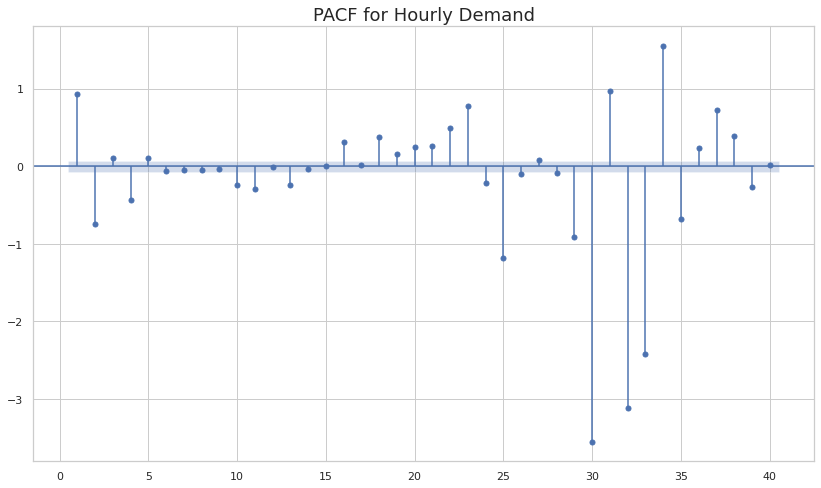

In [52]:
sgt.plot_pacf(energy_demand_hourly_test_month, zero = False, lags = 40)
plt.title("PACF for Hourly Demand", size = 18)
plt.show()

Podemos ver en la gráfica ACF cómo hay una fuerte dependencia de los 6 primeros valores, para luego tener una serie de valores estadísticamente no significativos y volver a tener valores significativos, aunque de menor importancia que los 3 primeros valores. Destaca cómo los valores vuelven a ser significativos en el valor 24, como corresponde a una serie de con un período de 24h.

Por otro lado, en PACF vemos que parece ser que todos los valores son estadísticamente significativos. La correlación es más importante en los 2 primeros valores, decae y vuelve a crecer mucho en valores bastante lejanos (a partir del valor 25) lo que nos puede indicar la presencia de ruido.

### 2.3) Influencia de la temperatura en la demanda

Vamos a analizar la influencia que tiene la temperatura en la demanda dado que España es un país habituado a las variaciones extremas de temperatura.

In [53]:
# función resumen
def prepare_demand_temp_graphs():
    years = [2014, 2015, 2016, 2017, 2018, 2019, 2020, 2021]
    # load and prepare data:
    energy_demand_daily_temp = pd.read_csv('demanda_day_temp_resume_total.csv')

    energy_demand_daily_temp['mean_temp'] = energy_demand_daily_temp[
        ['madrid_temp', 'barcelona_temp', 'bilbao_temp', 'sevilla_temp', 'valencia_temp']
    ].mean(axis=1)

    energy_demand_daily_temp['year'] = pd.DatetimeIndex(energy_demand_daily_temp['date']).year
    energy_demand_daily_temp['month'] = pd.DatetimeIndex(energy_demand_daily_temp['date']).month

    energy_demand_daily_temp.set_index("date", inplace=True)
    energy_demand_daily_temp.index.freq = 'D'
    
    energy_demand_year_resume = pd.DataFrame()
    temp_year_resume = pd.DataFrame()
    for year in years:
        energy_demand_daily_year = energy_demand_daily_temp[energy_demand_daily_temp['year'] == year]
        energy_demand_daily_year.index = pd.to_datetime(
            energy_demand_daily_year.index, 
            format = '%Y-%m-%d').strftime('%m-%d')
        # temperature resume
        temp_year_resume['value_'+str(year)] = energy_demand_daily_year['mean_temp']
        
        # demand resume
        energy_demand_year_resume['value_'+str(year)] = energy_demand_daily_year['value']
        
    temp_year_resume['mean_value'] = temp_year_resume.mean(numeric_only=True, axis=1)
    energy_demand_year_resume['mean_value'] = energy_demand_year_resume.mean(numeric_only=True, axis=1)
        
    return [temp_year_resume, energy_demand_year_resume]

In [54]:
def print_graphs(temp_or_demand):
    years = [2014, 2015, 2016, 2017, 2018, 2019, 2020, 2021]
    
    if temp_or_demand == 0:
        title = 'Temperatura Media 2014-2021'
    if temp_or_demand == 1:
        title = 'Demanda Media 2014-2021'
        
    dataframe_resume = prepare_demand_temp_graphs()[temp_or_demand]
    
    plt.title(title, size = 20)
    dataframe_resume['value_2014'].plot(color='darkgray', figsize=(12,6))
    dataframe_resume['value_2015'].plot(color='darkgray', figsize=(12,6))
    dataframe_resume['value_2016'].plot(color='darkgray', figsize=(12,6))
    dataframe_resume['value_2017'].plot(color='darkgray', figsize=(12,6))
    dataframe_resume['value_2018'].plot(color='darkgray', figsize=(12,6))
    dataframe_resume['value_2019'].plot(color='darkgray', figsize=(12,6))
    dataframe_resume['value_2020'].plot(color='darkgray', figsize=(12,6))
    dataframe_resume['value_2021'].plot(color='darkgray', figsize=(12,6))
    dataframe_resume['mean_value'].plot(color='blue', figsize=(12,6))
    plt.xlabel("")
    plt.ylabel("Temperatura (ºC)", size = 14)

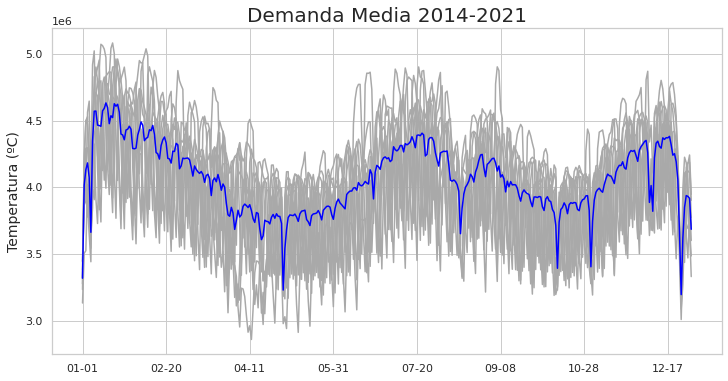

In [55]:
# demand
print_graphs(1)

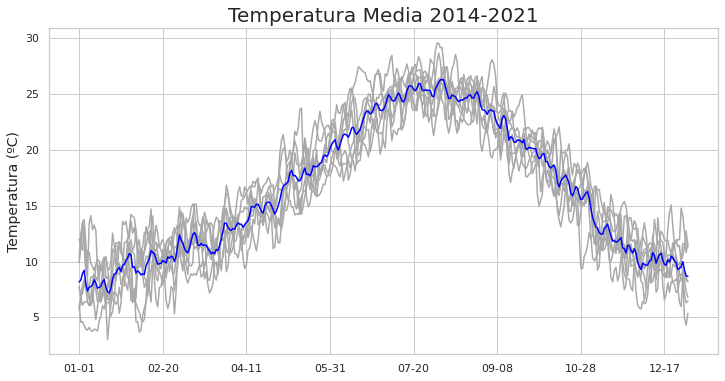

In [56]:
# temperature
print_graphs(0)

Podemos ver la influencia que ejerce la temperatura en la demanda energética: para bajas temperaturas (meses de invierno) y para meses de altas temperaturas (meses de verano) la demanda crece considerablemente, mientras que en los meses de otoño y primavera la demanda se reduce.

Por lo tanto, para reflejar mejor en nuestro dataset esta influencia de la temperatura para valores extremos, vamos a añadir 2 columnas al dataset que notifiquen si el día y mes de cada registro está en verano o en invierno.

## 3) Modelizado

### 3.1) Holt-Winters (Baseline)

#### a) Holt-Winters Mensual

Nos volvemos a centrar en la serie de demanda energética distribuida mensualmente y vamos a hacer un modelado base usando Holt-Winters para hacernos una primera idea de qué métricas obtenemos y qué tendríamos que hacer para mejorarlas. 

Comenzamos cargando el dataset y dividimos entre train y test. Los datos de entrenamiento abarcan los años 2014-2020 y los de test los del 2021; la razón de tal división viene de que el año 2020 fue un año muy particular debido al confinamiento por la irrupción del COVID-19 en España. Esto permite que nuestro modelo pueda aprender de esa particularidad y poder predecir mejor los valores futuros.

In [57]:
energy_demand_monthly.head()

,value
date,
2014-01-01,132056990.0
2014-02-01,121688438.0
2014-03-01,124724746.0
2014-04-01,112057243.0
2014-05-01,116035410.0


In [58]:
train_hw_monthly = energy_demand_monthly.loc['2014':'2020']
train_hw_monthly

,value
date,
2014-01-01,132056990.0
2014-02-01,121688438.0
2014-03-01,124724746.0
2014-04-01,112057243.0
2014-05-01,116035410.0
...,...
2020-08-01,125083657.0
2020-09-01,116977670.0
2020-10-01,118106162.0


In [59]:
test_hw_monthly = energy_demand_monthly.loc['2021']
test_hw_monthly

,value
date,
2021-01-01,137622023.0
2021-02-01,115952775.0
2021-03-01,125109453.0
2021-04-01,113705704.0
2021-05-01,115825967.0
2021-06-01,118353376.0
2021-07-01,130518722.0
2021-08-01,125111628.0
2021-09-01,118590191.0


Usamos los datos de train para hacer el modelo de HW.

In [60]:
fitted_model_add = ExponentialSmoothing(
    train_hw_monthly['value'], 
    trend='add', 
    seasonal='add', 
    seasonal_periods=12
).fit()

/home/berni/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/holtwinters/model.py:427: FutureWarning: After 0.13 initialization must be handled at model creation
  warnings.warn(
/home/berni/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/holtwinters/model.py:920: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


Y realizamos tantas predicciones como valores de test tenemos para los mismos valores de fechas.

In [61]:
test_predictions_hw_monthly=fitted_model_add.forecast(len(test_hw_monthly))
test_predictions_hw_monthly

/home/berni/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)


2021-01-01    1.349279e+08
2021-02-01    1.219049e+08
2021-03-01    1.256615e+08
2021-04-01    1.130041e+08
2021-05-01    1.178838e+08
2021-06-01    1.213532e+08
2021-07-01    1.344179e+08
2021-08-01    1.268465e+08
2021-09-01    1.209019e+08
2021-10-01    1.207915e+08
2021-11-01    1.230987e+08
2021-12-01    1.287214e+08
Freq: MS, dtype: float64

Guardamos en un dataframe resumen y representamos los valores.

In [62]:
test_hw_monthly['value_hw'] = np.asarray(test_predictions_hw_monthly)
test_hw_monthly

,value,value_hw
date,,
2021-01-01,137622023.0,1.349279e+08
2021-02-01,115952775.0,1.219049e+08
2021-03-01,125109453.0,1.256615e+08
2021-04-01,113705704.0,1.130041e+08
2021-05-01,115825967.0,1.178838e+08
2021-06-01,118353376.0,1.213532e+08
2021-07-01,130518722.0,1.344179e+08
2021-08-01,125111628.0,1.268465e+08
2021-09-01,118590191.0,1.209019e+08


<AxesSubplot:xlabel='date'>

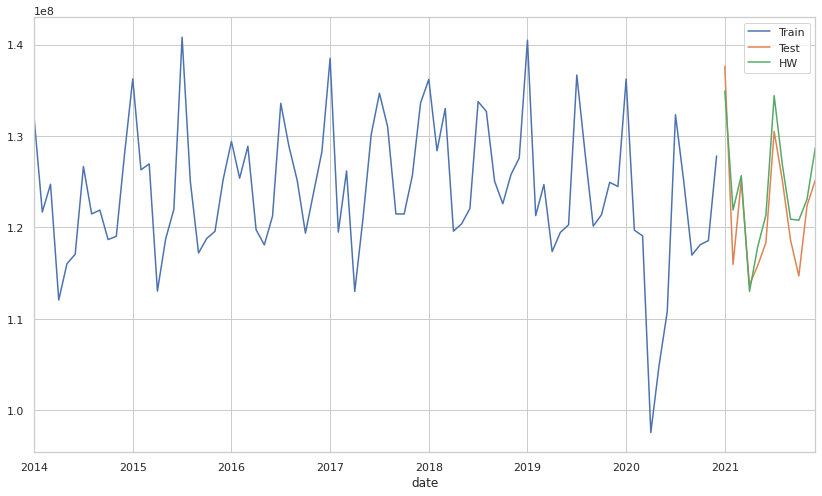

In [63]:
train_hw_monthly['value'].plot(legend=True,label='Train', figsize=(14,8))
test_hw_monthly['value'].plot(legend=True,label='Test', figsize=(14,8))
test_hw_monthly['value_hw'].plot(legend=True,label='HW', figsize=(14,8))

Podemos ver en el gráfico nuestros datos tipo test, train y las predicciones hechas con HW. Las predicciones aunque con notables diferencias siguen bastante bien la tendencia de los datos de tipo test.

Vamos a ver ahora sus métricas RMSE y MAPE:

In [64]:
rmse_hw_monthly = mean_squared_error(test_hw_monthly['value'], test_hw_monthly['value_hw'])
mape_hw_monthly = mean_absolute_percentage_error(test_hw_monthly['value'], test_hw_monthly['value_hw'])

print(f'RMSE: {rmse_hw_monthly:11.10}')
print(f'MAPE: {mape_hw_monthly:11.10}')

RMSE: 1.087814601e+13
MAPE: 0.02292108206


In [65]:
mae_hw_monthly = mean_absolute_error(test_hw_monthly['value'], test_hw_monthly['value_hw'])
mse_hw_monthly = mean_squared_error(test_hw_monthly['value'], test_hw_monthly['value_hw'])
rmse_hw_monthly = np.sqrt(mean_squared_error(test_hw_monthly['value'], test_hw_monthly['value_hw']))
mape_hw_monthly = mean_absolute_percentage_error(test_hw_monthly['value'], test_hw_monthly['value_hw'])
smape_hw_monthly = smape(test_hw_monthly['value'], test_hw_monthly['value_hw'])
mase_hw_monthly = mase(train_hw_monthly['value'], test_hw_monthly['value'], test_hw_monthly['value_hw'])

print(f'MAE: {mae_hw_monthly:11.10}')
print(f'MSE: {mse_hw_monthly:11.10}')
print(f'RMSE: {rmse_hw_monthly:11.10}')
print('----------------------')
print(f'MAPE: {mape_hw_monthly:11.10}')
print(f'sMAPE: {smape_hw_monthly:11.10}')
print('----------------------')
print(f'MASE: {mase_hw_monthly:11.10}')

MAE:   2770542.4
MSE: 1.087814601e+13
RMSE: 3298203.452
----------------------
MAPE: 0.02292108206
sMAPE: 2.258205931
----------------------
MASE: 0.4088149278


Vamos a representar la serie original y el resultado de nuestro modelo en el intervalo de tiempo que hemos usado para testear (2021):

<AxesSubplot:xlabel='date'>

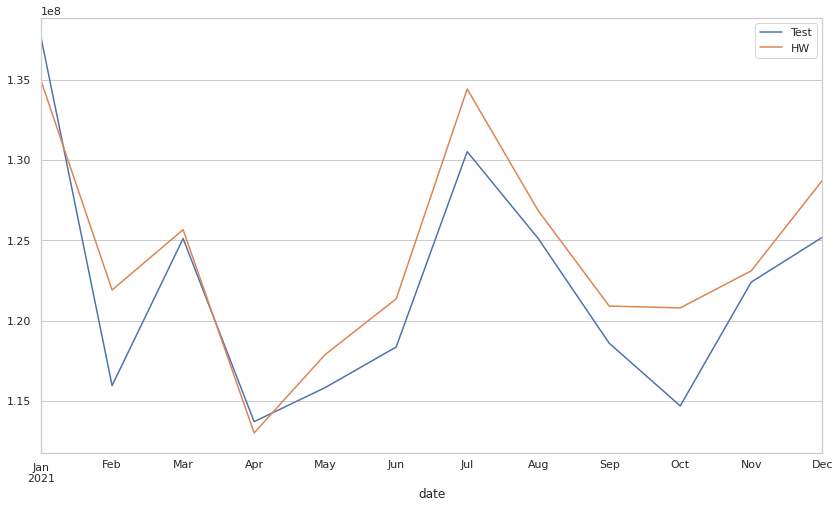

In [66]:
test_hw_monthly['value'].plot(legend=True, label='Test', figsize=(14,8))
test_hw_monthly['value_hw'].plot(legend=True, label='HW', figsize=(14,8))

Podemos ver cómo nuestro modelo sigue bastante bien los datos reales del año 2020, pero muestra notables diferencias en los meses que se producen caídas de consumo después de los meses de mayor consumo: febrero y el intervalo septiembre-noviembre.

Ahora vamos a crear una nueva columna en nnuestro dataframe de test como diferencia entre los valores reales y los de nuestro modelo para hacernos una idea de la magnitud del error cometido al compararlo con la serie original.

In [67]:
# value	value_hw
test_hw_monthly['dif_test_hw'] = test_hw_monthly['value'] - test_hw_monthly['value_hw']
test_hw_monthly

,value,value_hw,dif_test_hw
date,,,
2021-01-01,137622023.0,1.349279e+08,2.694078e+06
2021-02-01,115952775.0,1.219049e+08,-5.952141e+06
2021-03-01,125109453.0,1.256615e+08,-5.520043e+05
2021-04-01,113705704.0,1.130041e+08,7.016392e+05
2021-05-01,115825967.0,1.178838e+08,-2.057796e+06
2021-06-01,118353376.0,1.213532e+08,-2.999812e+06
2021-07-01,130518722.0,1.344179e+08,-3.899149e+06
2021-08-01,125111628.0,1.268465e+08,-1.734862e+06
2021-09-01,118590191.0,1.209019e+08,-2.311742e+06


<AxesSubplot:xlabel='date'>

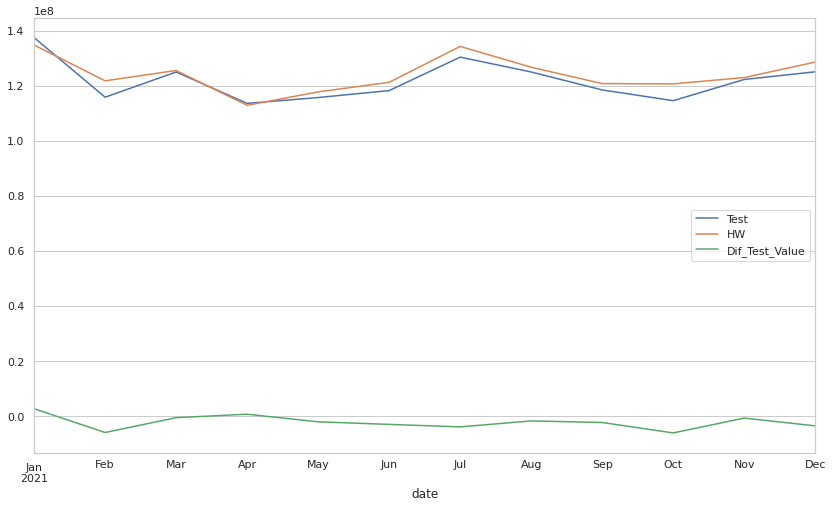

In [68]:
test_hw_monthly['value'].plot(legend=True,label='Test', figsize=(14,8))
test_hw_monthly['value_hw'].plot(legend=True,label='HW', figsize=(14,8))
test_hw_monthly['dif_test_hw'].plot(legend=True,label='Dif_Test_Value', figsize=(14,8))

#### b) Holt-Winters Diario

In [69]:
energy_demand_daily

,value,weekday,working_day
date,,,
2014-01-01,3315035.0,2,0
2014-01-02,4059590.0,3,1
2014-01-03,4098986.0,4,1
2014-01-04,3867911.0,5,1
2014-01-05,3648038.0,6,1
...,...,...,...
2021-12-27,3686647.0,0,1
2021-12-28,3729169.0,1,1
2021-12-29,3692921.0,2,1


In [70]:
train_hw_daily = energy_demand_daily.loc['2014':'2021']
train_hw_daily

,value,weekday,working_day
date,,,
2014-01-01,3315035.0,2,0
2014-01-02,4059590.0,3,1
2014-01-03,4098986.0,4,1
2014-01-04,3867911.0,5,1
2014-01-05,3648038.0,6,1
...,...,...,...
2020-12-27,3687140.0,6,1
2020-12-28,4149036.0,0,1
2020-12-29,4185143.0,1,1


In [71]:
test_hw_daily = energy_demand_daily.loc['2021':'2022']
test_hw_daily

,value,weekday,working_day
date,,,
2021-01-01,3447073.0,4,0
2021-01-02,3867892.0,5,1
2021-01-03,3899502.0,6,1
2021-01-04,4563905.0,0,1
2021-01-05,4647728.0,1,1
...,...,...,...
2021-12-27,3686647.0,0,1
2021-12-28,3729169.0,1,1
2021-12-29,3692921.0,2,1


In [72]:
fitted_model_add = ExponentialSmoothing(
    train_hw_daily['value'], 
    trend='add', 
    seasonal='add', 
    seasonal_periods=365
).fit()

/home/berni/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
/home/berni/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/holtwinters/model.py:427: FutureWarning: After 0.13 initialization must be handled at model creation
  warnings.warn(
/home/berni/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/holtwinters/model.py:920: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


In [73]:
test_predictions_hw_daily=fitted_model_add.forecast(len(test_hw_daily))
test_predictions_hw_daily

/home/berni/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)


2021-01-01    4.479329e+06
2021-01-02    4.684212e+06
2021-01-03    4.475429e+06
2021-01-04    4.289886e+06
2021-01-05    4.120594e+06
                  ...     
2021-12-27    4.226520e+06
2021-12-28    4.515005e+06
2021-12-29    4.498738e+06
2021-12-30    4.395047e+06
2021-12-31    3.713998e+06
Freq: D, Length: 365, dtype: float64

In [74]:
test_hw_daily['value_hw'] = np.asarray(test_predictions_hw_daily)
test_hw_daily

,value,weekday,working_day,value_hw
date,,,,
2021-01-01,3447073.0,4,0,4.479329e+06
2021-01-02,3867892.0,5,1,4.684212e+06
2021-01-03,3899502.0,6,1,4.475429e+06
2021-01-04,4563905.0,0,1,4.289886e+06
2021-01-05,4647728.0,1,1,4.120594e+06
...,...,...,...,...
2021-12-27,3686647.0,0,1,4.226520e+06
2021-12-28,3729169.0,1,1,4.515005e+06
2021-12-29,3692921.0,2,1,4.498738e+06


<AxesSubplot:xlabel='date'>

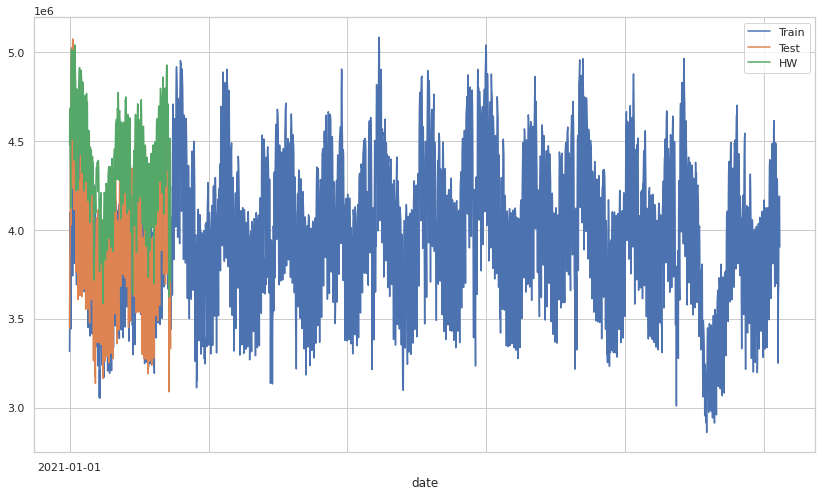

In [75]:
train_hw_daily['value'].plot(legend=True, label='Train', figsize=(14,8))
test_hw_daily['value'].plot(legend=True, label='Test', figsize=(14,8))
test_hw_daily['value_hw'].plot(legend=True, label='HW', figsize=(14,8))

In [76]:
# ver por qué falla la gráfica a la hora de superponerse

In [77]:
rmse_hw_daily = mean_squared_error(test_hw_daily['value'], test_hw_daily['value_hw'])
mape_hw_daily = mean_absolute_percentage_error(test_hw_daily['value'], test_hw_daily['value_hw'])

print(f'RMSE: {rmse_hw_daily:11.10}')
print(f'MAPE: {mape_hw_daily:11.10}')

RMSE: 2.614362121e+11
MAPE: 0.1139483934


In [78]:
mae_hw_daily = mean_absolute_error(test_hw_daily['value'], test_hw_daily['value_hw'])
mse_hw_daily = mean_squared_error(test_hw_daily['value'], test_hw_daily['value_hw'])
rmse_hw_daily = np.sqrt(mean_squared_error(test_hw_daily['value'], test_hw_daily['value_hw']))
mape_hw_daily = mean_absolute_percentage_error(test_hw_daily['value'], test_hw_daily['value_hw'])
smape_hw_daily = smape(test_hw_daily['value'], test_hw_daily['value_hw'])
mase_hw_daily = mase(train_hw_daily['value'], test_hw_daily['value'], test_hw_daily['value_hw'])

print(f'MAE: {mae_hw_daily:11.10}')
print(f'MSE: {mse_hw_daily:11.10}')
print(f'RMSE: {rmse_hw_daily:11.10}')
print('----------------------')
print(f'MAPE: {mape_hw_daily:11.10}')
print(f'sMAPE: {smape_hw_daily:11.10}')
print('----------------------')
print(f'MASE: {mase_hw_daily:11.10}')

MAE:  436156.443
MSE: 2.614362121e+11
RMSE: 511308.3337
----------------------
MAPE: 0.1139483934
sMAPE: 10.55824629
----------------------
MASE: 1.793702407


<AxesSubplot:xlabel='date'>

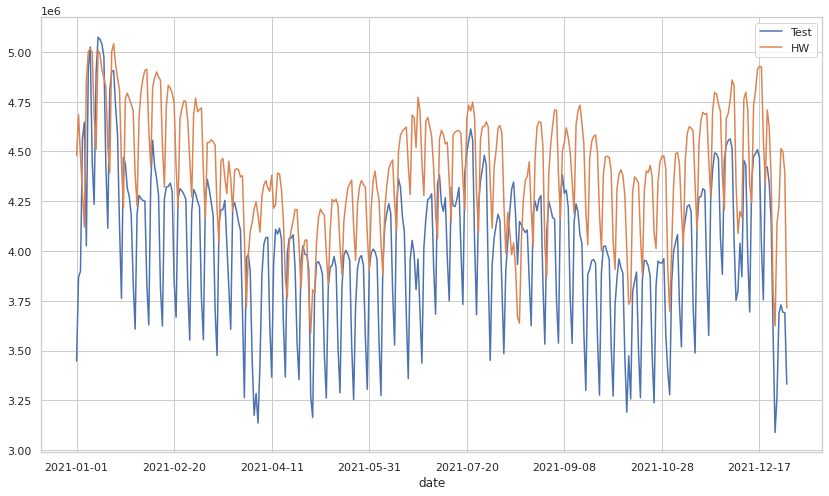

In [79]:
test_hw_daily['value'].plot(legend=True,label='Test', figsize=(14,8))
test_hw_daily['value_hw'].plot(legend=True,label='HW', figsize=(14,8))

In [80]:
test_hw_daily['dif_test_hw'] = test_hw_daily['value'] - test_hw_daily['value_hw']
test_hw_daily

,value,weekday,working_day,value_hw,dif_test_hw
date,,,,,
2021-01-01,3447073.0,4,0,4.479329e+06,-1.032256e+06
2021-01-02,3867892.0,5,1,4.684212e+06,-8.163202e+05
2021-01-03,3899502.0,6,1,4.475429e+06,-5.759269e+05
2021-01-04,4563905.0,0,1,4.289886e+06,2.740189e+05
2021-01-05,4647728.0,1,1,4.120594e+06,5.271337e+05
...,...,...,...,...,...
2021-12-27,3686647.0,0,1,4.226520e+06,-5.398735e+05
2021-12-28,3729169.0,1,1,4.515005e+06,-7.858356e+05
2021-12-29,3692921.0,2,1,4.498738e+06,-8.058166e+05


<AxesSubplot:xlabel='date'>

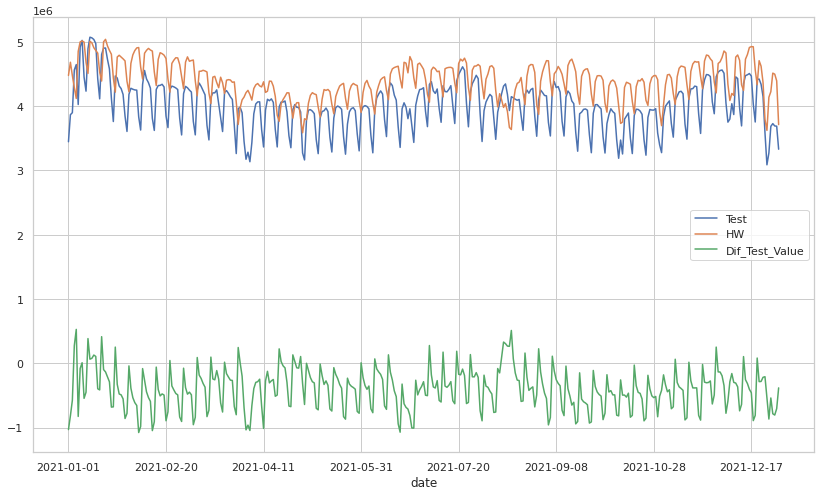

In [81]:
test_hw_daily['value'].plot(legend=True,label='Test', figsize=(14,8))
test_hw_daily['value_hw'].plot(legend=True,label='HW', figsize=(14,8))
test_hw_daily['dif_test_hw'].plot(legend=True,label='Dif_Test_Value', figsize=(14,8))

### 3.2) SARIMAX

#### a) SARIMAX sin variables exógenas

In [82]:
train_sarimax = energy_demand_daily.loc['2014':'2021']
test_sarimax = energy_demand_daily.loc['2021':'2022']

In [83]:
exo_train = train_sarimax

del exo_train['value']
del exo_train['weekday']
del exo_train['working_day']

In [84]:
exo_test = test_sarimax

del exo_test['value']
del exo_test['weekday']
del exo_test['working_day']

In [85]:
train_sarimax = energy_demand_daily.loc['2014':'2021']
del train_sarimax['working_day']
del train_sarimax['weekday']

test_sarimax = energy_demand_daily.loc['2021':'2022']
del test_sarimax['working_day']
del test_sarimax['weekday']

In [86]:
p = range(0, 4, 1)
d = 1
q = range(0, 4, 1)
P = range(0, 4, 1)
D = 0
Q = range(0, 4, 1)
s = 4

from itertools import product

parameters = product(p, q, P, Q)
parameters_list = list(parameters)

In [87]:
# p, d, q
# P, D, Q, s

# (p,q,P,Q) = (3, 2, 3, 2)

# order = (p,d,q) = (3, 2, 2)
# seasonal_order = (P,D,Q,s) = (3, 0, 2, 4)

model_sarimax = SARIMAX(
    train_sarimax,
    order=(3, 2, 2),
    seasonal_order=(3, 0, 2, 4)
).fit()

/home/berni/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
/home/berni/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
/home/berni/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/home/berni/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           11     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.49257D+01    |proj g|=  7.42622D-01

At iterate    5    f=  1.39568D+01    |proj g|=  1.31183D-01

At iterate   10    f=  1.39439D+01    |proj g|=  2.46307D-02

At iterate   15    f=  1.39319D+01    |proj g|=  1.71744D-02

At iterate   20    f=  1.39054D+01    |proj g|=  4.40433D-01

At iterate   25    f=  1.38477D+01    |proj g|=  1.07302D-01

At iterate   30    f=  1.38255D+01    |proj g|=  1.62338D-02

At iterate   35    f=  1.38245D+01    |proj g|=  2.92613D-03

At iterate   40    f=  1.38244D+01    |proj g|=  4.76587D-04

At iterate   45    f=  1.38244D+01    |proj g|=  5.76380D-04

At iterate   50    f=  1.38244D+01    |proj g|=  1.97253D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

/home/berni/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


In [88]:
y_pred_sarimax = model_sarimax.predict(start='2021-01-01', end='2021-12-31', exog = exo_test, dynamic=True)

/home/berni/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)


In [89]:
test_sarimax['value_sarimax'] = np.asarray(y_pred_sarimax)

<AxesSubplot:xlabel='date'>

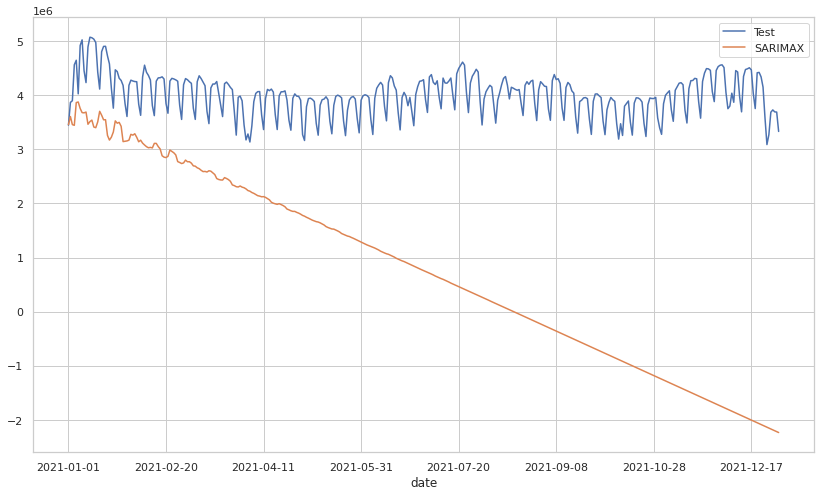

In [90]:
test_sarimax['value'].plot(legend=True, label='Test', figsize=(14,8))
test_sarimax['value_sarimax'].plot(legend=True, label='SARIMAX', figsize=(14,8))

In [91]:
mae_sarimax_original = mean_absolute_error(test_sarimax['value'], test_sarimax['value_sarimax'])
mse_sarimax_original = mean_squared_error(test_sarimax['value'], test_sarimax['value_sarimax'])
rmse_sarimax_original = np.sqrt(mean_squared_error(test_sarimax['value'], test_sarimax['value_sarimax']))
mape_sarimax_original = mean_absolute_percentage_error(test_sarimax['value'], test_sarimax['value_sarimax'])
smape_sarimax_original = smape(test_sarimax['value'], test_sarimax['value_sarimax'])
mase_sarimax_original = mase(train_sarimax['value'], test_sarimax['value'], test_sarimax['value_sarimax'])

print(f'MAE: {mae_sarimax_original:11.10}')
print(f'MSE: {mse_sarimax_original:11.10}')
print(f'RMSE: {rmse_sarimax_original:11.10}')
print('----------------------')
print(f'MAPE: {mape_sarimax_original:11.10}')
print(f'sMAPE: {smape_sarimax_original:11.10}')
print('----------------------')
print(f'MASE: {mase_sarimax_original:11.10}')

MAE: 3251067.917
MSE: 1.348398815e+13
RMSE:  3672055.03
----------------------
MAPE: 0.8159125011
sMAPE: 126.3342763
----------------------
MASE: 13.37008416


#### b) SARIMAX con working_day

In [92]:
exo_train = energy_demand_daily.loc['2014':'2021']

del exo_train['value']
del exo_train['weekday']

exo_train

,working_day
date,
2014-01-01,0
2014-01-02,1
2014-01-03,1
2014-01-04,1
2014-01-05,1
...,...
2020-12-27,1
2020-12-28,1
2020-12-29,1


In [93]:
exo_test = energy_demand_daily.loc['2021':'2022']

del exo_test['value']
del exo_test['weekday']

exo_test

,working_day
date,
2021-01-01,0
2021-01-02,1
2021-01-03,1
2021-01-04,1
2021-01-05,1
...,...
2021-12-27,1
2021-12-28,1
2021-12-29,1


In [94]:
train_sarimax = energy_demand_daily.loc['2014':'2021']

del train_sarimax['working_day']
del train_sarimax['weekday']

train_sarimax

,value
date,
2014-01-01,3315035.0
2014-01-02,4059590.0
2014-01-03,4098986.0
2014-01-04,3867911.0
2014-01-05,3648038.0
...,...
2020-12-27,3687140.0
2020-12-28,4149036.0
2020-12-29,4185143.0


In [95]:
test_sarimax = energy_demand_daily.loc['2021':'2022']

del test_sarimax['working_day']
del test_sarimax['weekday']

test_sarimax

,value
date,
2021-01-01,3447073.0
2021-01-02,3867892.0
2021-01-03,3899502.0
2021-01-04,4563905.0
2021-01-05,4647728.0
...,...
2021-12-27,3686647.0
2021-12-28,3729169.0
2021-12-29,3692921.0


In [96]:
model_sarimax = SARIMAX(
    train_sarimax,
    exo_train,
    order=(3, 2, 1),
    seasonal_order=(3, 0, 3, 4)
).fit()

/home/berni/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
/home/berni/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           12     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.42397D+01    |proj g|=  2.19122D-01

At iterate    5    f=  1.40020D+01    |proj g|=  1.13259D-01

At iterate   10    f=  1.39186D+01    |proj g|=  8.89187D-02

At iterate   15    f=  1.39020D+01    |proj g|=  3.82218D-01

At iterate   20    f=  1.38937D+01    |proj g|=  8.37449D-02

At iterate   25    f=  1.38902D+01    |proj g|=  2.47523D-02

At iterate   30    f=  1.38879D+01    |proj g|=  1.00708D-01

At iterate   35    f=  1.38875D+01    |proj g|=  3.81217D-02

At iterate   40    f=  1.38873D+01    |proj g|=  1.38669D-01

At iterate   45    f=  1.38864D+01    |proj g|=  1.96252D-02


/home/berni/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "



At iterate   50    f=  1.38855D+01    |proj g|=  4.32537D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   12     50     61      1     0     0   4.325D-02   1.389D+01
  F =   13.885477822791181     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 


In [97]:
model_sarimax.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                         SARIMAX Results                                         
=================================================================================================
Dep. Variable:                                     value   No. Observations:                 2557
Model:             SARIMAX(3, 2, 1)x(3, 0, [1, 2, 3], 4)   Log Likelihood              -35505.167
Date:                                   Fri, 16 Sep 2022   AIC                          71034.334
Time:                                           17:08:14   BIC                          71104.483
Sample:                                       01-01-2014   HQIC                         71059.773
                                            - 12-31-2020                                         
Covariance Type:                                     opg                                         
===============================================================================
                  coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------
working_day  3.378e+05   1.43e-08   2.36e+13      0.000    3.38e+05    3.38e+05
ar.L1           0.1921      0.045      4.270      0.000       0.104       0.280
ar.L2           0.0072      0.037      0.193      0.847      -0.066       0.080
ar.L3          -0.5916      0.043    -13.636      0.000      -0.677      -0.507
ma.L1          -0.9975      0.022    -45.724      0.000      -1.040      -0.955
ar.S.L4         0.2549      0.016     15.893      0.000       0.223       0.286
ar.S.L8         0.2370      0.020     11.916      0.000       0.198       0.276
ar.S.L12       -0.9914      0.016    -62.011      0.000      -1.023      -0.960
ma.S.L4        -0.2465      0.054     -4.571      0.000      -0.352      -0.141
ma.S.L8        -0.2629      0.065     -4.037      0.000      -0.391      -0.135
ma.S.L12        0.9834      0.053     18.717      0.000       0.880       1.086
sigma2        1.37e+11    1.3e-12   1.06e+23      0.000    1.37e+11    1.37e+11
===================================================================================
Ljung-Box (L1) (Q):                 338.13   Jarque-Bera (JB):                50.29
Prob(Q):                              0.00   Prob(JB):                         0.00
Heteroskedasticity (H):               0.69   Skew:                             0.13
Prob(H) (two-sided):                  0.00   Kurtosis:                         3.64
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 1.69e+36. Standard errors may be unstable.
"""

In [98]:
y_pred_sarimax = model_sarimax.predict(start='2021-01-01', end='2021-12-31', exog = exo_test, dynamic=True)
y_pred_sarimax

/home/berni/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)


2021-01-01    3.666450e+06
2021-01-02    3.634319e+06
2021-01-03    3.769622e+06
2021-01-04    4.120638e+06
2021-01-05    4.254867e+06
                  ...     
2021-12-27    4.009647e+06
2021-12-28    3.997770e+06
2021-12-29    3.761978e+06
2021-12-30    3.879332e+06
2021-12-31    4.084630e+06
Freq: D, Name: predicted_mean, Length: 365, dtype: float64

In [99]:
test_sarimax['value_sarimax'] = np.asarray(y_pred_sarimax)

In [100]:
test_sarimax

,value,value_sarimax
date,,
2021-01-01,3447073.0,3.666450e+06
2021-01-02,3867892.0,3.634319e+06
2021-01-03,3899502.0,3.769622e+06
2021-01-04,4563905.0,4.120638e+06
2021-01-05,4647728.0,4.254867e+06
...,...,...
2021-12-27,3686647.0,4.009647e+06
2021-12-28,3729169.0,3.997770e+06
2021-12-29,3692921.0,3.761978e+06


<AxesSubplot:xlabel='date'>

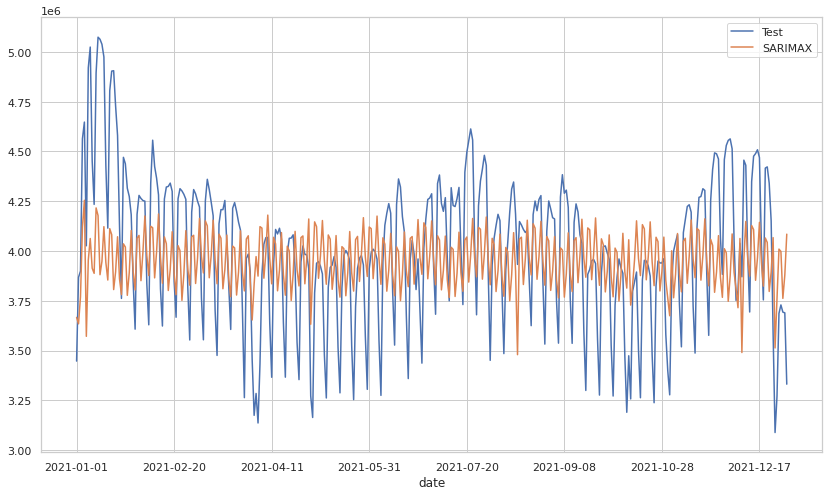

In [101]:
test_sarimax['value'].plot(legend=True, label='Test', figsize=(14,8))
test_sarimax['value_sarimax'].plot(legend=True, label='SARIMAX', figsize=(14,8))

In [102]:
rmse_sarimax = mean_squared_error(test_sarimax['value'], test_sarimax['value_sarimax'])
mape_sarimax = mean_absolute_percentage_error(test_sarimax['value'],test_sarimax['value_sarimax'])

print(f'RMSE: {rmse_sarimax:11.10}')
print(f'MAPE: {mape_sarimax:11.10}')

RMSE: 1.212654134e+11
MAPE: 0.07004791899


In [103]:
mae_sarimax_working_day = mean_absolute_error(test_sarimax['value'], test_sarimax['value_sarimax'])
mse_sarimax_working_day = mean_squared_error(test_sarimax['value'], test_sarimax['value_sarimax'])
rmse_sarimax_working_day = np.sqrt(mean_squared_error(test_sarimax['value'], test_sarimax['value_sarimax']))
mape_sarimax_working_day = mean_absolute_percentage_error(test_sarimax['value'], test_sarimax['value_sarimax'])
smape_sarimax_working_day = smape(test_sarimax['value'], test_sarimax['value_sarimax'])
mase_sarimax_working_day = mase(train_sarimax['value'], test_sarimax['value'], test_sarimax['value_sarimax'])

print(f'MAE: {mae_sarimax_working_day:11.10}')
print(f'MSE: {mse_sarimax_working_day:11.10}')
print(f'RMSE: {rmse_sarimax_working_day:11.10}')
print('----------------------')
print(f'MAPE: {mape_sarimax_working_day:11.10}')
print(f'sMAPE: {smape_sarimax_working_day:11.10}')
print('----------------------')
print(f'MASE: {mase_sarimax_working_day:11.10}')

MAE: 279673.3795
MSE: 1.212654134e+11
RMSE: 348231.8386
----------------------
MAPE: 0.07004791899
sMAPE:  7.03848178
----------------------
MASE: 1.150162567


#### c) SARIMAX con week_day y working_day

In [104]:
train_sarimax = energy_demand_daily.loc['2014':'2021']
test_sarimax = energy_demand_daily.loc['2021':'2022']

In [105]:
exo_train = train_sarimax

del exo_train['value']

In [106]:
exo_test = test_sarimax

del exo_test['value']

In [107]:
train_sarimax = energy_demand_daily.loc['2014':'2021']

del train_sarimax['working_day']
del train_sarimax['weekday']

test_sarimax = energy_demand_daily.loc['2021':'2022']

del test_sarimax['working_day']
del test_sarimax['weekday']

In [108]:
p = range(0, 4, 1)
d = 1
q = range(0, 4, 1)
P = range(0, 4, 1)
D = 0
Q = range(0, 4, 1)
s = 4

from itertools import product

parameters = product(p, q, P, Q)
parameters_list = list(parameters)

In [109]:
model_sarimax = SARIMAX(
    train_sarimax,
    exo_train,
    order=(2, 2, 3),
    seasonal_order=(2, 0, 3, 4)
).fit()

/home/berni/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
/home/berni/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
/home/berni/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           13     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.38979D+01    |proj g|=  4.45003D-01

At iterate    5    f=  1.34871D+01    |proj g|=  1.39452D-01

At iterate   10    f=  1.34538D+01    |proj g|=  4.90752D-02

At iterate   15    f=  1.34391D+01    |proj g|=  2.57103D-02

At iterate   20    f=  1.34367D+01    |proj g|=  1.36490D-02

At iterate   25    f=  1.34205D+01    |proj g|=  2.47845D-01

At iterate   30    f=  1.33847D+01    |proj g|=  2.54404D-01

At iterate   35    f=  1.33575D+01    |proj g|=  2.74420D-01

At iterate   40    f=  1.33552D+01    |proj g|=  4.09086D-02

At iterate   45    f=  1.33481D+01    |proj g|=  2.32608D-01


/home/berni/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "



At iterate   50    f=  1.33418D+01    |proj g|=  2.65558D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   13     50     65      1     0     0   2.656D-01   1.334D+01
  F =   13.341808009601289     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 


In [110]:
y_pred_sarimax = model_sarimax.predict(start='2021-01-01', end='2021-12-31', exog = exo_test, dynamic=True)
y_pred_sarimax

/home/berni/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)


2021-01-01    3.455101e+06
2021-01-02    3.549442e+06
2021-01-03    3.286007e+06
2021-01-04    3.879599e+06
2021-01-05    3.907009e+06
                  ...     
2021-12-27    4.276674e+06
2021-12-28    4.248642e+06
2021-12-29    4.313710e+06
2021-12-30    4.317268e+06
2021-12-31    4.175893e+06
Freq: D, Name: predicted_mean, Length: 365, dtype: float64

In [111]:
test_sarimax['value_sarimax'] = np.asarray(y_pred_sarimax)
test_sarimax

,value,value_sarimax
date,,
2021-01-01,3447073.0,3.455101e+06
2021-01-02,3867892.0,3.549442e+06
2021-01-03,3899502.0,3.286007e+06
2021-01-04,4563905.0,3.879599e+06
2021-01-05,4647728.0,3.907009e+06
...,...,...
2021-12-27,3686647.0,4.276674e+06
2021-12-28,3729169.0,4.248642e+06
2021-12-29,3692921.0,4.313710e+06


<AxesSubplot:xlabel='date'>

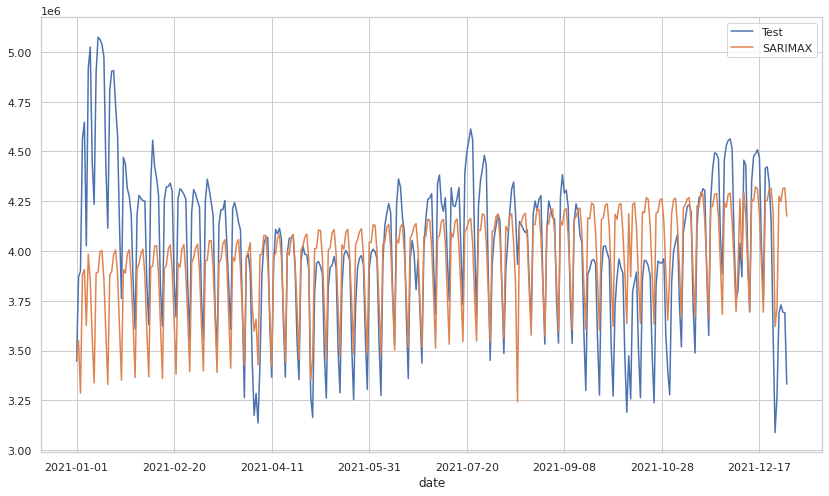

In [112]:
test_sarimax['value'].plot(legend=True, label='Test', figsize=(14,8))
test_sarimax['value_sarimax'].plot(legend=True, label='SARIMAX', figsize=(14,8))

In [113]:
rmse_sarimax_weekday = mean_squared_error(test_sarimax['value'], test_sarimax['value_sarimax'])
mape_sarimax_weekday = mean_absolute_percentage_error(test_sarimax['value'],test_sarimax['value_sarimax'])

print(f'RMSE: {rmse_sarimax_weekday:11.10}')
print(f'MAPE: {mape_sarimax_weekday:11.10}')

RMSE: 1.031150285e+11
MAPE: 0.05857627224


In [114]:
mae_sarimax_weekday = mean_absolute_error(test_sarimax['value'], test_sarimax['value_sarimax'])
mse_sarimax_weekday = mean_squared_error(test_sarimax['value'], test_sarimax['value_sarimax'])
rmse_sarimax_weekday = np.sqrt(mean_squared_error(test_sarimax['value'], test_sarimax['value_sarimax']))
mape_sarimax_weekday = mean_absolute_percentage_error(test_sarimax['value'], test_sarimax['value_sarimax'])
smape_sarimax_weekday = smape(test_sarimax['value'], test_sarimax['value_sarimax'])
mase_sarimax_weekday = mase(train_sarimax['value'], test_sarimax['value'], test_sarimax['value_sarimax'])

print(f'MAE: {mae_sarimax_weekday:11.10}')
print(f'MSE: {mse_sarimax_weekday:11.10}')
print(f'RMSE: {rmse_sarimax_weekday:11.10}')
print('----------------------')
print(f'MAPE: {mape_sarimax_weekday:11.10}')
print(f'sMAPE: {smape_sarimax_weekday:11.10}')
print('----------------------')
print(f'MASE: {mase_sarimax_weekday:11.10}')

MAE: 237107.1042
MSE: 1.031150285e+11
RMSE: 321115.2885
----------------------
MAPE: 0.05857627224
sMAPE: 5.936616965
----------------------
MASE: 0.9751078779


#### d) SARIMAX con week_day, working_day y temperatura

In [115]:
train_sarimax = energy_demand_daily_temp.loc['2014':'2021']
train_sarimax

,value,weekday,working_day,madrid_temp,barcelona_temp,bilbao_temp,sevilla_temp,valencia_temp
date,,,,,,,,
2014-01-01,3315035.0,2.0,0.0,6.785193,8.006851,11.418970,12.184413,13.189499
2014-01-02,4059590.0,3.0,1.0,9.109185,10.764683,12.935602,14.524325,15.136449
2014-01-03,4098986.0,4.0,1.0,9.776889,11.935958,13.029657,15.653018,16.565861
2014-01-04,3867911.0,5.0,1.0,6.703811,11.307489,9.814500,14.106683,14.699295
2014-01-05,3648038.0,6.0,1.0,5.285333,8.682916,9.971085,10.653680,10.970076
...,...,...,...,...,...,...,...,...
2020-12-27,3687140.0,6.0,1.0,1.845615,5.074426,7.337875,7.333795,8.264887
2020-12-28,4149036.0,0.0,1.0,5.030428,8.714899,7.470769,10.717422,11.297570
2020-12-29,4185143.0,1.0,1.0,2.841488,7.956539,5.964505,8.562127,9.813002


In [116]:
test_sarimax = energy_demand_daily_temp.loc['2021':'2022']
test_sarimax

,value,weekday,working_day,madrid_temp,barcelona_temp,bilbao_temp,sevilla_temp,valencia_temp
date,,,,,,,,
2021-01-01,3447073.0,4.0,0.0,2.184065,6.170630,4.822402,8.808740,9.047967
2021-01-02,3867892.0,5.0,1.0,0.537135,5.119815,3.427820,6.213597,7.486780
2021-01-03,3899502.0,6.0,1.0,0.814590,5.368504,4.247380,4.972193,7.664697
2021-01-04,4563905.0,0.0,1.0,0.781345,3.936111,3.047703,6.441625,7.268713
2021-01-05,4647728.0,1.0,1.0,0.119664,3.608848,3.347874,6.642948,6.059656
...,...,...,...,...,...,...,...,...
2021-12-27,3686647.0,0.0,1.0,11.606002,13.531011,14.285517,17.009720,17.443636
2021-12-28,3729169.0,1.0,1.0,9.792129,14.261092,14.133620,16.015375,16.007968
2021-12-29,3692921.0,2.0,1.0,8.401157,13.250848,12.936356,13.320164,15.173263


In [117]:
exo_train = train_sarimax

del exo_train['value']

exo_train

,weekday,working_day,madrid_temp,barcelona_temp,bilbao_temp,sevilla_temp,valencia_temp
date,,,,,,,
2014-01-01,2.0,0.0,6.785193,8.006851,11.418970,12.184413,13.189499
2014-01-02,3.0,1.0,9.109185,10.764683,12.935602,14.524325,15.136449
2014-01-03,4.0,1.0,9.776889,11.935958,13.029657,15.653018,16.565861
2014-01-04,5.0,1.0,6.703811,11.307489,9.814500,14.106683,14.699295
2014-01-05,6.0,1.0,5.285333,8.682916,9.971085,10.653680,10.970076
...,...,...,...,...,...,...,...
2020-12-27,6.0,1.0,1.845615,5.074426,7.337875,7.333795,8.264887
2020-12-28,0.0,1.0,5.030428,8.714899,7.470769,10.717422,11.297570
2020-12-29,1.0,1.0,2.841488,7.956539,5.964505,8.562127,9.813002


In [118]:
exo_test = test_sarimax

del exo_test['value']

exo_test

,weekday,working_day,madrid_temp,barcelona_temp,bilbao_temp,sevilla_temp,valencia_temp
date,,,,,,,
2021-01-01,4.0,0.0,2.184065,6.170630,4.822402,8.808740,9.047967
2021-01-02,5.0,1.0,0.537135,5.119815,3.427820,6.213597,7.486780
2021-01-03,6.0,1.0,0.814590,5.368504,4.247380,4.972193,7.664697
2021-01-04,0.0,1.0,0.781345,3.936111,3.047703,6.441625,7.268713
2021-01-05,1.0,1.0,0.119664,3.608848,3.347874,6.642948,6.059656
...,...,...,...,...,...,...,...
2021-12-27,0.0,1.0,11.606002,13.531011,14.285517,17.009720,17.443636
2021-12-28,1.0,1.0,9.792129,14.261092,14.133620,16.015375,16.007968
2021-12-29,2.0,1.0,8.401157,13.250848,12.936356,13.320164,15.173263


In [119]:
train_sarimax = energy_demand_daily_temp.loc['2014':'2021']

del train_sarimax['working_day']
del train_sarimax['weekday']
del train_sarimax['madrid_temp']
del train_sarimax['barcelona_temp']
del train_sarimax['bilbao_temp']
del train_sarimax['sevilla_temp']
del train_sarimax['valencia_temp']

train_sarimax

,value
date,
2014-01-01,3315035.0
2014-01-02,4059590.0
2014-01-03,4098986.0
2014-01-04,3867911.0
2014-01-05,3648038.0
...,...
2020-12-27,3687140.0
2020-12-28,4149036.0
2020-12-29,4185143.0


In [120]:
test_sarimax = energy_demand_daily_temp.loc['2021':'2022']

del test_sarimax['working_day']
del test_sarimax['weekday']
del test_sarimax['madrid_temp']
del test_sarimax['barcelona_temp']
del test_sarimax['bilbao_temp']
del test_sarimax['sevilla_temp']
del test_sarimax['valencia_temp']

test_sarimax

,value
date,
2021-01-01,3447073.0
2021-01-02,3867892.0
2021-01-03,3899502.0
2021-01-04,4563905.0
2021-01-05,4647728.0
...,...
2021-12-27,3686647.0
2021-12-28,3729169.0
2021-12-29,3692921.0


In [121]:
# p, d, q
# P, D, Q, s

# (p,q,P,Q) = (3, 2, 3, 3)

# order = (p,d,q) = (3, 2, 3)
# seasonal_order = (P,D,Q,s) = (3, 0, 3, 4)

model_sarimax = SARIMAX(
    train_sarimax,
    exo_train,
    order=(3, 2, 3),
    seasonal_order=(3, 0, 3, 4)
).fit()

/home/berni/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
/home/berni/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
/home/berni/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           20     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.38421D+01    |proj g|=  4.68201D-01

At iterate    5    f=  1.34994D+01    |proj g|=  6.61134D-02

At iterate   10    f=  1.34062D+01    |proj g|=  1.05130D-01

At iterate   15    f=  1.33725D+01    |proj g|=  7.77696D-02

At iterate   20    f=  1.33540D+01    |proj g|=  3.28739D-01

At iterate   25    f=  1.33414D+01    |proj g|=  1.68580D-01

At iterate   30    f=  1.33377D+01    |proj g|=  4.91962D-02

At iterate   35    f=  1.33301D+01    |proj g|=  3.66950D-02

At iterate   40    f=  1.33289D+01    |proj g|=  1.92145D-02

At iterate   45    f=  1.33284D+01    |proj g|=  1.33769D-01


/home/berni/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "



At iterate   50    f=  1.33281D+01    |proj g|=  3.04593D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   20     50     69      1     0     0   3.046D-02   1.333D+01
  F =   13.328077336567455     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 


In [122]:
y_pred_sarimax = model_sarimax.predict(start='2021-01-01', end='2021-12-31', exog = exo_test, dynamic=True)
y_pred_sarimax

/home/berni/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)


2021-01-01    3.413115e+06
2021-01-02    3.518809e+06
2021-01-03    3.229583e+06
2021-01-04    3.768045e+06
2021-01-05    3.862365e+06
                  ...     
2021-12-27    4.289509e+06
2021-12-28    4.300596e+06
2021-12-29    4.393888e+06
2021-12-30    4.412636e+06
2021-12-31    4.255676e+06
Freq: D, Name: predicted_mean, Length: 365, dtype: float64

In [123]:
test_sarimax['value_sarimax'] = np.asarray(y_pred_sarimax)
test_sarimax

,value,value_sarimax
date,,
2021-01-01,3447073.0,3.413115e+06
2021-01-02,3867892.0,3.518809e+06
2021-01-03,3899502.0,3.229583e+06
2021-01-04,4563905.0,3.768045e+06
2021-01-05,4647728.0,3.862365e+06
...,...,...
2021-12-27,3686647.0,4.289509e+06
2021-12-28,3729169.0,4.300596e+06
2021-12-29,3692921.0,4.393888e+06


<AxesSubplot:xlabel='date'>

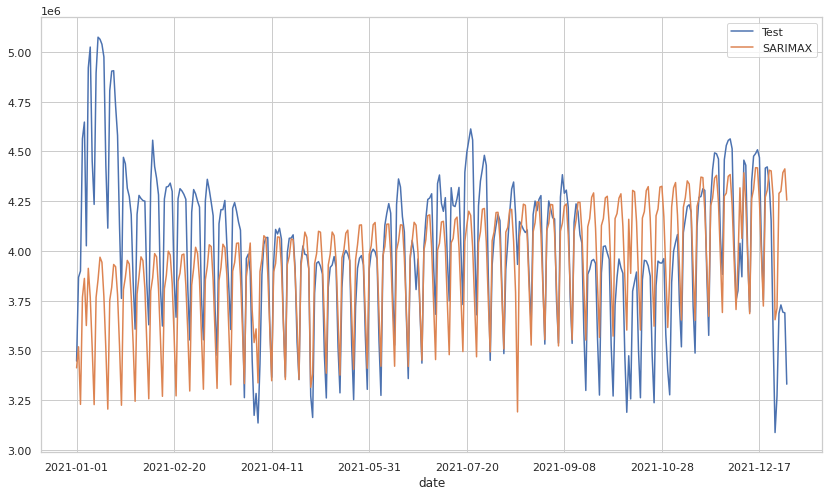

In [124]:
test_sarimax['value'].plot(legend=True, label='Test', figsize=(14,8))
test_sarimax['value_sarimax'].plot(legend=True, label='SARIMAX', figsize=(14,8))

In [125]:
rmse_sarimax_temp = mean_squared_error(test_sarimax['value'], test_sarimax['value_sarimax'])
mape_sarimax_temp = mean_absolute_percentage_error(test_sarimax['value'],test_sarimax['value_sarimax'])

print(f'RMSE: {rmse_sarimax_temp:11.10}')
print(f'MAPE: {mape_sarimax_temp:11.10}')

RMSE: 1.186571355e+11
MAPE: 0.06119586967


In [126]:
mae_sarimax_weekday_temp = mean_absolute_error(test_sarimax['value'], test_sarimax['value_sarimax'])
mse_sarimax_weekday_temp = mean_squared_error(test_sarimax['value'], test_sarimax['value_sarimax'])
rmse_sarimax_weekday_temp = np.sqrt(mean_squared_error(test_sarimax['value'], test_sarimax['value_sarimax']))
mape_sarimax_weekday_temp = mean_absolute_percentage_error(test_sarimax['value'], test_sarimax['value_sarimax'])
smape_sarimax_weekday_temp = smape(test_sarimax['value'], test_sarimax['value_sarimax'])
mase_sarimax_weekday_temp = mase(train_sarimax['value'], test_sarimax['value'], test_sarimax['value_sarimax'])

print(f'MAE: {mae_sarimax_weekday_temp:11.10}')
print(f'MSE: {mse_sarimax_weekday_temp:11.10}')
print(f'RMSE: {rmse_sarimax_weekday_temp:11.10}')
print('----------------------')
print(f'MAPE: {mape_sarimax_weekday_temp:11.10}')
print(f'sMAPE: {smape_sarimax_weekday_temp:11.10}')
print('----------------------')
print(f'MASE: {mase_sarimax_weekday_temp:11.10}')

MAE: 248888.9476
MSE: 1.186571355e+11
RMSE: 344466.4505
----------------------
MAPE: 0.06119586967
sMAPE: 6.243520702
----------------------
MASE: 1.023560953


#### e) SARIMAX con week_day, working_day, temperatura y estacionalidad

In [127]:
train_sarimax = energy_demand_daily_temp_seasonal.loc['2014':'2021']

In [128]:
test_sarimax = energy_demand_daily_temp_seasonal.loc['2021':'2022']

In [129]:
exo_train = train_sarimax

del exo_train['value']

cols = ['weekday', 'working_day', 'is_winter', 
        'is_summer', 'madrid_temp', 'barcelona_temp', 
        'bilbao_temp', 'sevilla_temp', 'valencia_temp'
]
exo_train = exo_train[cols]

In [130]:
exo_test = test_sarimax

del exo_test['value']

cols = ['weekday', 'working_day', 'is_winter', 
        'is_summer', 'madrid_temp', 'barcelona_temp', 
        'bilbao_temp', 'sevilla_temp', 'valencia_temp'
]
exo_test = exo_test[cols]

In [131]:
train_sarimax = energy_demand_daily_temp_seasonal.loc['2014':'2021']

del train_sarimax['working_day']
del train_sarimax['weekday']
del train_sarimax['madrid_temp']
del train_sarimax['barcelona_temp']
del train_sarimax['bilbao_temp']
del train_sarimax['sevilla_temp']
del train_sarimax['valencia_temp']
del train_sarimax['is_winter']
del train_sarimax['is_summer']

In [132]:
test_sarimax = energy_demand_daily_temp_seasonal.loc['2021':'2022']

del test_sarimax['working_day']
del test_sarimax['weekday']
del test_sarimax['madrid_temp']
del test_sarimax['barcelona_temp']
del test_sarimax['bilbao_temp']
del test_sarimax['sevilla_temp']
del test_sarimax['valencia_temp']
del test_sarimax['is_winter']
del test_sarimax['is_summer']

In [133]:
p = range(0, 4, 1)
d = 1
q = range(0, 4, 1)
P = range(0, 4, 1)
D = 0
Q = range(0, 4, 1)
s = 4

from itertools import product

parameters = product(p, q, P, Q)
parameters_list = list(parameters)

In [134]:
# p, d, q
# P, D, Q, s

# (p,q,P,Q) = (3, 2, 3, 3)

# order = (p,d,q) = (3, 2, 3)
# seasonal_order = (P,D,Q,s) = (3, 0, 3, 4)

model_sarimax = SARIMAX(
    train_sarimax,
    exo_train,
    order=(3, 2, 3),
    seasonal_order=(3, 0, 3, 4)
).fit()

/home/berni/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
/home/berni/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
/home/berni/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           22     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.38416D+01    |proj g|=  4.70406D-01


 This problem is unconstrained.



At iterate    5    f=  1.35020D+01    |proj g|=  6.61587D-02

At iterate   10    f=  1.34113D+01    |proj g|=  1.30333D-01

At iterate   15    f=  1.33754D+01    |proj g|=  2.91490D-02

At iterate   20    f=  1.33644D+01    |proj g|=  1.22045D-01

At iterate   25    f=  1.33398D+01    |proj g|=  6.32304D-02

At iterate   30    f=  1.33357D+01    |proj g|=  5.64317D-02

At iterate   35    f=  1.33318D+01    |proj g|=  7.08253D-02

At iterate   40    f=  1.33296D+01    |proj g|=  8.77665D-02

At iterate   45    f=  1.33282D+01    |proj g|=  2.60568D-01


/home/berni/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:566: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "



At iterate   50    f=  1.33273D+01    |proj g|=  1.62803D-01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   22     50     78      1     0     0   1.628D-01   1.333D+01
  F =   13.327320376024240     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 


In [135]:
y_pred_sarimax = model_sarimax.predict(start='2021-01-01', end='2021-12-31', exog = exo_test, dynamic=True)

/home/berni/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:132: FutureWarning: The 'freq' argument in Timestamp is deprecated and will be removed in a future version.
  date_key = Timestamp(key, freq=base_index.freq)


In [136]:
test_sarimax['value_sarimax'] = np.asarray(y_pred_sarimax)

<AxesSubplot:xlabel='date'>

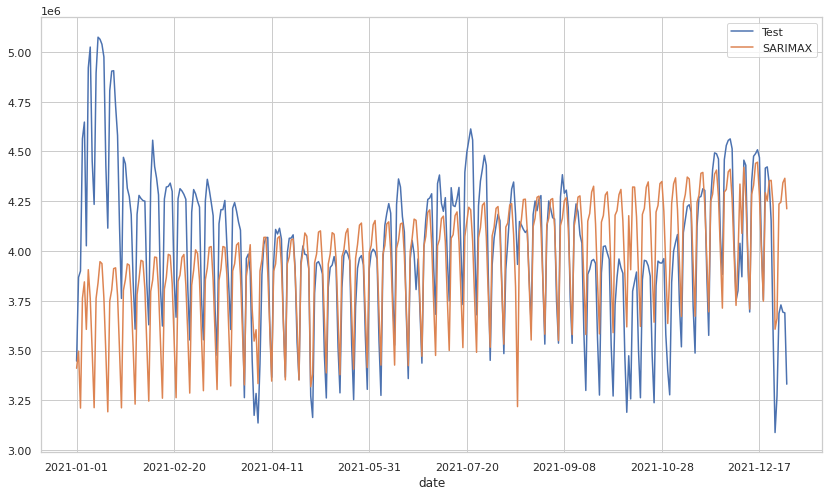

In [137]:
test_sarimax['value'].plot(legend=True, label='Test', figsize=(14,8))
test_sarimax['value_sarimax'].plot(legend=True, label='SARIMAX', figsize=(14,8))

In [138]:
mae_sarimax_weekday_temp_seasonal = mean_absolute_error(test_sarimax['value'], test_sarimax['value_sarimax'])
mse_sarimax_weekday_temp_seasonal = mean_squared_error(test_sarimax['value'], test_sarimax['value_sarimax'])
rmse_sarimax_weekday_temp_seasonal = np.sqrt(mean_squared_error(test_sarimax['value'], test_sarimax['value_sarimax']))
mape_sarimax_weekday_temp_seasonal = mean_absolute_percentage_error(test_sarimax['value'], test_sarimax['value_sarimax'])
smape_sarimax_weekday_temp_seasonal = smape(test_sarimax['value'], test_sarimax['value_sarimax'])
mase_sarimax_weekday_temp_seasonal = mase(train_sarimax['value'], test_sarimax['value'], test_sarimax['value_sarimax'])

print(f'MAE: {mae_sarimax_weekday_temp_seasonal:11.10}')
print(f'MSE: {mse_sarimax_weekday_temp_seasonal:11.10}')
print(f'RMSE: {rmse_sarimax_weekday_temp_seasonal:11.10}')
print('----------------------')
print(f'MAPE: {mape_sarimax_weekday_temp_seasonal:11.10}')
print(f'sMAPE: {smape_sarimax_weekday_temp_seasonal:11.10}')
print('----------------------')
print(f'MASE: {mase_sarimax_weekday_temp_seasonal:11.10}')

MAE: 250220.2585
MSE: 1.201113678e+11
RMSE: 346570.8698
----------------------
MAPE: 0.06161137563
sMAPE: 6.282534449
----------------------
MASE: 1.029035997


### 3.3) XGBoost

#### a) XGBoost sin variables exógenas

In [139]:
df_resume = pd.read_csv('demanda_electrica_diaria.csv')

del df_resume['weekday']
del df_resume['working_day']

df_resume['date'] = pd.DatetimeIndex(df_resume['date']).date
df_resume['year'] = pd.DatetimeIndex(df_resume['date']).year
df_resume['month'] = pd.DatetimeIndex(df_resume['date']).month
df_resume.head()

,date,value,year,month
0,2014-01-01,3315035.0,2014,1
1,2014-01-02,4059590.0,2014,1
2,2014-01-03,4098986.0,2014,1
3,2014-01-04,3867911.0,2014,1
4,2014-01-05,3648038.0,2014,1


In [140]:
X, y =  df_resume.loc[:,['month', 'year']].values, df_resume.loc[:,'value'].values
data_dmatrix = xgb.DMatrix(X,label=y)

In [141]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.12, random_state=123)

In [142]:
reg_mod = xgb.XGBRegressor(objective='reg:squarederror',
    n_estimators=1000,
    learning_rate=0.10,
    subsample=0.5,
    colsample_bytree=1, 
    max_depth=5,
)
reg_mod.fit(X_train, y_train)
XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.1, max_delta_step=0, max_depth=5,
             min_child_weight=1, monotone_constraints='()',
             n_estimators=1000, n_jobs=8, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=0.5,
             tree_method='exact', validate_parameters=1, verbosity=None)

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, enable_categorical=False,
             gamma=0, gpu_id=-1, importance_type='gain',
             interaction_constraints='', learning_rate=0.1, max_delta_step=0,
             max_depth=5, min_child_weight=1, missing=nan,
             monotone_constraints='()', n_estimators=1000, n_jobs=8,
             num_parallel_tree=1, predictor=None, random_state=0, reg_alpha=0,
             reg_lambda=1, scale_pos_weight=1, subsample=0.5,
             tree_method='exact', validate_parameters=1, verbosity=None)

In [143]:
reg_mod.fit(X_train,y_train)

predictions = reg_mod.predict(X_test)

In [144]:
mae_xgboost_original = mean_absolute_error(y_test, predictions)
mse_xgboost_original = mean_squared_error(y_test, predictions)
rmse_xgboost_original = np.sqrt(mean_squared_error(y_test, predictions))
mape_xgboost_original = mean_absolute_percentage_error(y_test, predictions)
smape_xgboost_original = smape(y_test, predictions)
mase_xgboost_original = mase(y_train, y_test, predictions)

print(f'MAE: {mae_xgboost_original:11.10}')
print(f'MSE: {mse_xgboost_original:11.10}')
print(f'RMSE: {rmse_xgboost_original:11.10}')
print('----------------------')
print(f'MAPE: {mape_xgboost_original:11.10}')
print(f'sMAPE: {smape_xgboost_original:11.10}')
print('----------------------')
print(f'MASE: {mase_xgboost_original:11.10}')

MAE: 281265.5905
MSE: 1.120951746e+11
RMSE: 334806.1746
----------------------
MAPE: 0.07118146536
sMAPE: 6.989292617
----------------------
MASE: 0.6081986134


In [145]:
# Creating an empty Dataframe with column names only
result = pd.DataFrame(columns=['Time', 'Test', 'Predicted'])
result['Time'] = pd.date_range(start='2021-01-15', end='2021-12-31', freq='D')
result['Test'] = y_test
result['Predicted'] = predictions
#Using Plotly to build the graph
fig = go.Figure()
fig.add_trace(go.Scatter(x=result['Time'], y=result['Test'],
                    mode='lines',
                    name='Test'))
fig.add_trace(go.Scatter(x=result['Time'], y=result['Predicted'],
                    mode='lines',
                    name='Predicted'))

# Edit the layout
fig.update_layout(title='Test vs Predicted Values',
                   xaxis_title='Months',
                   yaxis_title='Electricity (GWh)',
                   template='gridon')

fig.show()

#### b) XGBoost week_day, working_day

In [146]:
# load data and separate columns of date components
df_resume = pd.read_csv('demanda_electrica_diaria.csv')
df_resume['date'] = pd.DatetimeIndex(df_resume['date']).date
df_resume['year'] = pd.DatetimeIndex(df_resume['date']).year
df_resume['month'] = pd.DatetimeIndex(df_resume['date']).month

# split data into dependent and independent variables
X, y =  df_resume.loc[:,['month', 'year']].values, df_resume.loc[:,'value'].values
data_dmatrix = xgb.DMatrix(X,label=y)

# split data into train and test data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.12, random_state=123)

In [147]:
reg_mod = xgb.XGBRegressor(objective='reg:squarederror',
    n_estimators=1000,
    learning_rate=0.10,
    subsample=0.5,
    colsample_bytree=1, 
    max_depth=5,
)

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.1, max_delta_step=0, max_depth=5,
             min_child_weight=1, monotone_constraints='()',
             n_estimators=1000, n_jobs=8, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=0.5,
             tree_method='exact', validate_parameters=1, verbosity=None)

reg_mod.fit(X_train,y_train)
predictions = reg_mod.predict(X_test)

In [148]:
df_resume.tail(len(y_test))

,date,value,weekday,working_day,year,month
2571,2021-01-15,4975157.0,4,1,2021,1
2572,2021-01-16,4429765.0,5,1,2021,1
2573,2021-01-17,4114808.0,6,1,2021,1
2574,2021-01-18,4805672.0,0,1,2021,1
2575,2021-01-19,4903743.0,1,1,2021,1
...,...,...,...,...,...,...
2917,2021-12-27,3686647.0,0,1,2021,12
2918,2021-12-28,3729169.0,1,1,2021,12
2919,2021-12-29,3692921.0,2,1,2021,12
2920,2021-12-30,3689439.0,3,1,2021,12


<AxesSubplot:>

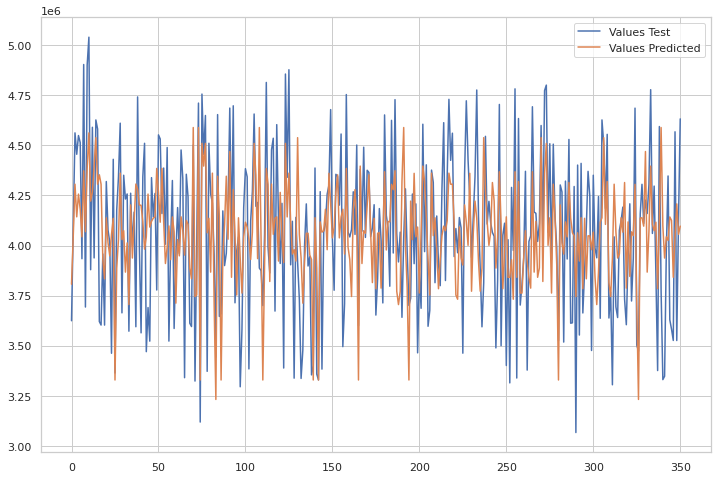

In [149]:
# Creating an empty Dataframe with column names only
result = pd.DataFrame(columns=['Time', 'Test', 'Predicted'])
result['Time'] = pd.date_range(start='2021-01-15', end='2021-12-31', freq='D')
result['Test'] = y_test
result['Predicted'] = predictions

result['Test'].plot(legend = True, label='Values Test')
result['Predicted'].plot(legend = True, label='Values Predicted', figsize=(12, 8))

In [150]:
rmse_xgboost = np.sqrt(mean_squared_error(y_test, predictions))
print("RMSE: %f" % (rmse_xgboost))

from sklearn.metrics import r2_score
r2_xgboost = np.sqrt(r2_score(y_test, predictions))
print("R_Squared Score : %f" % (r2_xgboost))

from sklearn.metrics import mean_absolute_percentage_error
mape_xgboost = mean_absolute_percentage_error(y_test, predictions)
print("MAPE : %f" % (mape_xgboost))

RMSE: 334806.174613
R_Squared Score : 0.545231
MAPE : 0.071181


In [151]:
mae_xgboost_weekday = mean_absolute_error(y_test, predictions)
mse_xgboost_weekday = mean_squared_error(y_test, predictions)
rmse_xgboost_weekday = np.sqrt(mean_squared_error(y_test, predictions))
mape_xgboost_weekday = mean_absolute_percentage_error(y_test, predictions)
smape_xgboost_weekday = smape(y_test, predictions)
mase_xgboost_weekday = mase(y_train, y_test, predictions)

print(f'MAE: {mae_xgboost_weekday:11.10}')
print(f'MSE: {mse_xgboost_weekday:11.10}')
print(f'RMSE: {rmse_xgboost_weekday:11.10}')
print('----------------------')
print(f'MAPE: {mape_xgboost_weekday:11.10}')
print(f'sMAPE: {smape_xgboost_weekday:11.10}')
print('----------------------')
print(f'MASE: {mase_xgboost_weekday:11.10}')

MAE: 281265.5905
MSE: 1.120951746e+11
RMSE: 334806.1746
----------------------
MAPE: 0.07118146536
sMAPE: 6.989292617
----------------------
MASE: 0.6081986134


#### c) XGBoost con días de la semana, día laboral/festivo y temperatura

In [152]:
df_resume = pd.read_csv('demanda_day_temp_resume_total.csv')

df_resume['date'] = pd.DatetimeIndex(df_resume['date']).date
df_resume['year'] = pd.DatetimeIndex(df_resume['date']).year
df_resume['month'] = pd.DatetimeIndex(df_resume['date']).month
df_resume

,date,value,weekday,working_day,madrid_temp,barcelona_temp,bilbao_temp,sevilla_temp,valencia_temp,year,month
0,2014-01-01,3315035.0,2.0,0.0,6.785193,8.006851,11.418970,12.184413,13.189499,2014,1
1,2014-01-02,4059590.0,3.0,1.0,9.109185,10.764683,12.935602,14.524325,15.136449,2014,1
2,2014-01-03,4098986.0,4.0,1.0,9.776889,11.935958,13.029657,15.653018,16.565861,2014,1
3,2014-01-04,3867911.0,5.0,1.0,6.703811,11.307489,9.814500,14.106683,14.699295,2014,1
4,2014-01-05,3648038.0,6.0,1.0,5.285333,8.682916,9.971085,10.653680,10.970076,2014,1
...,...,...,...,...,...,...,...,...,...,...,...
2917,2021-12-27,3686647.0,0.0,1.0,11.606002,13.531011,14.285517,17.009720,17.443636,2021,12
2918,2021-12-28,3729169.0,1.0,1.0,9.792129,14.261092,14.133620,16.015375,16.007968,2021,12
2919,2021-12-29,3692921.0,2.0,1.0,8.401157,13.250848,12.936356,13.320164,15.173263,2021,12
2920,2021-12-30,3689439.0,3.0,1.0,7.203344,11.992122,12.347234,12.666560,12.678245,2021,12


In [153]:
X, y =  df_resume.loc[:,['month', 'year']].values, df_resume.loc[:,'value'].values
data_dmatrix = xgb.DMatrix(X,label=y)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.14, random_state=123)

In [154]:
reg_mod = xgb.XGBRegressor(objective='reg:squarederror',
    n_estimators=1000,
    learning_rate=0.10,
    subsample=0.5,
    colsample_bytree=1, 
    max_depth=5,
)
reg_mod.fit(X_train, y_train)
XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.1, max_delta_step=0, max_depth=5,
             min_child_weight=1, monotone_constraints='()',
             n_estimators=1000, n_jobs=8, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=0.5,
             tree_method='exact', validate_parameters=1, verbosity=None)

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, enable_categorical=False,
             gamma=0, gpu_id=-1, importance_type='gain',
             interaction_constraints='', learning_rate=0.1, max_delta_step=0,
             max_depth=5, min_child_weight=1, missing=nan,
             monotone_constraints='()', n_estimators=1000, n_jobs=8,
             num_parallel_tree=1, predictor=None, random_state=0, reg_alpha=0,
             reg_lambda=1, scale_pos_weight=1, subsample=0.5,
             tree_method='exact', validate_parameters=1, verbosity=None)

In [155]:
reg_mod.fit(X_train,y_train)

predictions = reg_mod.predict(X_test)

In [156]:
len(y_test)

410

In [157]:
df_resume.tail(len(y_test))

,date,value,weekday,working_day,madrid_temp,barcelona_temp,bilbao_temp,sevilla_temp,valencia_temp,year,month
2512,2020-11-17,4095900.0,1.0,1.0,11.238303,13.717583,12.339095,16.720818,16.144432,2020,11
2513,2020-11-18,4123692.0,2.0,1.0,10.604639,13.015803,14.499893,17.469130,15.802426,2020,11
2514,2020-11-19,4080145.0,3.0,1.0,11.955848,13.670720,11.616662,17.321639,15.747248,2020,11
2515,2020-11-20,4056942.0,4.0,1.0,9.684299,12.059716,9.456434,16.588240,14.438715,2020,11
2516,2020-11-21,3695496.0,5.0,1.0,8.016818,9.929680,8.013930,15.810885,12.338232,2020,11
...,...,...,...,...,...,...,...,...,...,...,...
2917,2021-12-27,3686647.0,0.0,1.0,11.606002,13.531011,14.285517,17.009720,17.443636,2021,12
2918,2021-12-28,3729169.0,1.0,1.0,9.792129,14.261092,14.133620,16.015375,16.007968,2021,12
2919,2021-12-29,3692921.0,2.0,1.0,8.401157,13.250848,12.936356,13.320164,15.173263,2021,12
2920,2021-12-30,3689439.0,3.0,1.0,7.203344,11.992122,12.347234,12.666560,12.678245,2021,12


<AxesSubplot:>

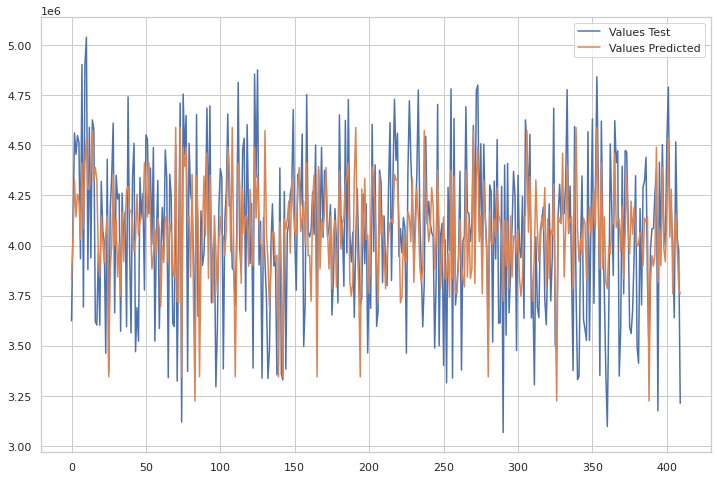

In [158]:
# Creating an empty Dataframe with column names only
result = pd.DataFrame(columns=['Time', 'Test', 'Predicted'])
result['Time'] = pd.date_range(start='2020-11-17', end='2021-12-31', freq='D')
result['Test'] = y_test
result['Predicted'] = predictions

result['Test'].plot(legend = True, label='Values Test')
result['Predicted'].plot(legend = True, label='Values Predicted', figsize=(12, 8))

In [159]:
rmse_xgboost_temp = np.sqrt(mean_squared_error(y_test, predictions))
print("RMSE: %f" % (rmse_xgboost_temp))

from sklearn.metrics import r2_score
r2_xgboost_temp = np.sqrt(r2_score(y_test, predictions))
print("R_Squared Score : %f" % (r2_xgboost_temp))

from sklearn.metrics import mean_absolute_percentage_error
mape_xgboost_temp = mean_absolute_percentage_error(y_test, predictions)
print("MAPE : %f" % (mape_xgboost_temp))

RMSE: 336916.693692
R_Squared Score : 0.551663
MAPE : 0.072143


In [160]:
mae_xgboost_weekday_temp = mean_absolute_error(y_test, predictions)
mse_xgboost_weekday_temp = mean_squared_error(y_test, predictions)
rmse_xgboost_weekday_temp = np.sqrt(mean_squared_error(y_test, predictions))
mape_xgboost_weekday_temp = mean_absolute_percentage_error(y_test, predictions)
smape_xgboost_weekday_temp = smape(y_test, predictions)
mase_xgboost_weekday_temp = mase(y_train, y_test, predictions)

print(f'MAE: {mae_xgboost_weekday_temp:11.10}')
print(f'MSE: {mse_xgboost_weekday_temp:11.10}')
print(f'RMSE: {rmse_xgboost_weekday_temp:11.10}')
print('----------------------')
print(f'MAPE: {mape_xgboost_weekday_temp:11.10}')
print(f'sMAPE: {smape_xgboost_weekday_temp:11.10}')
print('----------------------')
print(f'MASE: {mase_xgboost_weekday_temp:11.10}')

MAE: 283372.4585
MSE: 1.135128585e+11
RMSE: 336916.6937
----------------------
MAPE: 0.07214256443
sMAPE: 7.064352973
----------------------
MASE: 0.6131146353


#### d) XGBoost con días de la semana, día laboral/festivo, temperatura y estacionalidad

In [161]:
df_resume = pd.read_csv('demanda_day_temp_seasonal_resume.csv')

df_resume['date'] = pd.DatetimeIndex(df_resume['date']).date
df_resume['year'] = pd.DatetimeIndex(df_resume['date']).year
df_resume['month'] = pd.DatetimeIndex(df_resume['date']).month
df_resume

,date,value,weekday,working_day,madrid_temp,barcelona_temp,bilbao_temp,sevilla_temp,valencia_temp,is_winter,is_summer,year,month
0,2014-01-01,3315035.0,2.0,0.0,6.785193,8.006851,11.418970,12.184413,13.189499,1,0,2014,1
1,2014-01-02,4059590.0,3.0,1.0,9.109185,10.764683,12.935602,14.524325,15.136449,1,0,2014,1
2,2014-01-03,4098986.0,4.0,1.0,9.776889,11.935958,13.029657,15.653018,16.565861,1,0,2014,1
3,2014-01-04,3867911.0,5.0,1.0,6.703811,11.307489,9.814500,14.106683,14.699295,1,0,2014,1
4,2014-01-05,3648038.0,6.0,1.0,5.285333,8.682916,9.971085,10.653680,10.970076,1,0,2014,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2917,2021-12-27,3686647.0,0.0,1.0,11.606002,13.531011,14.285517,17.009720,17.443636,1,0,2021,12
2918,2021-12-28,3729169.0,1.0,1.0,9.792129,14.261092,14.133620,16.015375,16.007968,1,0,2021,12
2919,2021-12-29,3692921.0,2.0,1.0,8.401157,13.250848,12.936356,13.320164,15.173263,1,0,2021,12
2920,2021-12-30,3689439.0,3.0,1.0,7.203344,11.992122,12.347234,12.666560,12.678245,1,0,2021,12


In [162]:
X, y =  df_resume.loc[:,['month', 'year']].values, df_resume.loc[:,'value'].values
data_dmatrix = xgb.DMatrix(X,label=y)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.14, random_state=123)

In [163]:
reg_mod = xgb.XGBRegressor(objective='reg:squarederror',
    n_estimators=1000,
    learning_rate=0.10,
    subsample=0.5,
    colsample_bytree=1, 
    max_depth=5,
)
reg_mod.fit(X_train, y_train)
XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.1, max_delta_step=0, max_depth=5,
             min_child_weight=1, monotone_constraints='()',
             n_estimators=1000, n_jobs=8, num_parallel_tree=1, random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=0.5,
             tree_method='exact', validate_parameters=1, verbosity=None)


reg_mod.fit(X_train,y_train)

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, enable_categorical=False,
             gamma=0, gpu_id=-1, importance_type=None,
             interaction_constraints='', learning_rate=0.1, max_delta_step=0,
             max_depth=5, min_child_weight=1, missing=nan,
             monotone_constraints='()', n_estimators=1000, n_jobs=8,
             num_parallel_tree=1, predictor='auto', random_state=0, reg_alpha=0,
             reg_lambda=1, scale_pos_weight=1, subsample=0.5,
             tree_method='exact', validate_parameters=1, verbosity=None)

In [164]:
predictions = reg_mod.predict(X_test)

<AxesSubplot:>

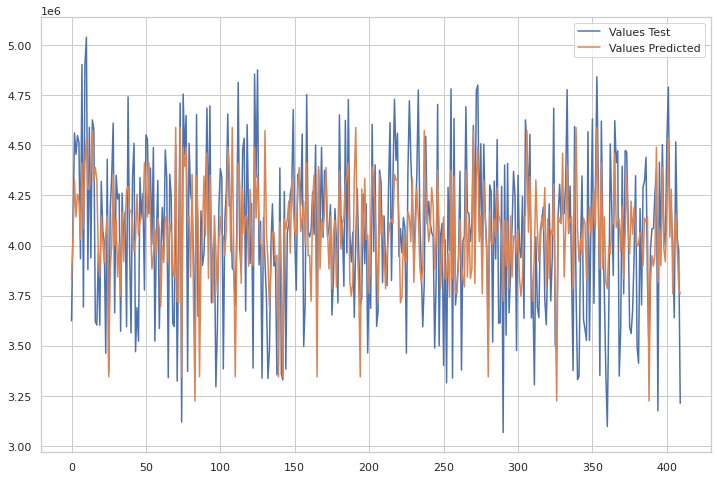

In [165]:
# Creating an empty Dataframe with column names only
result = pd.DataFrame(columns=['Time', 'Test', 'Predicted'])
result['Time'] = pd.date_range(start='2020-11-17', end='2021-12-31', freq='D')
result['Test'] = y_test
result['Predicted'] = predictions

result['Test'].plot(legend = True, label='Values Test')
result['Predicted'].plot(legend = True, label='Values Predicted', figsize=(12, 8))

In [166]:
rmse_xgboost_temp_season = np.sqrt(mean_squared_error(y_test, predictions))
print("RMSE: %f" % (rmse_xgboost_temp_season))

from sklearn.metrics import r2_score
r2_xgboost_temp_season = np.sqrt(r2_score(y_test, predictions))
print("R_Squared Score : %f" % (r2_xgboost_temp_season))

from sklearn.metrics import mean_absolute_percentage_error
mape_xgboost_temp_season = mean_absolute_percentage_error(y_test, predictions)
print("MAPE : %f" % (mape_xgboost_temp_season))

RMSE: 336916.693692
R_Squared Score : 0.551663
MAPE : 0.072143


In [167]:
mae_xgboost_weekday_temp_season = mean_absolute_error(y_test, predictions)
mse_xgboost_weekday_temp_season = mean_squared_error(y_test, predictions)
rmse_xgboost_weekday_temp_season = np.sqrt(mean_squared_error(y_test, predictions))
mape_xgboost_weekday_temp_season = mean_absolute_percentage_error(y_test, predictions)
smape_xgboost_weekday_temp_season = smape(y_test, predictions)
mase_xgboost_weekday_temp_season = mase(y_train, y_test, predictions)

print(f'MAE: {mae_xgboost_weekday_temp_season:11.10}')
print(f'MSE: {mse_xgboost_weekday_temp_season:11.10}')
print(f'RMSE: {rmse_xgboost_weekday_temp_season:11.10}')
print('----------------------')
print(f'MAPE: {mape_xgboost_weekday_temp_season:11.10}')
print(f'sMAPE: {smape_xgboost_weekday_temp_season:11.10}')
print('----------------------')
print(f'MASE: {mase_xgboost_weekday_temp_season:11.10}')

MAE: 283372.4585
MSE: 1.135128585e+11
RMSE: 336916.6937
----------------------
MAPE: 0.07214256443
sMAPE: 7.064352973
----------------------
MASE: 0.6131146353


### 3.4) Prophet

#### a) Prophet sin variables exógenas

In [168]:
df_prophet = pd.read_csv('demanda_electrica_diaria.csv')

df_prophet = df_prophet[['date', 'value']]

In [169]:
df_prophet.head()

,date,value
0,2014-01-01,3315035.0
1,2014-01-02,4059590.0
2,2014-01-03,4098986.0
3,2014-01-04,3867911.0
4,2014-01-05,3648038.0


In [170]:
df_prophet.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2922 entries, 0 to 2921
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   date    2922 non-null   object 
 1   value   2922 non-null   float64
dtypes: float64(1), object(1)
memory usage: 45.8+ KB


In [171]:
df_prophet.columns = ['ds','y']
df_prophet.tail()

,ds,y
2917,2021-12-27,3686647.0
2918,2021-12-28,3729169.0
2919,2021-12-29,3692921.0
2920,2021-12-30,3689439.0
2921,2021-12-31,3331056.0


In [172]:
index_2021 = df_prophet['ds'].loc[lambda x: x=='2021-01-01'].index[0]
index_2021

2557

In [173]:
last_index = df_prophet['ds'].last_valid_index()
last_index

2921

In [174]:
train_prophet = df_prophet.iloc[0:index_2021]
train_prophet

,ds,y
0,2014-01-01,3315035.0
1,2014-01-02,4059590.0
2,2014-01-03,4098986.0
3,2014-01-04,3867911.0
4,2014-01-05,3648038.0
...,...,...
2552,2020-12-27,3687140.0
2553,2020-12-28,4149036.0
2554,2020-12-29,4185143.0
2555,2020-12-30,4189581.0


In [175]:
test_prophet = df_prophet.iloc[index_2021:last_index]
test_prophet

,ds,y
2557,2021-01-01,3447073.0
2558,2021-01-02,3867892.0
2559,2021-01-03,3899502.0
2560,2021-01-04,4563905.0
2561,2021-01-05,4647728.0
...,...,...
2916,2021-12-26,3272059.0
2917,2021-12-27,3686647.0
2918,2021-12-28,3729169.0
2919,2021-12-29,3692921.0


In [176]:
prophet = Prophet()

In [177]:
prophet.fit(train_prophet)

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -22.7833
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       6997.87   0.000953654       281.219           1           1      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     121       6998.25    7.1505e-05       180.636   4.365e-07       0.001      187  LS failed, Hessian reset 
     199       6998.74    0.00108827       110.364           1           1      283   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       6999.63   3.95628e-05       60.3249           1           1      411   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     351       6999.95   0.000291287       82.8193   1.615e-06       0.001      515  LS failed, Hessian reset 
     399        7000.2   4.46667e-06       70.1415       0.174           1      580   
    Iter      log pro

In [178]:
future_values = prophet.make_future_dataframe(periods=len(test_prophet))

In [179]:
len(test_prophet)

364

In [180]:
forecast_values = prophet.predict(future_values)

In [181]:
len(forecast_values)

2921

In [182]:
forecast_values

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2014-01-01,3.978984e+06,3.832708e+06,4.352609e+06,3.978984e+06,3.978984e+06,113200.619512,113200.619512,113200.619512,203496.518149,203496.518149,203496.518149,-90295.898637,-90295.898637,-90295.898637,0.0,0.0,0.0,4.092185e+06
1,2014-01-02,3.979168e+06,3.841890e+06,4.359608e+06,3.979168e+06,3.979168e+06,115362.696588,115362.696588,115362.696588,186090.941060,186090.941060,186090.941060,-70728.244472,-70728.244472,-70728.244472,0.0,0.0,0.0,4.094531e+06
2,2014-01-03,3.979352e+06,3.813142e+06,4.338789e+06,3.979352e+06,3.979352e+06,94063.742419,94063.742419,94063.742419,141476.419241,141476.419241,141476.419241,-47412.676823,-47412.676823,-47412.676823,0.0,0.0,0.0,4.073416e+06
3,2014-01-04,3.979536e+06,3.455622e+06,3.940584e+06,3.979536e+06,3.979536e+06,-282579.572350,-282579.572350,-282579.572350,-261926.979408,-261926.979408,-261926.979408,-20652.592942,-20652.592942,-20652.592942,0.0,0.0,0.0,3.696957e+06
4,2014-01-05,3.979721e+06,3.183846e+06,3.696663e+06,3.979721e+06,3.979721e+06,-530025.397683,-530025.397683,-530025.397683,-539207.925314,-539207.925314,-539207.925314,9182.527630,9182.527630,9182.527630,0.0,0.0,0.0,3.449695e+06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2916,2021-12-26,3.720601e+06,2.804161e+06,3.319844e+06,3.686665e+06,3.752629e+06,-660578.963150,-660578.963150,-660578.963150,-539207.925313,-539207.925313,-539207.925313,-121371.037837,-121371.037837,-121371.037837,0.0,0.0,0.0,3.060022e+06
2917,2021-12-27,3.720214e+06,3.411104e+06,3.915343e+06,3.686138e+06,3.752376e+06,-49793.007931,-49793.007931,-49793.007931,76684.128125,76684.128125,76684.128125,-126477.136056,-126477.136056,-126477.136056,0.0,0.0,0.0,3.670421e+06
2918,2021-12-28,3.719826e+06,3.536541e+06,4.033383e+06,3.685581e+06,3.752122e+06,65792.427587,65792.427587,65792.427587,193386.898147,193386.898147,193386.898147,-127594.470560,-127594.470560,-127594.470560,0.0,0.0,0.0,3.785618e+06
2919,2021-12-29,3.719438e+06,3.525522e+06,4.058263e+06,3.685101e+06,3.751864e+06,78923.767485,78923.767485,78923.767485,203496.518149,203496.518149,203496.518149,-124572.750664,-124572.750664,-124572.750664,0.0,0.0,0.0,3.798362e+06


In [183]:
test_prophet['prophet_values'] = np.asarray(forecast_values[-364:]['yhat'])

In [184]:
test_prophet

,ds,y,prophet_values
2557,2021-01-01,3447073.0,3.915442e+06
2558,2021-01-02,3867892.0,3.532180e+06
2559,2021-01-03,3899502.0,3.278719e+06
2560,2021-01-04,4563905.0,3.921790e+06
2561,2021-01-05,4647728.0,4.068644e+06
...,...,...,...
2916,2021-12-26,3272059.0,3.060022e+06
2917,2021-12-27,3686647.0,3.670421e+06
2918,2021-12-28,3729169.0,3.785618e+06
2919,2021-12-29,3692921.0,3.798362e+06


<AxesSubplot:>

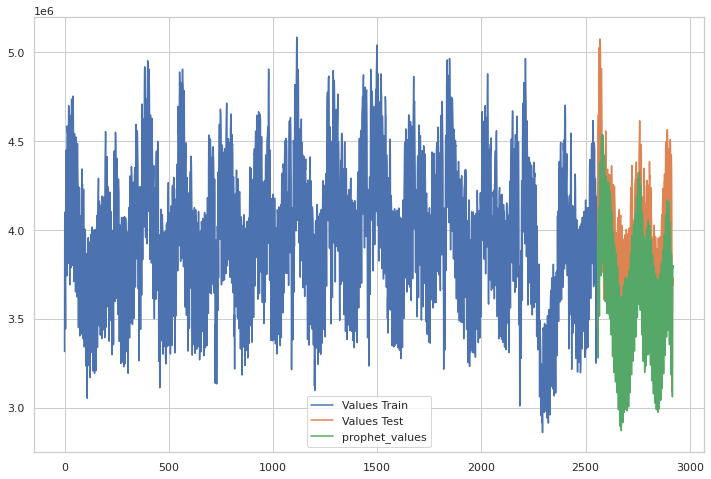

In [185]:
train_prophet['y'].plot(legend = True, label='Values Train')
test_prophet['y'].plot(legend = True, label='Values Test')
test_prophet['prophet_values'].plot(legend=True, figsize=(12, 8))

In [186]:
rmse_prophet = mean_squared_error(test_prophet['y'], test_prophet['prophet_values'])
mape_prophet = mean_absolute_percentage_error(test_prophet['y'], test_prophet['prophet_values'])

print(f'RMSE: {rmse_prophet:11.10}')
print(f'MAPE: {mape_prophet:11.10}')

RMSE: 8.933144932e+10
MAPE: 0.06370373541


In [187]:
mae_prophet_original = mean_absolute_error(test_prophet['y'], test_prophet['prophet_values'])
mse_prophet_original = mean_squared_error(test_prophet['y'], test_prophet['prophet_values'])
rmse_prophet_original = np.sqrt(mean_squared_error(test_prophet['y'], test_prophet['prophet_values']))
mape_prophet_original = mean_absolute_percentage_error(test_prophet['y'], test_prophet['prophet_values'])
smape_prophet_original = smape(test_prophet['y'], test_prophet['prophet_values'])
mase_prophet_original = mase(train_prophet['y'], test_prophet['y'], test_prophet['prophet_values'])

print(f'MAE: {mae_prophet_original:11.10}')
print(f'MSE: {mse_prophet_original:11.10}')
print(f'RMSE: {rmse_prophet_original:11.10}')
print('----------------------')
print(f'MAPE: {mape_prophet_original:11.10}')
print(f'sMAPE: {smape_prophet_original:11.10}')
print('----------------------')
print(f'MASE: {mase_prophet_original:11.10}')

MAE: 256393.6497
MSE: 8.933144932e+10
RMSE: 298883.6719
----------------------
MAPE: 0.06370373541
sMAPE: 6.611463455
----------------------
MASE: 1.054424196


#### b) Prophet con días de la semana y día laboral/festivo

In [188]:
df_prophet = pd.read_csv('demanda_electrica_diaria.csv')
df_prophet.head()

,date,value,weekday,working_day
0,2014-01-01,3315035.0,2,0
1,2014-01-02,4059590.0,3,1
2,2014-01-03,4098986.0,4,1
3,2014-01-04,3867911.0,5,1
4,2014-01-05,3648038.0,6,1


In [189]:
df_prophet.rename(columns = {'date':'ds', 'value':'y'}, inplace = True)
df_prophet.head()

,ds,y,weekday,working_day
0,2014-01-01,3315035.0,2,0
1,2014-01-02,4059590.0,3,1
2,2014-01-03,4098986.0,4,1
3,2014-01-04,3867911.0,5,1
4,2014-01-05,3648038.0,6,1


In [190]:
index_2021 = df_prophet['ds'].loc[lambda x: x=='2021-01-01'].index[0]
last_index = df_prophet['ds'].last_valid_index()

In [191]:
train_prophet = df_prophet.iloc[0:index_2021]
train_prophet

,ds,y,weekday,working_day
0,2014-01-01,3315035.0,2,0
1,2014-01-02,4059590.0,3,1
2,2014-01-03,4098986.0,4,1
3,2014-01-04,3867911.0,5,1
4,2014-01-05,3648038.0,6,1
...,...,...,...,...
2552,2020-12-27,3687140.0,6,1
2553,2020-12-28,4149036.0,0,1
2554,2020-12-29,4185143.0,1,1
2555,2020-12-30,4189581.0,2,1


In [192]:
test_prophet = df_prophet.iloc[index_2021:last_index]
test_prophet

,ds,y,weekday,working_day
2557,2021-01-01,3447073.0,4,0
2558,2021-01-02,3867892.0,5,1
2559,2021-01-03,3899502.0,6,1
2560,2021-01-04,4563905.0,0,1
2561,2021-01-05,4647728.0,1,1
...,...,...,...,...
2916,2021-12-26,3272059.0,6,1
2917,2021-12-27,3686647.0,0,1
2918,2021-12-28,3729169.0,1,1
2919,2021-12-29,3692921.0,2,1


In [193]:
prophet = Prophet()

In [194]:
regressors = [
    'weekday',
    'working_day'
]

for var in regressors:
    prophet.add_regressor(var)

In [195]:
prophet.fit(train_prophet)

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -22.7833
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       7357.29    0.00195215       182.179      0.9998      0.9998      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     156       7360.84   2.87252e-05       104.693    1.38e-07       0.001      229  LS failed, Hessian reset 
     199        7361.7   0.000722949       96.2333           1           1      282   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     243       7362.23   3.61998e-05       145.399   1.591e-07       0.001      372  LS failed, Hessian reset 
     299       7362.98    0.00218314       253.768       0.968       0.968      436   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     305       7363.15   5.46433e-05       209.367   2.523e-07       0.001      491  LS failed, Hessian rese

In [196]:
future_values = prophet.make_future_dataframe(periods=len(test_prophet))
future_values['weekday'] = df_prophet["weekday"]
future_values['working_day'] = df_prophet["working_day"]
future_values

,ds,weekday,working_day
0,2014-01-01,2,0
1,2014-01-02,3,1
2,2014-01-03,4,1
3,2014-01-04,5,1
4,2014-01-05,6,1
...,...,...,...
2916,2021-12-26,6,1
2917,2021-12-27,0,1
2918,2021-12-28,1,1
2919,2021-12-29,2,1


In [197]:
forecast_values = prophet.predict(future_values)

In [198]:
test_prophet['prophet_values'] = np.asarray(forecast_values[-364:]['yhat'])
test_prophet

,ds,y,weekday,working_day,prophet_values
2557,2021-01-01,3447073.0,4,0,3.399298e+06
2558,2021-01-02,3867892.0,5,1,3.593518e+06
2559,2021-01-03,3899502.0,6,1,3.343910e+06
2560,2021-01-04,4563905.0,0,1,3.985493e+06
2561,2021-01-05,4647728.0,1,1,4.130419e+06
...,...,...,...,...,...
2916,2021-12-26,3272059.0,6,1,3.122618e+06
2917,2021-12-27,3686647.0,0,1,3.733813e+06
2918,2021-12-28,3729169.0,1,1,3.849699e+06
2919,2021-12-29,3692921.0,2,1,3.862718e+06


<AxesSubplot:>

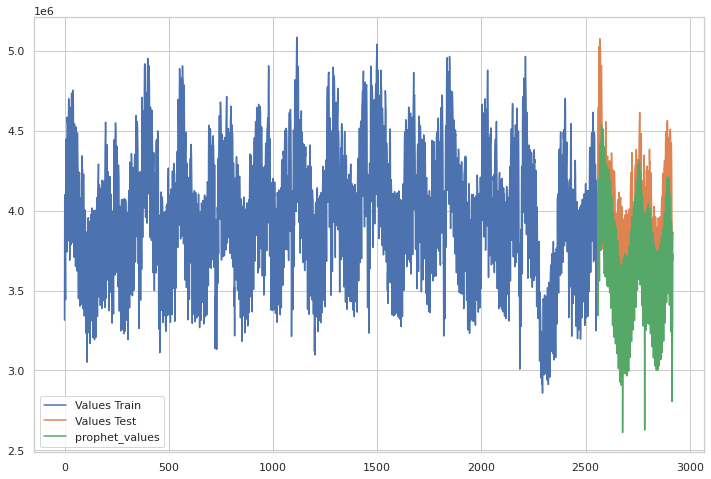

In [199]:
train_prophet['y'].plot(legend = True, label='Values Train')
test_prophet['y'].plot(legend = True, label='Values Test')
test_prophet['prophet_values'].plot(legend=True, figsize=(12, 8))

In [200]:
rmse_prophet_weekday = mean_squared_error(test_prophet['y'], test_prophet['prophet_values'])
mape_prophet_weekday = mean_absolute_percentage_error(test_prophet['y'], test_prophet['prophet_values'])

print(f'RMSE: {rmse_prophet_weekday:11.10}')
print(f'MAPE: {mape_prophet_weekday:11.10}')

RMSE: 8.276368985e+10
MAPE: 0.06077138953


In [201]:
mae_prophet_weekday = mean_absolute_error(test_prophet['y'], test_prophet['prophet_values'])
mse_prophet_weekday = mean_squared_error(test_prophet['y'], test_prophet['prophet_values'])
rmse_prophet_weekday = np.sqrt(mean_squared_error(test_prophet['y'], test_prophet['prophet_values']))
mape_prophet_weekday = mean_absolute_percentage_error(test_prophet['y'], test_prophet['prophet_values'])
smape_prophet_weekday = smape(test_prophet['y'], test_prophet['prophet_values'])
mase_prophet_weekday = mase(train_prophet['y'], test_prophet['y'], test_prophet['prophet_values'])

print(f'MAE: {mae_prophet_weekday:11.10}')
print(f'MSE: {mse_prophet_weekday:11.10}')
print(f'RMSE: {rmse_prophet_weekday:11.10}')
print('----------------------')
print(f'MAPE: {mape_prophet_weekday:11.10}')
print(f'sMAPE: {smape_prophet_weekday:11.10}')
print('----------------------')
print(f'MASE: {mase_prophet_weekday:11.10}')

MAE: 244899.9862
MSE: 8.276368985e+10
RMSE: 287686.7912
----------------------
MAPE: 0.06077138953
sMAPE: 6.329670193
----------------------
MASE: 1.007156267


#### c) Prophet días de la semana, día laboral/festivo y temperatura

In [202]:
df_prophet = pd.read_csv('demanda_day_temp_resume_total.csv')
df_prophet.head()

,date,value,weekday,working_day,madrid_temp,barcelona_temp,bilbao_temp,sevilla_temp,valencia_temp
0,2014-01-01,3315035.0,2.0,0.0,6.785193,8.006851,11.418970,12.184413,13.189499
1,2014-01-02,4059590.0,3.0,1.0,9.109185,10.764683,12.935602,14.524325,15.136449
2,2014-01-03,4098986.0,4.0,1.0,9.776889,11.935958,13.029657,15.653018,16.565861
3,2014-01-04,3867911.0,5.0,1.0,6.703811,11.307489,9.814500,14.106683,14.699295
4,2014-01-05,3648038.0,6.0,1.0,5.285333,8.682916,9.971085,10.653680,10.970076


In [203]:
df_prophet.rename(columns = {'date':'ds', 'value':'y'}, inplace = True)
df_prophet.head()

,ds,y,weekday,working_day,madrid_temp,barcelona_temp,bilbao_temp,sevilla_temp,valencia_temp
0,2014-01-01,3315035.0,2.0,0.0,6.785193,8.006851,11.418970,12.184413,13.189499
1,2014-01-02,4059590.0,3.0,1.0,9.109185,10.764683,12.935602,14.524325,15.136449
2,2014-01-03,4098986.0,4.0,1.0,9.776889,11.935958,13.029657,15.653018,16.565861
3,2014-01-04,3867911.0,5.0,1.0,6.703811,11.307489,9.814500,14.106683,14.699295
4,2014-01-05,3648038.0,6.0,1.0,5.285333,8.682916,9.971085,10.653680,10.970076


In [204]:
index_2021 = df_prophet['ds'].loc[lambda x: x=='2021-01-01'].index[0]
last_index = df_prophet['ds'].last_valid_index()

In [205]:
train_prophet = df_prophet.iloc[0:index_2021]
train_prophet

,ds,y,weekday,working_day,madrid_temp,barcelona_temp,bilbao_temp,sevilla_temp,valencia_temp
0,2014-01-01,3315035.0,2.0,0.0,6.785193,8.006851,11.418970,12.184413,13.189499
1,2014-01-02,4059590.0,3.0,1.0,9.109185,10.764683,12.935602,14.524325,15.136449
2,2014-01-03,4098986.0,4.0,1.0,9.776889,11.935958,13.029657,15.653018,16.565861
3,2014-01-04,3867911.0,5.0,1.0,6.703811,11.307489,9.814500,14.106683,14.699295
4,2014-01-05,3648038.0,6.0,1.0,5.285333,8.682916,9.971085,10.653680,10.970076
...,...,...,...,...,...,...,...,...,...
2552,2020-12-27,3687140.0,6.0,1.0,1.845615,5.074426,7.337875,7.333795,8.264887
2553,2020-12-28,4149036.0,0.0,1.0,5.030428,8.714899,7.470769,10.717422,11.297570
2554,2020-12-29,4185143.0,1.0,1.0,2.841488,7.956539,5.964505,8.562127,9.813002
2555,2020-12-30,4189581.0,2.0,1.0,2.005192,7.194656,6.043775,6.965405,9.325045


In [206]:
test_prophet = df_prophet.iloc[index_2021:last_index]
test_prophet

,ds,y,weekday,working_day,madrid_temp,barcelona_temp,bilbao_temp,sevilla_temp,valencia_temp
2557,2021-01-01,3447073.0,4.0,0.0,2.184065,6.170630,4.822402,8.808740,9.047967
2558,2021-01-02,3867892.0,5.0,1.0,0.537135,5.119815,3.427820,6.213597,7.486780
2559,2021-01-03,3899502.0,6.0,1.0,0.814590,5.368504,4.247380,4.972193,7.664697
2560,2021-01-04,4563905.0,0.0,1.0,0.781345,3.936111,3.047703,6.441625,7.268713
2561,2021-01-05,4647728.0,1.0,1.0,0.119664,3.608848,3.347874,6.642948,6.059656
...,...,...,...,...,...,...,...,...,...
2916,2021-12-26,3272059.0,6.0,1.0,8.705022,10.428146,11.192876,15.271273,14.145186
2917,2021-12-27,3686647.0,0.0,1.0,11.606002,13.531011,14.285517,17.009720,17.443636
2918,2021-12-28,3729169.0,1.0,1.0,9.792129,14.261092,14.133620,16.015375,16.007968
2919,2021-12-29,3692921.0,2.0,1.0,8.401157,13.250848,12.936356,13.320164,15.173263


In [207]:
prophet = Prophet()

regressors = [
    'weekday',
    'working_day',
    'madrid_temp',
    'barcelona_temp',
    'bilbao_temp',
    'sevilla_temp',
    'valencia_temp'
]

for var in regressors:
    prophet.add_regressor(var)

prophet.fit(train_prophet)

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -22.7833


    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       7376.02    0.00171204       314.637           1           1      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       7380.51   0.000188651       422.841      0.5956      0.5956      238   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299        7382.1   0.000945194       219.569           1           1      350   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       7383.96      0.003074       484.039           1           1      461   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       7384.78   9.26291e-05       154.604      0.4639      0.4639      578   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     576     

In [208]:
future_values = prophet.make_future_dataframe(periods=len(test_prophet))
future_values['weekday'] = df_prophet["weekday"]
future_values['working_day'] = df_prophet["working_day"]
future_values['madrid_temp'] = df_prophet["madrid_temp"]
future_values['barcelona_temp'] = df_prophet["barcelona_temp"]
future_values['bilbao_temp'] = df_prophet["bilbao_temp"]
future_values['sevilla_temp'] = df_prophet["sevilla_temp"]
future_values['valencia_temp'] = df_prophet["valencia_temp"]

future_values

,ds,weekday,working_day,madrid_temp,barcelona_temp,bilbao_temp,sevilla_temp,valencia_temp
0,2014-01-01,2.0,0.0,6.785193,8.006851,11.418970,12.184413,13.189499
1,2014-01-02,3.0,1.0,9.109185,10.764683,12.935602,14.524325,15.136449
2,2014-01-03,4.0,1.0,9.776889,11.935958,13.029657,15.653018,16.565861
3,2014-01-04,5.0,1.0,6.703811,11.307489,9.814500,14.106683,14.699295
4,2014-01-05,6.0,1.0,5.285333,8.682916,9.971085,10.653680,10.970076
...,...,...,...,...,...,...,...,...
2916,2021-12-26,6.0,1.0,8.705022,10.428146,11.192876,15.271273,14.145186
2917,2021-12-27,0.0,1.0,11.606002,13.531011,14.285517,17.009720,17.443636
2918,2021-12-28,1.0,1.0,9.792129,14.261092,14.133620,16.015375,16.007968
2919,2021-12-29,2.0,1.0,8.401157,13.250848,12.936356,13.320164,15.173263


In [209]:
forecast_values = prophet.predict(future_values)

test_prophet['prophet_values'] = np.asarray(forecast_values[-364:]['yhat'])
test_prophet

,ds,y,weekday,working_day,madrid_temp,barcelona_temp,bilbao_temp,sevilla_temp,valencia_temp,prophet_values
2557,2021-01-01,3447073.0,4.0,0.0,2.184065,6.170630,4.822402,8.808740,9.047967,3.415297e+06
2558,2021-01-02,3867892.0,5.0,1.0,0.537135,5.119815,3.427820,6.213597,7.486780,3.623586e+06
2559,2021-01-03,3899502.0,6.0,1.0,0.814590,5.368504,4.247380,4.972193,7.664697,3.378621e+06
2560,2021-01-04,4563905.0,0.0,1.0,0.781345,3.936111,3.047703,6.441625,7.268713,4.017302e+06
2561,2021-01-05,4647728.0,1.0,1.0,0.119664,3.608848,3.347874,6.642948,6.059656,4.148030e+06
...,...,...,...,...,...,...,...,...,...,...
2916,2021-12-26,3272059.0,6.0,1.0,8.705022,10.428146,11.192876,15.271273,14.145186,3.123065e+06
2917,2021-12-27,3686647.0,0.0,1.0,11.606002,13.531011,14.285517,17.009720,17.443636,3.728652e+06
2918,2021-12-28,3729169.0,1.0,1.0,9.792129,14.261092,14.133620,16.015375,16.007968,3.831455e+06
2919,2021-12-29,3692921.0,2.0,1.0,8.401157,13.250848,12.936356,13.320164,15.173263,3.859500e+06


<AxesSubplot:>

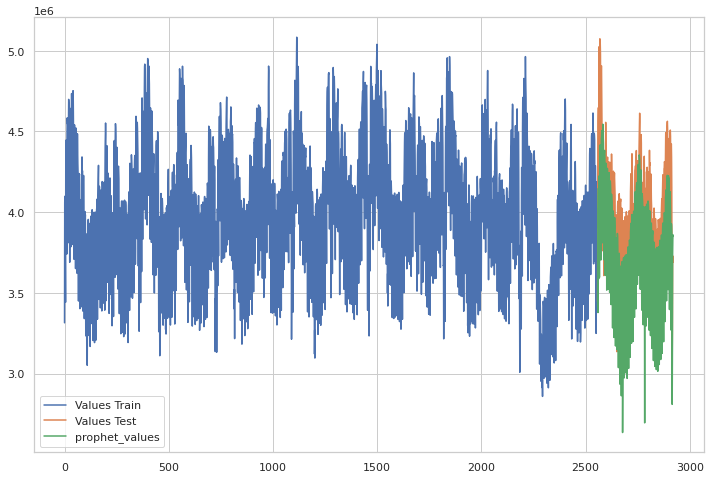

In [210]:
train_prophet['y'].plot(legend = True, label='Values Train')
test_prophet['y'].plot(legend = True, label='Values Test')
test_prophet['prophet_values'].plot(legend=True, figsize=(12, 8))

In [211]:
rmse_prophet_weekday_temp = mean_squared_error(test_prophet['y'], test_prophet['prophet_values'])
mape_prophet_weekday_temp = mean_absolute_percentage_error(test_prophet['y'], test_prophet['prophet_values'])

print(f'RMSE: {rmse_prophet_weekday_temp:11.10}')
print(f'MAPE: {mape_prophet_weekday_temp:11.10}')

RMSE: 7.616588585e+10
MAPE: 0.05769733943


In [212]:
mae_prophet_weekday_temp = mean_absolute_error(test_prophet['y'], test_prophet['prophet_values'])
mse_prophet_weekday_temp = mean_squared_error(test_prophet['y'], test_prophet['prophet_values'])
rmse_prophet_weekday_temp = np.sqrt(mean_squared_error(test_prophet['y'], test_prophet['prophet_values']))
mape_prophet_weekday_temp = mean_absolute_percentage_error(test_prophet['y'], test_prophet['prophet_values'])
smape_prophet_weekday_temp = smape(test_prophet['y'], test_prophet['prophet_values'])
mase_prophet_weekday_temp = mase(train_prophet['y'], test_prophet['y'], test_prophet['prophet_values'])

print(f'MAE: {mae_prophet_weekday_temp:11.10}')
print(f'MSE: {mse_prophet_weekday_temp:11.10}')
print(f'RMSE: {rmse_prophet_weekday_temp:11.10}')
print('----------------------')
print(f'MAPE: {mape_prophet_weekday_temp:11.10}')
print(f'sMAPE: {smape_prophet_weekday_temp:11.10}')
print('----------------------')
print(f'MASE: {mase_prophet_weekday_temp:11.10}')

MAE: 232711.2516
MSE: 7.616588585e+10
RMSE: 275981.6767
----------------------
MAPE: 0.05769733943
sMAPE: 5.998794706
----------------------
MASE: 0.9570298432


#### d) Prophet días de la semana, día laboral/festivo, temperatura y estacionalidad

In [213]:
df_prophet = pd.read_csv('demanda_day_temp_seasonal_resume.csv')
df_prophet.head()

,date,value,weekday,working_day,madrid_temp,barcelona_temp,bilbao_temp,sevilla_temp,valencia_temp,is_winter,is_summer
0,2014-01-01,3315035.0,2.0,0.0,6.785193,8.006851,11.418970,12.184413,13.189499,1,0
1,2014-01-02,4059590.0,3.0,1.0,9.109185,10.764683,12.935602,14.524325,15.136449,1,0
2,2014-01-03,4098986.0,4.0,1.0,9.776889,11.935958,13.029657,15.653018,16.565861,1,0
3,2014-01-04,3867911.0,5.0,1.0,6.703811,11.307489,9.814500,14.106683,14.699295,1,0
4,2014-01-05,3648038.0,6.0,1.0,5.285333,8.682916,9.971085,10.653680,10.970076,1,0


In [214]:
df_prophet.rename(columns = {'date':'ds', 'value':'y'}, inplace = True)
df_prophet.head()

,ds,y,weekday,working_day,madrid_temp,barcelona_temp,bilbao_temp,sevilla_temp,valencia_temp,is_winter,is_summer
0,2014-01-01,3315035.0,2.0,0.0,6.785193,8.006851,11.418970,12.184413,13.189499,1,0
1,2014-01-02,4059590.0,3.0,1.0,9.109185,10.764683,12.935602,14.524325,15.136449,1,0
2,2014-01-03,4098986.0,4.0,1.0,9.776889,11.935958,13.029657,15.653018,16.565861,1,0
3,2014-01-04,3867911.0,5.0,1.0,6.703811,11.307489,9.814500,14.106683,14.699295,1,0
4,2014-01-05,3648038.0,6.0,1.0,5.285333,8.682916,9.971085,10.653680,10.970076,1,0


In [215]:
index_2021 = df_prophet['ds'].loc[lambda x: x=='2021-01-01'].index[0]
last_index = df_prophet['ds'].last_valid_index()

In [216]:
train_prophet = df_prophet.iloc[0:index_2021]
train_prophet

,ds,y,weekday,working_day,madrid_temp,barcelona_temp,bilbao_temp,sevilla_temp,valencia_temp,is_winter,is_summer
0,2014-01-01,3315035.0,2.0,0.0,6.785193,8.006851,11.418970,12.184413,13.189499,1,0
1,2014-01-02,4059590.0,3.0,1.0,9.109185,10.764683,12.935602,14.524325,15.136449,1,0
2,2014-01-03,4098986.0,4.0,1.0,9.776889,11.935958,13.029657,15.653018,16.565861,1,0
3,2014-01-04,3867911.0,5.0,1.0,6.703811,11.307489,9.814500,14.106683,14.699295,1,0
4,2014-01-05,3648038.0,6.0,1.0,5.285333,8.682916,9.971085,10.653680,10.970076,1,0
...,...,...,...,...,...,...,...,...,...,...,...
2552,2020-12-27,3687140.0,6.0,1.0,1.845615,5.074426,7.337875,7.333795,8.264887,0,0
2553,2020-12-28,4149036.0,0.0,1.0,5.030428,8.714899,7.470769,10.717422,11.297570,0,0
2554,2020-12-29,4185143.0,1.0,1.0,2.841488,7.956539,5.964505,8.562127,9.813002,0,0
2555,2020-12-30,4189581.0,2.0,1.0,2.005192,7.194656,6.043775,6.965405,9.325045,0,0


In [217]:
test_prophet = df_prophet.iloc[index_2021:last_index]
test_prophet

,ds,y,weekday,working_day,madrid_temp,barcelona_temp,bilbao_temp,sevilla_temp,valencia_temp,is_winter,is_summer
2557,2021-01-01,3447073.0,4.0,0.0,2.184065,6.170630,4.822402,8.808740,9.047967,0,0
2558,2021-01-02,3867892.0,5.0,1.0,0.537135,5.119815,3.427820,6.213597,7.486780,0,0
2559,2021-01-03,3899502.0,6.0,1.0,0.814590,5.368504,4.247380,4.972193,7.664697,0,0
2560,2021-01-04,4563905.0,0.0,1.0,0.781345,3.936111,3.047703,6.441625,7.268713,0,0
2561,2021-01-05,4647728.0,1.0,1.0,0.119664,3.608848,3.347874,6.642948,6.059656,0,0
...,...,...,...,...,...,...,...,...,...,...,...
2916,2021-12-26,3272059.0,6.0,1.0,8.705022,10.428146,11.192876,15.271273,14.145186,1,0
2917,2021-12-27,3686647.0,0.0,1.0,11.606002,13.531011,14.285517,17.009720,17.443636,1,0
2918,2021-12-28,3729169.0,1.0,1.0,9.792129,14.261092,14.133620,16.015375,16.007968,1,0
2919,2021-12-29,3692921.0,2.0,1.0,8.401157,13.250848,12.936356,13.320164,15.173263,1,0


In [218]:
prophet = Prophet()

regressors = [
    'weekday',
    'working_day',
    'madrid_temp',
    'barcelona_temp',
    'bilbao_temp',
    'sevilla_temp',
    'valencia_temp',
    'is_winter',
    'is_summer'
]

for var in regressors:
    prophet.add_regressor(var)

prophet.fit(train_prophet)

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -22.7833


    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       7379.57    0.00110749       743.564      0.2333           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       7384.06   0.000447321       346.949      0.3461           1      232   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       7385.68    0.00164269       278.398           1           1      347   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       7387.34   4.85331e-05        256.29      0.6757      0.6757      475   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       7387.98   9.06097e-05       123.461           1           1      585   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     599     

In [219]:
future_values = prophet.make_future_dataframe(periods=len(test_prophet))
future_values['weekday'] = df_prophet["weekday"]
future_values['working_day'] = df_prophet["working_day"]
future_values['madrid_temp'] = df_prophet["madrid_temp"]
future_values['barcelona_temp'] = df_prophet["barcelona_temp"]
future_values['bilbao_temp'] = df_prophet["bilbao_temp"]
future_values['sevilla_temp'] = df_prophet["sevilla_temp"]
future_values['valencia_temp'] = df_prophet["valencia_temp"]
future_values['is_winter'] = df_prophet["is_winter"]
future_values['is_summer'] = df_prophet["is_summer"]

future_values

,ds,weekday,working_day,madrid_temp,barcelona_temp,bilbao_temp,sevilla_temp,valencia_temp,is_winter,is_summer
0,2014-01-01,2.0,0.0,6.785193,8.006851,11.418970,12.184413,13.189499,1,0
1,2014-01-02,3.0,1.0,9.109185,10.764683,12.935602,14.524325,15.136449,1,0
2,2014-01-03,4.0,1.0,9.776889,11.935958,13.029657,15.653018,16.565861,1,0
3,2014-01-04,5.0,1.0,6.703811,11.307489,9.814500,14.106683,14.699295,1,0
4,2014-01-05,6.0,1.0,5.285333,8.682916,9.971085,10.653680,10.970076,1,0
...,...,...,...,...,...,...,...,...,...,...
2916,2021-12-26,6.0,1.0,8.705022,10.428146,11.192876,15.271273,14.145186,1,0
2917,2021-12-27,0.0,1.0,11.606002,13.531011,14.285517,17.009720,17.443636,1,0
2918,2021-12-28,1.0,1.0,9.792129,14.261092,14.133620,16.015375,16.007968,1,0
2919,2021-12-29,2.0,1.0,8.401157,13.250848,12.936356,13.320164,15.173263,1,0


In [220]:
forecast_values = prophet.predict(future_values)

In [221]:
test_prophet['prophet_values'] = np.asarray(forecast_values[-364:]['yhat'])
test_prophet

,ds,y,weekday,working_day,madrid_temp,barcelona_temp,bilbao_temp,sevilla_temp,valencia_temp,is_winter,is_summer,prophet_values
2557,2021-01-01,3447073.0,4.0,0.0,2.184065,6.170630,4.822402,8.808740,9.047967,0,0,3.369859e+06
2558,2021-01-02,3867892.0,5.0,1.0,0.537135,5.119815,3.427820,6.213597,7.486780,0,0,3.578571e+06
2559,2021-01-03,3899502.0,6.0,1.0,0.814590,5.368504,4.247380,4.972193,7.664697,0,0,3.329299e+06
2560,2021-01-04,4563905.0,0.0,1.0,0.781345,3.936111,3.047703,6.441625,7.268713,0,0,3.964240e+06
2561,2021-01-05,4647728.0,1.0,1.0,0.119664,3.608848,3.347874,6.642948,6.059656,0,0,4.091135e+06
...,...,...,...,...,...,...,...,...,...,...,...,...
2916,2021-12-26,3272059.0,6.0,1.0,8.705022,10.428146,11.192876,15.271273,14.145186,1,0,3.185346e+06
2917,2021-12-27,3686647.0,0.0,1.0,11.606002,13.531011,14.285517,17.009720,17.443636,1,0,3.786485e+06
2918,2021-12-28,3729169.0,1.0,1.0,9.792129,14.261092,14.133620,16.015375,16.007968,1,0,3.885252e+06
2919,2021-12-29,3692921.0,2.0,1.0,8.401157,13.250848,12.936356,13.320164,15.173263,1,0,3.909477e+06


<AxesSubplot:>

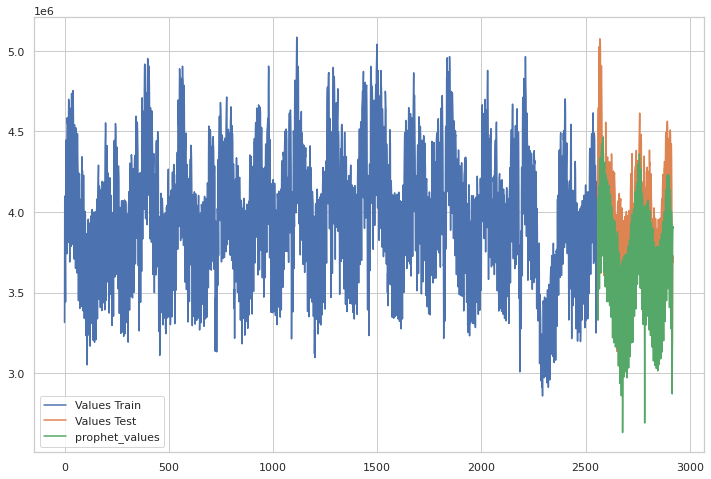

In [222]:
train_prophet['y'].plot(legend = True, label='Values Train')
test_prophet['y'].plot(legend = True, label='Values Test')
test_prophet['prophet_values'].plot(legend=True, figsize=(12, 8))

In [223]:
rmse_prophet_weekday_temp_season = mean_squared_error(test_prophet['y'], test_prophet['prophet_values'])
mape_prophet_weekday_temp_season = mean_absolute_percentage_error(test_prophet['y'], test_prophet['prophet_values'])

print(f'RMSE: {rmse_prophet_weekday_temp_season:11.10}')
print(f'MAPE: {mape_prophet_weekday_temp_season:11.10}')

RMSE: 8.244150143e+10
MAPE: 0.05993476927


In [224]:
mae_prophet_weekday_temp_season = mean_absolute_error(test_prophet['y'], test_prophet['prophet_values'])
mse_prophet_weekday_temp_season = mean_squared_error(test_prophet['y'], test_prophet['prophet_values'])
rmse_prophet_weekday_temp_season = np.sqrt(mean_squared_error(test_prophet['y'], test_prophet['prophet_values']))
mape_prophet_weekday_temp_season = mean_absolute_percentage_error(test_prophet['y'], test_prophet['prophet_values'])
smape_prophet_weekday_temp_season = smape(test_prophet['y'], test_prophet['prophet_values'])
mase_prophet_weekday_temp_season = mase(train_prophet['y'], test_prophet['y'], test_prophet['prophet_values'])

print(f'MAE: {mae_prophet_weekday_temp_season:11.10}')
print(f'MSE: {mse_prophet_weekday_temp_season:11.10}')
print(f'RMSE: {rmse_prophet_weekday_temp_season:11.10}')
print('----------------------')
print(f'MAPE: {mape_prophet_weekday_temp_season:11.10}')
print(f'sMAPE: {smape_prophet_weekday_temp_season:11.10}')
print('----------------------')
print(f'MASE: {mase_prophet_weekday_temp_season:11.10}')

MAE: 242320.3957
MSE: 8.244150143e+10
RMSE: 287126.2813
----------------------
MAPE: 0.05993476927
sMAPE: 6.240010468
----------------------
MASE: 0.9965476472


## 4) Comparativa modelos

In [225]:
# Holt-Winters
print('===== HOLT-WINTERS (monthly) =====')
print(f'RMSE: {rmse_hw_monthly:11.10}')
print(f'MAPE: {mape_hw_monthly:11.10}')
print('')
print('===== HOLT-WINTERS (daily) =====')
print(f'RMSE: {rmse_hw_daily:11.10}')
print(f'MAPE: {mape_hw_daily:11.10}')
print('')
# Sarimax
print('===== SARIMAX (working_day) =====')
print(f'RMSE: {rmse_sarimax:11.10}')
print(f'MAPE: {mape_sarimax:11.10}')
print('===== SARIMAX (weekday, working_day) =====')
print(f'RMSE: {rmse_sarimax_weekday:11.10}')
print(f'MAPE: {mape_sarimax_weekday:11.10}')
print('===== SARIMAX (weekday, working_day, temperature) =====')
print(f'RMSE: {rmse_sarimax_temp:11.10}')
print(f'MAPE: {mape_sarimax_temp:11.10}')
print('')
# XGBoost
print('===== XGBOOST (weekday, working_day) =====')
print(f'RMSE: {rmse_xgboost:11.10}')
print(f'MAPE: {mape_xgboost:11.10}')
print('===== XGBOOST (weekday, working_day, temperature) =====')
print(f'RMSE: {rmse_xgboost_temp:11.10}')
print(f'MAPE: {mape_xgboost_temp:11.10}')
print('===== XGBOOST (weekday, working_day, temperature, season) =====')
print(f'RMSE: {rmse_xgboost_temp_season:11.10}')
print(f'MAPE: {mape_xgboost_temp_season:11.10}')
print('')
# Prophet
print('===== PROPHET =====')
print(f'RMSE: {rmse_prophet:11.10}')
print(f'MAPE: {mape_prophet:11.10}')
print('===== PROPHET (weekday, working_day) =====')
print(f'RMSE: {rmse_prophet_weekday:11.10}')
print(f'MAPE: {mape_prophet_weekday:11.10}')
print('===== PROPHET (weekday, working_day, temperature) =====')
print(f'RMSE: {rmse_prophet_weekday_temp:11.10}')
print(f'MAPE: {mape_prophet_weekday_temp:11.10}')
print('===== PROPHET (weekday, working_day, temperature, season) =====')
print(f'RMSE: {rmse_prophet_weekday_temp_season:11.10}')
print(f'MAPE: {mape_prophet_weekday_temp_season:11.10}')

===== HOLT-WINTERS (monthly) =====
RMSE: 3298203.452
MAPE: 0.02292108206

===== HOLT-WINTERS (daily) =====
RMSE: 511308.3337
MAPE: 0.1139483934

===== SARIMAX (working_day) =====
RMSE: 1.212654134e+11
MAPE: 0.07004791899
===== SARIMAX (weekday, working_day) =====
RMSE: 321115.2885
MAPE: 0.05857627224
===== SARIMAX (weekday, working_day, temperature) =====
RMSE: 1.186571355e+11
MAPE: 0.06119586967

===== XGBOOST (weekday, working_day) =====
RMSE: 334806.1746
MAPE: 0.07118146536
===== XGBOOST (weekday, working_day, temperature) =====
RMSE: 336916.6937
MAPE: 0.07214256443
===== XGBOOST (weekday, working_day, temperature, season) =====
RMSE: 336916.6937
MAPE: 0.07214256443

===== PROPHET =====
RMSE: 8.933144932e+10
MAPE: 0.06370373541
===== PROPHET (weekday, working_day) =====
RMSE: 287686.7912
MAPE: 0.06077138953
===== PROPHET (weekday, working_day, temperature) =====
RMSE: 275981.6767
MAPE: 0.05769733943
===== PROPHET (weekday, working_day, temperature, season) =====
RMSE: 287126.2813
MA

In [226]:
# Holt-Winters
print('===== HOLT-WINTERS (monthly) =====')
print(f'MAE: {mae_hw_monthly:11.10}')
print(f'MSE: {mse_hw_monthly:11.10}')
print(f'RMSE: {rmse_hw_monthly:11.10}')
print('----------------------')
print(f'MAPE: {mape_hw_monthly:11.10}')
print(f'sMAPE: {smape_hw_monthly:11.10}')
print('----------------------')
print(f'MASE: {mase_hw_monthly:11.10}')
print('')
print('===== HOLT-WINTERS (daily) =====')
print(f'MAE: {mae_hw_daily:11.10}')
print(f'MSE: {mse_hw_daily:11.10}')
print(f'RMSE: {rmse_hw_daily:11.10}')
print('----------------------')
print(f'MAPE: {mape_hw_daily:11.10}')
print(f'sMAPE: {smape_hw_daily:11.10}')
print('----------------------')
print(f'MASE: {mase_hw_daily:11.10}')
print('')
# Sarimax
print('===== SARIMAX =====')
print(f'MAE: {mae_sarimax_original:11.10}')
print(f'MSE: {mse_sarimax_original:11.10}')
print(f'RMSE: {rmse_sarimax_original:11.10}')
print('----------------------')
print(f'MAPE: {mape_sarimax_original:11.10}')
print(f'sMAPE: {smape_sarimax_original:11.10}')
print('----------------------')
print(f'MASE: {mase_sarimax_original:11.10}')
print('')
print('===== SARIMAX (working_day) =====')
print(f'MAE: {mae_sarimax_working_day:11.10}')
print(f'MSE: {mse_sarimax_working_day:11.10}')
print(f'RMSE: {rmse_sarimax_working_day:11.10}')
print('----------------------')
print(f'MAPE: {mape_sarimax_working_day:11.10}')
print(f'sMAPE: {smape_sarimax_working_day:11.10}')
print('----------------------')
print(f'MASE: {mase_sarimax_working_day:11.10}')
print('')
print('===== SARIMAX (weekday, working_day) =====')
print(f'MAE: {mae_sarimax_weekday:11.10}')
print(f'MSE: {mse_sarimax_weekday:11.10}')
print(f'RMSE: {rmse_sarimax_weekday:11.10}')
print('----------------------')
print(f'MAPE: {mape_sarimax_weekday:11.10}')
print(f'sMAPE: {smape_sarimax_weekday:11.10}')
print('----------------------')
print(f'MASE: {mase_sarimax_weekday:11.10}')
print('')
print('===== SARIMAX (weekday, working_day, temperature) =====')
print(f'MAE: {mae_sarimax_weekday_temp:11.10}')
print(f'MSE: {mse_sarimax_weekday_temp:11.10}')
print(f'RMSE: {rmse_sarimax_weekday_temp:11.10}')
print('----------------------')
print(f'MAPE: {mape_sarimax_weekday_temp:11.10}')
print(f'sMAPE: {smape_sarimax_weekday_temp:11.10}')
print('----------------------')
print(f'MASE: {mase_sarimax_weekday_temp:11.10}')
print('')
print('===== SARIMAX (weekday, working_day, temperature, season) =====')
print(f'MAE: {mae_sarimax_weekday_temp_seasonal:11.10}')
print(f'MSE: {mse_sarimax_weekday_temp_seasonal:11.10}')
print(f'RMSE: {rmse_sarimax_weekday_temp_seasonal:11.10}')
print('----------------------')
print(f'MAPE: {mape_sarimax_weekday_temp_seasonal:11.10}')
print(f'sMAPE: {smape_sarimax_weekday_temp_seasonal:11.10}')
print('----------------------')
print(f'MASE: {mase_sarimax_weekday_temp_seasonal:11.10}')
print('')
# XGBoost
print('===== XGBOOST =====')
print(f'MAE: {mae_xgboost_original:11.10}')
print(f'MSE: {mse_xgboost_original:11.10}')
print(f'RMSE: {rmse_xgboost_original:11.10}')
print('----------------------')
print(f'MAPE: {mape_xgboost_original:11.10}')
print(f'sMAPE: {smape_xgboost_original:11.10}')
print('----------------------')
print(f'MASE: {mase_xgboost_original:11.10}')
print('')
print('===== XGBOOST (weekday, working_day) =====')
print(f'MAE: {mae_xgboost_weekday:11.10}')
print(f'MSE: {mse_xgboost_weekday:11.10}')
print(f'RMSE: {rmse_xgboost_weekday:11.10}')
print('----------------------')
print(f'MAPE: {mape_xgboost_weekday:11.10}')
print(f'sMAPE: {smape_xgboost_weekday:11.10}')
print('----------------------')
print(f'MASE: {mase_xgboost_weekday:11.10}')
print('')
print('===== XGBOOST (weekday, working_day, temperature) =====')
print(f'MAE: {mae_xgboost_weekday_temp:11.10}')
print(f'MSE: {mse_xgboost_weekday_temp:11.10}')
print(f'RMSE: {rmse_xgboost_weekday_temp:11.10}')
print('----------------------')
print(f'MAPE: {mape_xgboost_weekday_temp:11.10}')
print(f'sMAPE: {smape_xgboost_weekday_temp:11.10}')
print('----------------------')
print(f'MASE: {mase_xgboost_weekday_temp:11.10}')
print('')
print('===== XGBOOST (weekday, working_day, temperature, season) =====')
print(f'MAE: {mae_xgboost_weekday_temp_season:11.10}')
print(f'MSE: {mse_xgboost_weekday_temp_season:11.10}')
print(f'RMSE: {rmse_xgboost_weekday_temp_season:11.10}')
print('----------------------')
print(f'MAPE: {mape_xgboost_weekday_temp_season:11.10}')
print(f'sMAPE: {smape_xgboost_weekday_temp_season:11.10}')
print('----------------------')
print(f'MASE: {mase_xgboost_weekday_temp_season:11.10}')
print('')
# Prophet
print('===== PROPHET =====')
print(f'MAE: {mae_prophet_original:11.10}')
print(f'MSE: {mse_prophet_original:11.10}')
print(f'RMSE: {rmse_prophet_original:11.10}')
print('----------------------')
print(f'MAPE: {mape_prophet_original:11.10}')
print(f'sMAPE: {smape_prophet_original:11.10}')
print('----------------------')
print(f'MASE: {mase_prophet_original:11.10}')
print('')
print('===== PROPHET (weekday, working_day) =====')
print(f'MAE: {mae_prophet_weekday:11.10}')
print(f'MSE: {mse_prophet_weekday:11.10}')
print(f'RMSE: {rmse_prophet_weekday:11.10}')
print('----------------------')
print(f'MAPE: {mape_prophet_weekday:11.10}')
print(f'sMAPE: {smape_prophet_weekday:11.10}')
print('----------------------')
print(f'MASE: {mase_prophet_weekday:11.10}')
print('')
print('===== PROPHET (weekday, working_day, temperature) =====')
print(f'MAE: {mae_prophet_weekday_temp:11.10}')
print(f'MSE: {mse_prophet_weekday_temp:11.10}')
print(f'RMSE: {rmse_prophet_weekday_temp:11.10}')
print('----------------------')
print(f'MAPE: {mape_prophet_weekday_temp:11.10}')
print(f'sMAPE: {smape_prophet_weekday_temp:11.10}')
print('----------------------')
print(f'MASE: {mase_prophet_weekday_temp:11.10}')
print('')
print('===== PROPHET (weekday, working_day, temperature, season) =====')
print(f'MAE: {mae_prophet_weekday_temp_season:11.10}')
print(f'MSE: {mse_prophet_weekday_temp_season:11.10}')
print(f'RMSE: {rmse_prophet_weekday_temp_season:11.10}')
print('----------------------')
print(f'MAPE: {mape_prophet_weekday_temp_season:11.10}')
print(f'sMAPE: {smape_prophet_weekday_temp_season:11.10}')
print('----------------------')
print(f'MASE: {mase_prophet_weekday_temp_season:11.10}')

===== HOLT-WINTERS (monthly) =====
MAE:   2770542.4
MSE: 1.087814601e+13
RMSE: 3298203.452
----------------------
MAPE: 0.02292108206
sMAPE: 2.258205931
----------------------
MASE: 0.4088149278

===== HOLT-WINTERS (daily) =====
MAE:  436156.443
MSE: 2.614362121e+11
RMSE: 511308.3337
----------------------
MAPE: 0.1139483934
sMAPE: 10.55824629
----------------------
MASE: 1.793702407

===== SARIMAX =====
MAE: 3251067.917
MSE: 1.348398815e+13
RMSE:  3672055.03
----------------------
MAPE: 0.8159125011
sMAPE: 126.3342763
----------------------
MASE: 13.37008416

===== SARIMAX (working_day) =====
MAE: 279673.3795
MSE: 1.212654134e+11
RMSE: 348231.8386
----------------------
MAPE: 0.07004791899
sMAPE:  7.03848178
----------------------
MASE: 1.150162567

===== SARIMAX (weekday, working_day) =====
MAE: 237107.1042
MSE: 1.031150285e+11
RMSE: 321115.2885
----------------------
MAPE: 0.05857627224
sMAPE: 5.936616965
----------------------
MASE: 0.9751078779

===== SARIMAX (weekday, working_day

## 5) Forecasting

Los datos de temperatura extraídos a día de hoy abarcan el período 2014-2022, llegando hasta el 28 de febrero del 2022. Vamos a preparar un dataset con los datos de demanda y temperatura hasta esa fecha y predecir 10 días más sin tener datos de temperatura, después comparar con los datos de demanda para ese día y ver la bondad de nuestros modelos.

In [227]:
# datos extraídos de 10 días de marzo
energy_demand_daily_march_2022

,value,weekday,working_day,is_winter,is_summer
date,,,,,
2022-03-01,4134510.0,1,1,1,0
2022-03-02,4181750.0,2,1,1,0
2022-03-03,4226210.0,3,1,1,0
2022-03-04,4204637.0,4,1,1,0
2022-03-05,3722126.0,5,1,1,0
2022-03-06,3497731.0,6,1,1,0
2022-03-07,4173965.0,0,1,1,0
2022-03-08,4181348.0,1,1,1,0
2022-03-09,4132968.0,2,1,1,0


#### a) Holt-Winters

In [228]:
train_hw_daily = energy_demand_daily_temp_seasonal_2014_2022
train_hw_daily

,value,weekday,working_day,madrid_temp,barcelona_temp,bilbao_temp,sevilla_temp,valencia_temp,is_winter,is_summer
date,,,,,,,,,,
2014-01-01,3315035.0,2,0,4.69985,4.82314,7.79263,9.41128,10.86538,1,0
2014-01-01,3315035.0,2,0,4.59854,4.57510,6.95278,9.13394,10.87760,1,0
2014-01-01,3315035.0,2,0,4.65054,4.45498,6.63174,9.30117,10.91030,1,0
2014-01-01,3315035.0,2,0,4.71353,4.49868,7.63442,9.53726,10.86562,1,0
2014-01-01,3315035.0,2,0,4.80654,4.52236,9.08853,9.85757,10.86440,1,0
...,...,...,...,...,...,...,...,...,...,...
2022-02-28,3860129.0,0,1,12.50210,10.57730,13.41200,17.05532,12.37148,1,0
2022-02-28,3860129.0,0,1,10.96010,10.00160,10.66055,15.38467,11.31730,1,0
2022-02-28,3860129.0,0,1,9.48380,9.52505,9.47500,13.25698,10.29922,1,0


In [229]:
fitted_model_add = ExponentialSmoothing(
    train_hw_daily['value'], 
    trend='add', 
    seasonal='add', 
    seasonal_periods=365
).fit()

/home/berni/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:581: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/home/berni/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/holtwinters/model.py:427: FutureWarning:

After 0.13 initialization must be handled at model creation

/home/berni/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/holtwinters/model.py:920: ConvergenceWarning:

Optimization failed to converge. Check mle_retvals.



In [230]:
test_predictions_hw_daily = fitted_model_add.forecast(31)
test_predictions_hw_daily

/home/berni/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:376: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.



71543    3.850385e+06
71544    3.858979e+06
71545    3.866891e+06
71546    3.864935e+06
71547    3.857794e+06
71548    3.876350e+06
71549    3.793038e+06
71550    3.750760e+06
71551    3.694051e+06
71552    3.620247e+06
71553    3.505349e+06
71554    3.408769e+06
71555    3.316320e+06
71556    3.185376e+06
71557    3.062523e+06
71558    2.921787e+06
71559    2.853359e+06
71560    2.777309e+06
71561    2.727913e+06
71562    2.687568e+06
71563    2.641224e+06
71564    2.626757e+06
71565    2.595808e+06
71566    2.575660e+06
71567    2.581097e+06
71568    2.591636e+06
71569    2.597855e+06
71570    2.604629e+06
71571    2.608955e+06
71572    2.632102e+06
71573    2.658650e+06
dtype: float64

In [231]:
energy_demand_daily_march_2022['hw_predicted'] = np.asarray(test_predictions_hw_daily)
energy_demand_daily_march_2022

,value,weekday,working_day,is_winter,is_summer,hw_predicted
date,,,,,,
2022-03-01,4134510.0,1,1,1,0,3.850385e+06
2022-03-02,4181750.0,2,1,1,0,3.858979e+06
2022-03-03,4226210.0,3,1,1,0,3.866891e+06
2022-03-04,4204637.0,4,1,1,0,3.864935e+06
2022-03-05,3722126.0,5,1,1,0,3.857794e+06
2022-03-06,3497731.0,6,1,1,0,3.876350e+06
2022-03-07,4173965.0,0,1,1,0,3.793038e+06
2022-03-08,4181348.0,1,1,1,0,3.750760e+06
2022-03-09,4132968.0,2,1,1,0,3.694051e+06


In [232]:
mae_hw_march_2022 = mean_absolute_error(energy_demand_daily_march_2022['value'], 
                                        energy_demand_daily_march_2022['hw_predicted'])
mse_hw_march_2022 = mean_squared_error(energy_demand_daily_march_2022['value'], 
                                       energy_demand_daily_march_2022['hw_predicted'])
rmse_hw_march_2022 = np.sqrt(mean_squared_error(energy_demand_daily_march_2022['value'], 
                                                energy_demand_daily_march_2022['hw_predicted']))
mape_hw_march_2022 = mean_absolute_percentage_error(energy_demand_daily_march_2022['value'], 
                                                    energy_demand_daily_march_2022['hw_predicted'])
smape_hw_march_2022 = smape(energy_demand_daily_march_2022['value'], 
                            energy_demand_daily_march_2022['hw_predicted'])
mase_hw_march_2022 = mase(train_hw_daily['value'], 
                          energy_demand_daily_march_2022['value'], 
                          energy_demand_daily_march_2022['hw_predicted'])

print(f'MAE: {mae_hw_march_2022:11.10}')
print(f'MSE: {mse_hw_march_2022:11.10}')
print(f'RMSE: {rmse_hw_march_2022:11.10}')
print('----------------------')
print(f'MAPE: {mape_hw_march_2022:11.10}')
print(f'sMAPE: {smape_hw_march_2022:11.10}')
print('----------------------')
print(f'MASE: {mase_hw_march_2022:11.10}')

MAE:  824590.722
MSE: 8.974881438e+11
RMSE: 947358.5086
----------------------
MAPE: 0.2089654406
sMAPE: 24.22667723
----------------------
MASE: 82.24534581


#### b) SARIMAX

In [233]:
train_sarimax = pd.read_csv('demanda_diaria_resume_2014_2022.csv')
train_sarimax.set_index("date", inplace=True)
train_sarimax.index.freq = 'D'

train_sarimax

,value,weekday,working_day,madrid_temp,barcelona_temp,bilbao_temp,sevilla_temp,valencia_temp,is_winter,is_summer
date,,,,,,,,,,
2014-01-01,3315035.0,2,0,4.69985,4.82314,7.79263,9.41128,10.86538,1,0
2014-01-01,3315035.0,2,0,4.59854,4.57510,6.95278,9.13394,10.87760,1,0
2014-01-01,3315035.0,2,0,4.65054,4.45498,6.63174,9.30117,10.91030,1,0
2014-01-01,3315035.0,2,0,4.71353,4.49868,7.63442,9.53726,10.86562,1,0
2014-01-01,3315035.0,2,0,4.80654,4.52236,9.08853,9.85757,10.86440,1,0
...,...,...,...,...,...,...,...,...,...,...
2022-02-28,3860129.0,0,1,12.50210,10.57730,13.41200,17.05532,12.37148,1,0
2022-02-28,3860129.0,0,1,10.96010,10.00160,10.66055,15.38467,11.31730,1,0
2022-02-28,3860129.0,0,1,9.48380,9.52505,9.47500,13.25698,10.29922,1,0


In [234]:
test_sarimax = pd.read_csv('demanda_dataframe_marzo_2022.csv')
test_sarimax.set_index("date", inplace=True)
test_sarimax.index.freq = 'D'
test_sarimax

,value,weekday,working_day,is_winter,is_summer
date,,,,,
2022-03-01,4134510.0,1,1,1,0
2022-03-02,4181750.0,2,1,1,0
2022-03-03,4226210.0,3,1,1,0
2022-03-04,4204637.0,4,1,1,0
2022-03-05,3722126.0,5,1,1,0
2022-03-06,3497731.0,6,1,1,0
2022-03-07,4173965.0,0,1,1,0
2022-03-08,4181348.0,1,1,1,0
2022-03-09,4132968.0,2,1,1,0


In [235]:
exo_train = train_sarimax

del exo_train['value']
del exo_train['madrid_temp']
del exo_train['barcelona_temp']
del exo_train['bilbao_temp']
del exo_train['sevilla_temp']
del exo_train['valencia_temp']

cols = ['weekday', 'working_day', 'is_winter', 'is_summer']

exo_train = exo_train[cols]
exo_train

,weekday,working_day,is_winter,is_summer
date,,,,
2014-01-01,2,0,1,0
2014-01-01,2,0,1,0
2014-01-01,2,0,1,0
2014-01-01,2,0,1,0
2014-01-01,2,0,1,0
...,...,...,...,...
2022-02-28,0,1,1,0
2022-02-28,0,1,1,0
2022-02-28,0,1,1,0


In [236]:
exo_test = pd.read_csv('demanda_dataframe_marzo_2022.csv')
exo_test.set_index("date", inplace=True)
exo_test.index.freq = 'D'

del exo_test['value']

exo_test

,weekday,working_day,is_winter,is_summer
date,,,,
2022-03-01,1,1,1,0
2022-03-02,2,1,1,0
2022-03-03,3,1,1,0
2022-03-04,4,1,1,0
2022-03-05,5,1,1,0
2022-03-06,6,1,1,0
2022-03-07,0,1,1,0
2022-03-08,1,1,1,0
2022-03-09,2,1,1,0


In [237]:
train_sarimax = pd.read_csv('demanda_diaria_resume_2014_2022.csv')
train_sarimax.set_index("date", inplace=True)
train_sarimax.index.freq = 'D'

del train_sarimax['working_day']
del train_sarimax['weekday']
del train_sarimax['madrid_temp']
del train_sarimax['barcelona_temp']
del train_sarimax['bilbao_temp']
del train_sarimax['sevilla_temp']
del train_sarimax['valencia_temp']
del train_sarimax['is_winter']
del train_sarimax['is_summer']

train_sarimax

,value
date,
2014-01-01,3315035.0
2014-01-01,3315035.0
2014-01-01,3315035.0
2014-01-01,3315035.0
2014-01-01,3315035.0
...,...
2022-02-28,3860129.0
2022-02-28,3860129.0
2022-02-28,3860129.0


In [238]:
# p, d, q
# P, D, Q, s

# order = (p,d,q) = (0, 2, 0)
# seasonal_order = (P,D,Q,s) = (0, 0, 0, 4)

model_sarimax = SARIMAX(
    train_sarimax,
    exo_train,
    order=(0, 2, 0),
    seasonal_order=(0, 0, 0, 4),
).fit()

/home/berni/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:581: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.

/home/berni/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:581: ValueWarning:

A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.



RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            5     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.74670D+01    |proj g|=  6.53664D-08

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    5      0      1      0     0     0   6.537D-08   1.747D+01
  F =   17.466965835722405     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            


 This problem is unconstrained.


In [239]:
# y_pred_sarimax = model_sarimax.predict(start='2022-03-01', end='2022-03-10', exog = exo_test, dynamic=True)
y_pred_sarimax = model_sarimax.forecast(31, exog = exo_test, dynamic=True)
y_pred_sarimax

/home/berni/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:376: ValueWarning:

No supported index is available. Prediction results will be given with an integer index beginning at `start`.



71543    3.758501e+06
71544    3.656872e+06
71545    3.555244e+06
71546    3.453616e+06
71547    3.351987e+06
71548    3.250359e+06
71549    3.860129e+06
71550    3.758501e+06
71551    3.656872e+06
71552    3.555244e+06
71553    3.453616e+06
71554    3.351987e+06
71555    3.250359e+06
71556    3.860129e+06
71557    3.758501e+06
71558    3.656872e+06
71559    3.555244e+06
71560    3.453616e+06
71561    3.351987e+06
71562    3.250359e+06
71563    3.914618e+06
71564    3.812990e+06
71565    3.711361e+06
71566    3.609733e+06
71567    3.508105e+06
71568    3.406476e+06
71569    3.304848e+06
71570    3.914618e+06
71571    3.812990e+06
71572    3.711361e+06
71573    3.609733e+06
Name: predicted_mean, dtype: float64

In [240]:
energy_demand_daily_march_2022['sarimax_predicted'] = np.asarray(y_pred_sarimax)

In [241]:
energy_demand_daily_march_2022

,value,weekday,working_day,is_winter,is_summer,hw_predicted,sarimax_predicted
date,,,,,,,
2022-03-01,4134510.0,1,1,1,0,3.850385e+06,3.758501e+06
2022-03-02,4181750.0,2,1,1,0,3.858979e+06,3.656872e+06
2022-03-03,4226210.0,3,1,1,0,3.866891e+06,3.555244e+06
2022-03-04,4204637.0,4,1,1,0,3.864935e+06,3.453616e+06
2022-03-05,3722126.0,5,1,1,0,3.857794e+06,3.351987e+06
2022-03-06,3497731.0,6,1,1,0,3.876350e+06,3.250359e+06
2022-03-07,4173965.0,0,1,1,0,3.793038e+06,3.860129e+06
2022-03-08,4181348.0,1,1,1,0,3.750760e+06,3.758501e+06
2022-03-09,4132968.0,2,1,1,0,3.694051e+06,3.656872e+06


In [242]:
mae_sarimax_march_2022 = mean_absolute_error(energy_demand_daily_march_2022['value'], 
                                             energy_demand_daily_march_2022['sarimax_predicted'])

mse_sarimax_march_2022 = mean_squared_error(energy_demand_daily_march_2022['value'], 
                                             energy_demand_daily_march_2022['sarimax_predicted'])

rmse_sarimax_march_2022 = np.sqrt(mean_squared_error(energy_demand_daily_march_2022['value'], 
                                                     energy_demand_daily_march_2022['sarimax_predicted']))

mape_sarimax_march_2022 = mean_absolute_percentage_error(energy_demand_daily_march_2022['value'], 
                                                         energy_demand_daily_march_2022['sarimax_predicted'])

smape_sarimax_march_2022 = smape(energy_demand_daily_march_2022['value'], 
                                 energy_demand_daily_march_2022['sarimax_predicted'])

mase_sarimax_march_2022 = mase(train_sarimax['value'], 
                               energy_demand_daily_march_2022['value'], 
                               energy_demand_daily_march_2022['sarimax_predicted'])

print(f'MAE: {mae_sarimax_march_2022:11.10}')
print(f'MSE: {mse_sarimax_march_2022:11.10}')
print(f'RMSE: {rmse_sarimax_march_2022:11.10}')
print('----------------------')
print(f'MAPE: {mape_sarimax_march_2022:11.10}')
print(f'sMAPE: {smape_sarimax_march_2022:11.10}')
print('----------------------')
print(f'MASE: {mase_sarimax_march_2022:11.10}')

MAE: 355431.9645
MSE: 1.615464901e+11
RMSE: 401928.4639
----------------------
MAPE: 0.08858327548
sMAPE: 9.370512555
----------------------
MASE: 35.45107173


#### c) XGBoost

In [243]:
df_resume = pd.read_csv('demanda_diaria_resume_2014_2022.csv')

del df_resume['madrid_temp']
del df_resume['barcelona_temp']
del df_resume['bilbao_temp']
del df_resume['sevilla_temp']
del df_resume['valencia_temp']

df_test = pd.read_csv('demanda_dataframe_marzo_2022.csv')

df_resume= df_resume.append(df_test, ignore_index=True)

df_resume['date'] = pd.DatetimeIndex(df_resume['date']).date
df_resume['year'] = pd.DatetimeIndex(df_resume['date']).year
df_resume['month'] = pd.DatetimeIndex(df_resume['date']).month

df_resume

,date,value,weekday,working_day,is_winter,is_summer,year,month
0,2014-01-01,3315035.0,2,0,1,0,2014,1
1,2014-01-01,3315035.0,2,0,1,0,2014,1
2,2014-01-01,3315035.0,2,0,1,0,2014,1
3,2014-01-01,3315035.0,2,0,1,0,2014,1
4,2014-01-01,3315035.0,2,0,1,0,2014,1
...,...,...,...,...,...,...,...,...
71569,2022-03-27,3161272.0,6,1,0,0,2022,3
71570,2022-03-28,3854490.0,0,1,0,0,2022,3
71571,2022-03-29,3962520.0,1,1,0,0,2022,3
71572,2022-03-30,4007264.0,2,1,0,0,2022,3


In [244]:
X, y =  df_resume.loc[:,['month', 'year']].values, df_resume.loc[:,'value'].values
data_dmatrix = xgb.DMatrix(X,label=y)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.01, random_state=123)

In [245]:
reg_mod = xgb.XGBRegressor(objective='reg:squarederror',
    n_estimators=1000,
    learning_rate=0.10,
    subsample=0.5,
    colsample_bytree=1, 
    max_depth=5,
)

reg_mod.fit(X, y)

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, enable_categorical=False,
             gamma=0, gpu_id=-1, importance_type=None,
             interaction_constraints='', learning_rate=0.1, max_delta_step=0,
             max_depth=5, min_child_weight=1, missing=nan,
             monotone_constraints='()', n_estimators=1000, n_jobs=8,
             num_parallel_tree=1, predictor='auto', random_state=0, reg_alpha=0,
             reg_lambda=1, scale_pos_weight=1, subsample=0.5,
             tree_method='exact', validate_parameters=1, verbosity=None)

In [246]:
predictions = reg_mod.predict(X_test)

In [247]:
predictions[-31:]

array([4339192. , 4039948.8, 3743034.5, 4258560.5, 3693822.2, 3699985.5,
       3910022.2, 3918542.8, 4060145.2, 4194598. , 3995053. , 4344168. ,
       4286921. , 4080658.2, 4045665.5, 4035303.8, 4020356. , 4187315.2,
       4156145.8, 4039948.8, 3902529. , 4121282.5, 4118822.2, 3983677. ,
       4130803. , 4072995. , 4039948.8, 4039086. , 3693822.2, 3743034.5,
       4162373.2], dtype=float32)

In [248]:
y_test[-31:]

array([4395496., 4222822., 3911724., 4034225., 3734473., 3894454.,
       4264665., 4264548., 4398902., 3560365., 4037827., 3786945.,
       3753682., 3518642., 3689439., 4328509., 4485233., 4498831.,
       4375675., 4179448., 4313938., 4089745., 4405469., 3859970.,
       3639429., 4165785., 4032772., 3853616., 4079618., 3516159.,
       4534128.])

In [249]:
energy_demand_daily_march_2022['xgboost_predicted'] = np.asarray(predictions[-31:])
energy_demand_daily_march_2022

,value,weekday,working_day,is_winter,is_summer,hw_predicted,sarimax_predicted,xgboost_predicted
date,,,,,,,,
2022-03-01,4134510.0,1,1,1,0,3.850385e+06,3.758501e+06,4339192.00
2022-03-02,4181750.0,2,1,1,0,3.858979e+06,3.656872e+06,4039948.75
2022-03-03,4226210.0,3,1,1,0,3.866891e+06,3.555244e+06,3743034.50
2022-03-04,4204637.0,4,1,1,0,3.864935e+06,3.453616e+06,4258560.50
2022-03-05,3722126.0,5,1,1,0,3.857794e+06,3.351987e+06,3693822.25
2022-03-06,3497731.0,6,1,1,0,3.876350e+06,3.250359e+06,3699985.50
2022-03-07,4173965.0,0,1,1,0,3.793038e+06,3.860129e+06,3910022.25
2022-03-08,4181348.0,1,1,1,0,3.750760e+06,3.758501e+06,3918542.75
2022-03-09,4132968.0,2,1,1,0,3.694051e+06,3.656872e+06,4060145.25


In [250]:
mae_xgboost_march_2022 = mean_absolute_error(energy_demand_daily_march_2022['value'], 
                                             energy_demand_daily_march_2022['xgboost_predicted'])

mse_xgboost_march_2022 = mean_squared_error(energy_demand_daily_march_2022['value'], 
                                             energy_demand_daily_march_2022['xgboost_predicted'])

rmse_xgboost_march_2022 = np.sqrt(mean_squared_error(energy_demand_daily_march_2022['value'], 
                                                     energy_demand_daily_march_2022['xgboost_predicted']))

mape_xgboost_march_2022 = mean_absolute_percentage_error(energy_demand_daily_march_2022['value'], 
                                                         energy_demand_daily_march_2022['xgboost_predicted'])

smape_xgboost_march_2022 = smape(energy_demand_daily_march_2022['value'], 
                                 energy_demand_daily_march_2022['xgboost_predicted'])

mase_xgboost_march_2022 = mase(y, 
                               energy_demand_daily_march_2022['value'], 
                               energy_demand_daily_march_2022['xgboost_predicted'])

print(f'MAE: {mae_xgboost_march_2022:11.10}')
print(f'MSE: {mse_xgboost_march_2022:11.10}')
print(f'RMSE: {rmse_xgboost_march_2022:11.10}')
print('----------------------')
print(f'MAPE: {mape_xgboost_march_2022:11.10}')
print(f'sMAPE: {smape_xgboost_march_2022:11.10}')
print('----------------------')
print(f'MASE: {mase_xgboost_march_2022:11.10}')

MAE: 262523.4677
MSE: 1.309985531e+11
RMSE: 361937.2226
----------------------
MAPE: 0.07129904655
sMAPE: 6.758292854
----------------------
MASE: 25.94590309


#### d) Prophet

In [251]:
df_prophet = pd.read_csv('demanda_diaria_resume_2014_2022.csv')

del df_prophet['madrid_temp']
del df_prophet['barcelona_temp']
del df_prophet['bilbao_temp']
del df_prophet['sevilla_temp']
del df_prophet['valencia_temp']

df_prophet.head()

,date,value,weekday,working_day,is_winter,is_summer
0,2014-01-01,3315035.0,2,0,1,0
1,2014-01-01,3315035.0,2,0,1,0
2,2014-01-01,3315035.0,2,0,1,0
3,2014-01-01,3315035.0,2,0,1,0
4,2014-01-01,3315035.0,2,0,1,0


In [252]:
df_prophet.rename(columns = {'date':'ds', 'value':'y'}, inplace = True)
df_prophet.head()

,ds,y,weekday,working_day,is_winter,is_summer
0,2014-01-01,3315035.0,2,0,1,0
1,2014-01-01,3315035.0,2,0,1,0
2,2014-01-01,3315035.0,2,0,1,0
3,2014-01-01,3315035.0,2,0,1,0
4,2014-01-01,3315035.0,2,0,1,0


In [253]:
prophet = Prophet()

In [254]:
regressors = [
    'weekday',
    'working_day',
    'is_winter',
    'is_summer'
]

for var in regressors:
    prophet.add_regressor(var)

In [255]:
prophet.fit(df_prophet)

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -593.756
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        206168    0.00827353       33241.6           1           1      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199        206988      0.032149       25573.9           1           1      239   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299        208440     0.0160224       58708.9           1           1      347   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399        209542    0.00129081       12135.7      0.9428      0.9428      453   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499        209789     0.0197291       25261.9           1           1      562   
    Iter      log prob        ||dx||      ||grad||       alpha  

   210212     0.0152061       6383.68           1           1      672   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     699        210442    0.00377507       11265.4           1           1      781   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     799        210826    0.00170271       10759.1           1           1      893   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     899        211326     0.0104221       9038.24      0.7339      0.7339     1008   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     999        211568     0.0130355       16293.9           1           1     1119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
    1099        211767    0.00229543       6578.73           1           1     1231   
    Iter      log prob        |

In [256]:
future_values = prophet.make_future_dataframe(periods=10)
future_values['weekday'] = df_prophet["weekday"]
future_values['working_day'] = df_prophet["working_day"]
future_values['is_winter'] = df_prophet["is_winter"]
future_values['is_summer'] = df_prophet["is_summer"]

future_values

,ds,weekday,working_day,is_winter,is_summer
0,2014-01-01,2,0,1,0
1,2014-01-02,2,0,1,0
2,2014-01-03,2,0,1,0
3,2014-01-04,2,0,1,0
4,2014-01-05,2,0,1,0
...,...,...,...,...,...
2986,2022-03-06,0,1,0,0
2987,2022-03-07,0,1,0,0
2988,2022-03-08,0,1,0,0
2989,2022-03-09,0,1,0,0


In [257]:
forecast_values = prophet.predict(future_values)

In [258]:
forecast_values.tail(31)

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,extra_regressors_additive,...,working_day,working_day_lower,working_day_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
2960,2022-02-08,3.360257e+06,3.769449e+06,4.179488e+06,3.360257e+06,3.360257e+06,6.173676e+05,6.173676e+05,6.173676e+05,390242.423626,...,589515.121529,589515.121529,589515.121529,171127.462708,171127.462708,171127.462708,0.0,0.0,0.0,3.977624e+06
2961,2022-02-09,3.360139e+06,3.847071e+06,4.235970e+06,3.360139e+06,3.360139e+06,6.833380e+05,6.833380e+05,6.833380e+05,390242.423626,...,589515.121529,589515.121529,589515.121529,161387.781889,161387.781889,161387.781889,0.0,0.0,0.0,4.043477e+06
2962,2022-02-10,3.360021e+06,3.900948e+06,4.299892e+06,3.360021e+06,3.360021e+06,7.348688e+05,7.348688e+05,7.348688e+05,390242.423626,...,589515.121529,589515.121529,589515.121529,153423.193521,153423.193521,153423.193521,0.0,0.0,0.0,4.094890e+06
2963,2022-02-11,3.359903e+06,3.919800e+06,4.306437e+06,3.359903e+06,3.359903e+06,7.542351e+05,7.542351e+05,7.542351e+05,390242.423626,...,589515.121529,589515.121529,589515.121529,147184.619459,147184.619459,147184.619459,0.0,0.0,0.0,4.114138e+06
2964,2022-02-12,3.359785e+06,3.551795e+06,3.945028e+06,3.359785e+06,3.359785e+06,3.986146e+05,3.986146e+05,3.986146e+05,390242.423626,...,589515.121529,589515.121529,589515.121529,142571.615161,142571.615161,142571.615161,0.0,0.0,0.0,3.758400e+06
2965,2022-02-13,3.359668e+06,3.353066e+06,3.760005e+06,3.359668e+06,3.359668e+06,1.931315e+05,1.931315e+05,1.931315e+05,390242.423626,...,589515.121529,589515.121529,589515.121529,139437.378849,139437.378849,139437.378849,0.0,0.0,0.0,3.552799e+06
2966,2022-02-14,3.359550e+06,3.564788e+06,3.955298e+06,3.359550e+06,3.359550e+06,4.028683e+05,4.028683e+05,4.028683e+05,390242.423626,...,589515.121529,589515.121529,589515.121529,137594.903159,137594.903159,137594.903159,0.0,0.0,0.0,3.762418e+06
2967,2022-02-15,3.359432e+06,3.738138e+06,4.152237e+06,3.359432e+06,3.359432e+06,5.830642e+05,5.830642e+05,5.830642e+05,390242.423626,...,589515.121529,589515.121529,589515.121529,136824.073302,136824.073302,136824.073302,0.0,0.0,0.0,3.942496e+06
2968,2022-02-16,3.359314e+06,3.804865e+06,4.228188e+06,3.359314e+06,3.359314e+06,6.588297e+05,6.588297e+05,6.588297e+05,390242.423626,...,589515.121529,589515.121529,589515.121529,136879.492852,136879.492852,136879.492852,0.0,0.0,0.0,4.018144e+06
2969,2022-02-17,3.359196e+06,3.870851e+06,4.269273e+06,3.359196e+06,3.359196e+06,7.189444e+05,7.189444e+05,7.189444e+05,390242.423626,...,589515.121529,589515.121529,589515.121529,137498.801690,137498.801690,137498.801690,0.0,0.0,0.0,4.078141e+06


In [259]:
energy_demand_daily_march_2022['prophet_predicted'] = np.asarray(np.asarray(forecast_values[-31:]['yhat']))
energy_demand_daily_march_2022

,value,weekday,working_day,is_winter,is_summer,hw_predicted,sarimax_predicted,xgboost_predicted,prophet_predicted
date,,,,,,,,,
2022-03-01,4134510.0,1,1,1,0,3.850385e+06,3.758501e+06,4339192.00,3.977624e+06
2022-03-02,4181750.0,2,1,1,0,3.858979e+06,3.656872e+06,4039948.75,4.043477e+06
2022-03-03,4226210.0,3,1,1,0,3.866891e+06,3.555244e+06,3743034.50,4.094890e+06
2022-03-04,4204637.0,4,1,1,0,3.864935e+06,3.453616e+06,4258560.50,4.114138e+06
2022-03-05,3722126.0,5,1,1,0,3.857794e+06,3.351987e+06,3693822.25,3.758400e+06
2022-03-06,3497731.0,6,1,1,0,3.876350e+06,3.250359e+06,3699985.50,3.552799e+06
2022-03-07,4173965.0,0,1,1,0,3.793038e+06,3.860129e+06,3910022.25,3.762418e+06
2022-03-08,4181348.0,1,1,1,0,3.750760e+06,3.758501e+06,3918542.75,3.942496e+06
2022-03-09,4132968.0,2,1,1,0,3.694051e+06,3.656872e+06,4060145.25,4.018144e+06


In [260]:
mae_prophet_march_2022 = mean_absolute_error(energy_demand_daily_march_2022['value'], 
                                             energy_demand_daily_march_2022['prophet_predicted'])

mse_prophet_march_2022 = mean_squared_error(energy_demand_daily_march_2022['value'], 
                                             energy_demand_daily_march_2022['prophet_predicted'])

rmse_prophet_march_2022 = np.sqrt(mean_squared_error(energy_demand_daily_march_2022['value'], 
                                                     energy_demand_daily_march_2022['prophet_predicted']))

mape_prophet_march_2022 = mean_absolute_percentage_error(energy_demand_daily_march_2022['value'], 
                                                         energy_demand_daily_march_2022['prophet_predicted'])

smape_prophet_march_2022 = smape(energy_demand_daily_march_2022['value'], 
                                 energy_demand_daily_march_2022['prophet_predicted'])

mase_prophet_march_2022 = mase(df_prophet['y'], 
                               energy_demand_daily_march_2022['value'], 
                               energy_demand_daily_march_2022['prophet_predicted'])

print(f'MAE: {mae_prophet_march_2022:11.10}')
print(f'MSE: {mse_prophet_march_2022:11.10}')
print(f'RMSE: {rmse_prophet_march_2022:11.10}')
print('----------------------')
print(f'MAPE: {mape_prophet_march_2022:11.10}')
print(f'sMAPE: {smape_prophet_march_2022:11.10}')
print('----------------------')
print(f'MASE: {mase_prophet_march_2022:11.10}')

MAE: 269158.1989
MSE: 1.041174246e+11
RMSE: 322672.3176
----------------------
MAPE: 0.07057858379
sMAPE: 6.792738886
----------------------
MASE: 26.84605655


## 6) Comparativa de los modelos

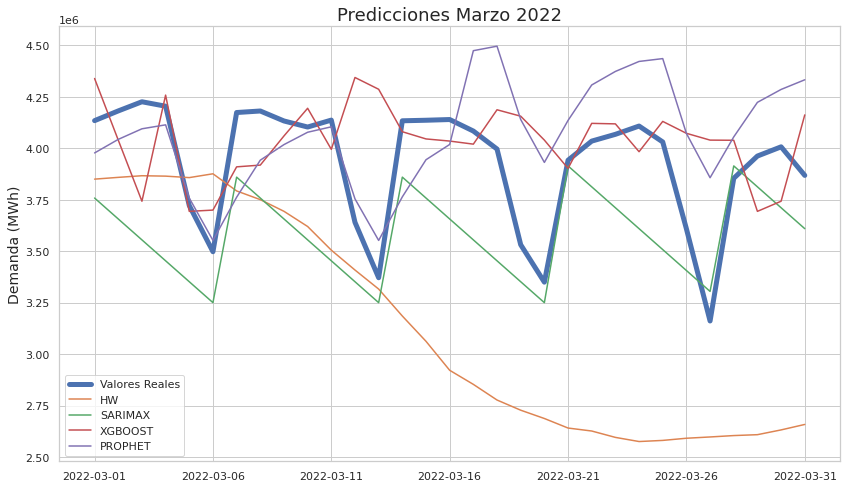

In [261]:
plt.title("Predicciones Marzo 2022", size = 18)
energy_demand_daily_march_2022['value'].plot(legend = True, label='Valores Reales', linewidth=5)
energy_demand_daily_march_2022['hw_predicted'].plot(legend = True, label='HW')
energy_demand_daily_march_2022['sarimax_predicted'].plot(legend = True, label='SARIMAX')
energy_demand_daily_march_2022['xgboost_predicted'].plot(legend = True, label='XGBOOST')
energy_demand_daily_march_2022['prophet_predicted'].plot(legend=True, figsize=(14, 8), label='PROPHET')
plt.xlabel("")
plt.ylabel("Demanda (MWh)", size = 14)
plt.show()

In [262]:
print('===== HOLT-WINTERS (monthly) =====')
print(f'MAE: {mae_hw_march_2022:11.10}')
print(f'MSE: {mse_hw_march_2022:11.10}')
print(f'RMSE: {rmse_hw_march_2022:11.10}')
print('----------------------')
print(f'MAPE: {mape_hw_march_2022:11.10}')
print(f'sMAPE: {smape_hw_march_2022:11.10}')
print('----------------------')
print(f'MASE: {mase_hw_march_2022:11.10}')
print('')
print('===== SARIMAX =====')
print(f'MAE: {mae_sarimax_march_2022:11.10}')
print(f'MSE: {mse_sarimax_march_2022:11.10}')
print(f'RMSE: {rmse_sarimax_march_2022:11.10}')
print('----------------------')
print(f'MAPE: {mape_sarimax_march_2022:11.10}')
print(f'sMAPE: {smape_sarimax_march_2022:11.10}')
print('----------------------')
print(f'MASE: {mase_sarimax_march_2022:11.10}')
print('')
print('===== XGBOOST =====')
print(f'MAE: {mae_xgboost_march_2022:11.10}')
print(f'MSE: {mse_xgboost_march_2022:11.10}')
print(f'RMSE: {rmse_xgboost_march_2022:11.10}')
print('----------------------')
print(f'MAPE: {mape_xgboost_march_2022:11.10}')
print(f'sMAPE: {smape_xgboost_march_2022:11.10}')
print('----------------------')
print(f'MASE: {mase_xgboost_march_2022:11.10}')
print('')
print('===== PROPHET =====')
print(f'MAE: {mae_prophet_march_2022:11.10}')
print(f'MSE: {mse_prophet_march_2022:11.10}')
print(f'RMSE: {rmse_prophet_march_2022:11.10}')
print('----------------------')
print(f'MAPE: {mape_prophet_march_2022:11.10}')
print(f'sMAPE: {smape_prophet_march_2022:11.10}')
print('----------------------')
print(f'MASE: {mase_prophet_march_2022:11.10}')

===== HOLT-WINTERS (monthly) =====
MAE:  824590.722
MSE: 8.974881438e+11
RMSE: 947358.5086
----------------------
MAPE: 0.2089654406
sMAPE: 24.22667723
----------------------
MASE: 82.24534581

===== SARIMAX =====
MAE: 355431.9645
MSE: 1.615464901e+11
RMSE: 401928.4639
----------------------
MAPE: 0.08858327548
sMAPE: 9.370512555
----------------------
MASE: 35.45107173

===== XGBOOST =====
MAE: 262523.4677
MSE: 1.309985531e+11
RMSE: 361937.2226
----------------------
MAPE: 0.07129904655
sMAPE: 6.758292854
----------------------
MASE: 25.94590309

===== PROPHET =====
MAE: 269158.1989
MSE: 1.041174246e+11
RMSE: 322672.3176
----------------------
MAPE: 0.07057858379
sMAPE: 6.792738886
----------------------
MASE: 26.84605655


In [263]:
energy_demand_daily_march_2022

,value,weekday,working_day,is_winter,is_summer,hw_predicted,sarimax_predicted,xgboost_predicted,prophet_predicted
date,,,,,,,,,
2022-03-01,4134510.0,1,1,1,0,3.850385e+06,3.758501e+06,4339192.00,3.977624e+06
2022-03-02,4181750.0,2,1,1,0,3.858979e+06,3.656872e+06,4039948.75,4.043477e+06
2022-03-03,4226210.0,3,1,1,0,3.866891e+06,3.555244e+06,3743034.50,4.094890e+06
2022-03-04,4204637.0,4,1,1,0,3.864935e+06,3.453616e+06,4258560.50,4.114138e+06
2022-03-05,3722126.0,5,1,1,0,3.857794e+06,3.351987e+06,3693822.25,3.758400e+06
2022-03-06,3497731.0,6,1,1,0,3.876350e+06,3.250359e+06,3699985.50,3.552799e+06
2022-03-07,4173965.0,0,1,1,0,3.793038e+06,3.860129e+06,3910022.25,3.762418e+06
2022-03-08,4181348.0,1,1,1,0,3.750760e+06,3.758501e+06,3918542.75,3.942496e+06
2022-03-09,4132968.0,2,1,1,0,3.694051e+06,3.656872e+06,4060145.25,4.018144e+06


In [264]:
energy_demand_daily_march_2022['error_prophet'] = abs(energy_demand_daily_march_2022['value']-energy_demand_daily_march_2022['prophet_predicted'])*100/energy_demand_daily_march_2022['value']

In [265]:
energy_demand_daily_march_2022['error_xgboost'] = abs(energy_demand_daily_march_2022['value']-energy_demand_daily_march_2022['xgboost_predicted'])*100/energy_demand_daily_march_2022['value']

In [266]:
energy_demand_daily_march_2022

,value,weekday,working_day,is_winter,is_summer,hw_predicted,sarimax_predicted,xgboost_predicted,prophet_predicted,error_prophet,error_xgboost
date,,,,,,,,,,,
2022-03-01,4134510.0,1,1,1,0,3.850385e+06,3.758501e+06,4339192.00,3.977624e+06,3.794543,4.950575
2022-03-02,4181750.0,2,1,1,0,3.858979e+06,3.656872e+06,4039948.75,4.043477e+06,3.306587,3.390955
2022-03-03,4226210.0,3,1,1,0,3.866891e+06,3.555244e+06,3743034.50,4.094890e+06,3.107280,11.432832
2022-03-04,4204637.0,4,1,1,0,3.864935e+06,3.453616e+06,4258560.50,4.114138e+06,2.152354,1.282477
2022-03-05,3722126.0,5,1,1,0,3.857794e+06,3.351987e+06,3693822.25,3.758400e+06,0.974552,0.760419
2022-03-06,3497731.0,6,1,1,0,3.876350e+06,3.250359e+06,3699985.50,3.552799e+06,1.574397,5.782449
2022-03-07,4173965.0,0,1,1,0,3.793038e+06,3.860129e+06,3910022.25,3.762418e+06,9.859853,6.323550
2022-03-08,4181348.0,1,1,1,0,3.750760e+06,3.758501e+06,3918542.75,3.942496e+06,5.712313,6.285180
2022-03-09,4132968.0,2,1,1,0,3.694051e+06,3.656872e+06,4060145.25,4.018144e+06,2.778246,1.761996


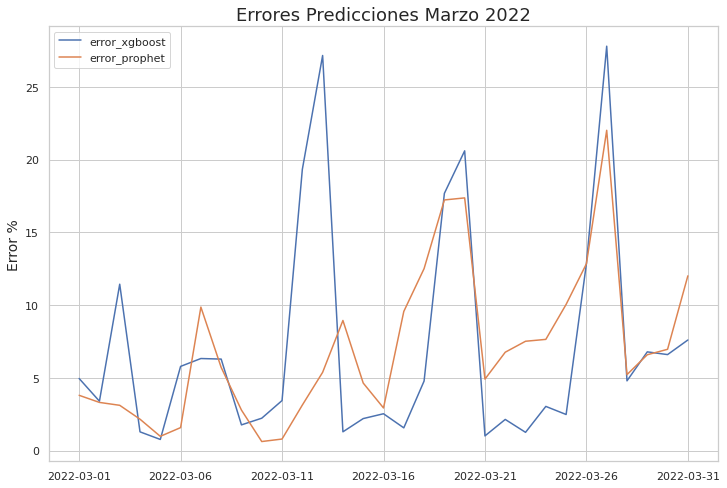

In [267]:
plt.title("Errores Predicciones Marzo 2022", size = 18)
energy_demand_daily_march_2022['error_xgboost'].plot(legend = True)
energy_demand_daily_march_2022['error_prophet'].plot(legend=True, figsize=(12, 8))
plt.xlabel("")
plt.ylabel("Error %", size = 14)
plt.show()